In [ ]:
from google.colab import files
uploaded = files.upload()

Saving chili-001.csv to chili-001.csv


# ASTA on 1DCNN

### Classification model on **ASTA**

usingcudadevice


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


Streaming output truncated to the last 5000 lines.
 the accuracy for the epoch 85 is 0.0882
[[0 0 0 0 6 3 2 3]
 [0 0 0 2 3 1 3 0]
 [0 0 0 0 7 0 2 0]
 [0 2 0 0 5 4 2 1]
 [0 0 1 3 5 2 2 1]
 [1 0 1 3 3 3 3 0]
 [0 4 1 2 3 3 1 0]
 [0 0 0 2 5 4 3 0]]

 the validation loss for the epoch 86 with loss 1.8437 is 2.2353

 the accuracy for the epoch 86 is 0.1176
[[0 1 0 0 6 3 1 3]
 [0 0 0 2 3 1 3 0]
 [0 0 0 0 7 0 2 0]
 [1 2 0 1 6 2 1 1]
 [0 1 1 2 6 2 1 1]
 [2 0 1 2 3 3 3 0]
 [0 4 1 0 3 4 2 0]
 [0 0 0 1 5 5 3 0]]

 the validation loss for the epoch 87 with loss 1.8458 is 2.2485

 the accuracy for the epoch 87 is 0.1078
[[0 0 0 0 6 3 2 3]
 [0 0 0 2 3 1 2 1]
 [0 0 0 0 7 0 2 0]
 [0 3 0 0 6 3 1 1]
 [0 0 1 3 5 2 1 2]
 [1 0 0 2 2 4 5 0]
 [0 4 0 0 3 4 2 1]
 [0 0 0 1 5 5 3 0]]

 the validation loss for the epoch 88 with loss 1.8428 is 2.2465

 the accuracy for the epoch 88 is 0.0882
[[0 2 0 0 4 4 1 3]
 [0 0 0 2 3 1 2 1]
 [0 0 0 0 7 0 2 0]
 [0 3 0 0 5 4 1 1]
 [0 0 1 3 4 3 2 1]
 [1 1 0 4 3 4 1 0]
 [0 4 1 1 3

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

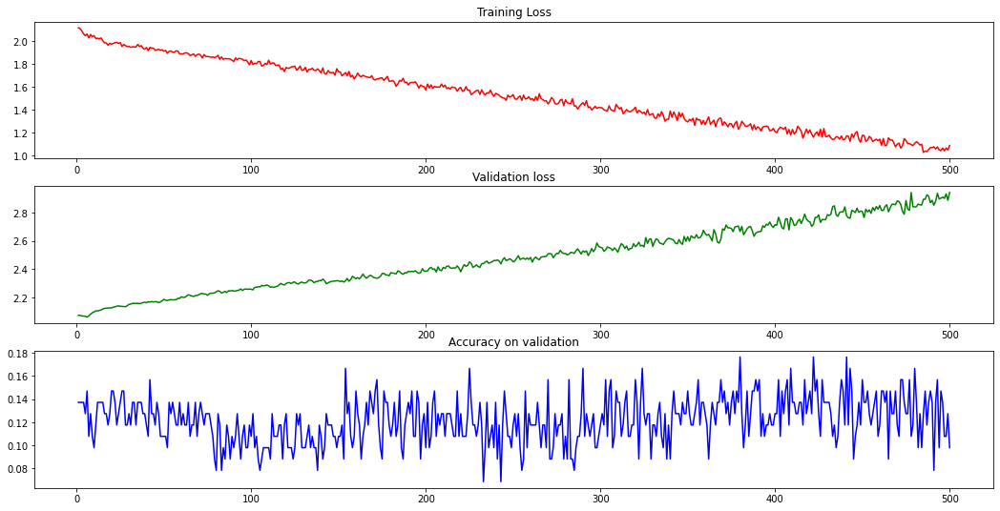

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and without any preprocessing
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20,dtype = torch.float32))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20,dtype = torch.float32))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20,dtype = torch.float32))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20,dtype = torch.float32))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,8))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out


#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3.iloc[:,-1] = int(i)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    """x_asta = d_asta.drop(columns =['ASTA'])
    x_asta_mean = x_asta.mean(axis=1)
    x_asta_std = x_asta.std(axis=1)
    x_asta = x_asta.subtract(x_asta_mean,axis = 0)
    x_asta = x_asta.div(x_asta_std,axis=0)
    x_vals = np.array(x_asta)
    y_vals =  np.array(d_asta['ASTA'])
    x_train,x_test,y_train,y_test = train_test_split(x_vals,y_vals,test_size = 0.075,random_state = sed)"""

    return X_train,Y_train,X_val,Y_val

def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.CrossEntropyLoss()
    loss.to(device=device)
    file_name = '/content/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    Acc = [] # to store accuracy
    model_path =''

    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = torch.from_numpy(z_y[i])
            t_y_org = Variable(t_y_org,requires_grad=False).to(device,dtype = torch.int64)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        tru =[]
        pred = []

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.int64)
            #v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #print(v_yhat.shape)
            v_yhat_1 = v_yhat.argmax(axis = 1)
            #print(v_yhat_1.shape)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            #print(v_y_1.shape)
            v_yhat_1 = v_yhat_1.to('cpu')
            acc = sklearn.metrics.accuracy_score(v_y_1,v_yhat_1)
            Acc.append(acc)
            print('\n the accuracy for the epoch %d is %.4f'%(e+1,acc))
            CM2 = sklearn.metrics.confusion_matrix(v_y_1,v_yhat_1)
            print(CM2)

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                best_acc = acc
                best_CM2 = CM2
                model_path = 'model_asta_40_120_2_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()
            #nvmlInit()
            #h = nvmlDeviceGetHandleByIndex(0)
            #info = nvmlDeviceGetMemoryInfo(h)
            #print(f'total    : {info.total}')
            #print(f'free     : {info.free}')
            #print(f'used     : {info.used}')

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the acc of best model is %.4f '%(best_acc))
    print('the CM2 of the best model is ')
    print(best_CM2)
    
    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('Accuracy on validation')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,Acc,color = 'blue')

    dir = 'figg_asta_ann_40_120_2'
    fig.savefig(dir)
    files.download(dir+'.png')
    torch.save(model.state_dict(),dir_path)
    files.download(dir_path)



if __name__ == '__main__':
    run()

# model for classification with cross entropy loss lr = 0.00001 and range of asta from 40 - 120


### 1st Model on ASTA using 1DCNN

usingcudadevice

 the validation loss for the epoch 1 with loss 80.4252 is 81.1911

 the r2 score for the epoch 1 with loss 80.4252 is -12.5070

 the validation loss for the epoch 2 with loss 79.3161 is 81.1563

 the r2 score for the epoch 2 with loss 79.3161 is -12.4964

 the validation loss for the epoch 3 with loss 78.2481 is 80.9979

 the r2 score for the epoch 3 with loss 78.2481 is -12.4485

 the validation loss for the epoch 4 with loss 77.2878 is 80.4526

 the r2 score for the epoch 4 with loss 77.2878 is -12.2838

 the validation loss for the epoch 5 with loss 76.3224 is 79.4288

 the r2 score for the epoch 5 with loss 76.3224 is -11.9770

 the validation loss for the epoch 6 with loss 75.3798 is 77.9043

 the r2 score for the epoch 6 with loss 75.3798 is -11.5294

 the validation loss for the epoch 7 with loss 74.3810 is 76.0571

 the r2 score for the epoch 7 with loss 74.3810 is -10.9970

 the validation loss for the epoch 8 with loss 73.4373 is 74.2680

 the r2 score for th

FileNotFoundError: ignored

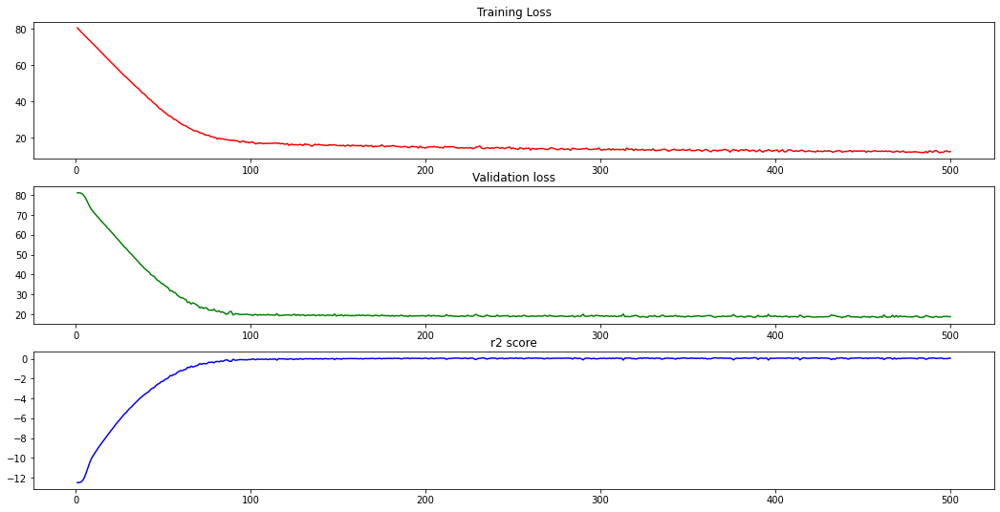

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and without any preprocessing with huberloss
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out


#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    return X_train,Y_train,X_val,Y_val

def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.HuberLoss()
    loss.to(device=device)
    file_name = '/content/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)
            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_1_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    dir = 'figg_asta_ann_40_120_1'
    fig.savefig(dir)
    files.download(dir)
    torch.save(model.state_dict(),dir_path)
    files.download(dir_path)

if __name__ == '__main__':
    run()





usingcudadevice

 the validation loss for the epoch 1 with loss 79.9921 is 81.1400

 the r2 score for the epoch 1 with loss 79.9921 is -12.4913

 the validation loss for the epoch 2 with loss 78.1311 is 81.0284

 the r2 score for the epoch 2 with loss 78.1311 is -12.4572

 the validation loss for the epoch 3 with loss 76.5192 is 80.8890

 the r2 score for the epoch 3 with loss 76.5192 is -12.4146

 the validation loss for the epoch 4 with loss 75.1467 is 80.6746

 the r2 score for the epoch 4 with loss 75.1467 is -12.3493

 the validation loss for the epoch 5 with loss 73.7504 is 80.4919

 the r2 score for the epoch 5 with loss 73.7504 is -12.2939

 the validation loss for the epoch 6 with loss 72.5803 is 80.2101

 the r2 score for the epoch 6 with loss 72.5803 is -12.2086

 the validation loss for the epoch 7 with loss 71.4208 is 79.4819

 the r2 score for the epoch 7 with loss 71.4208 is -11.9900

 the validation loss for the epoch 8 with loss 70.3752 is 77.7229

 the r2 score for th

FileNotFoundError: ignored

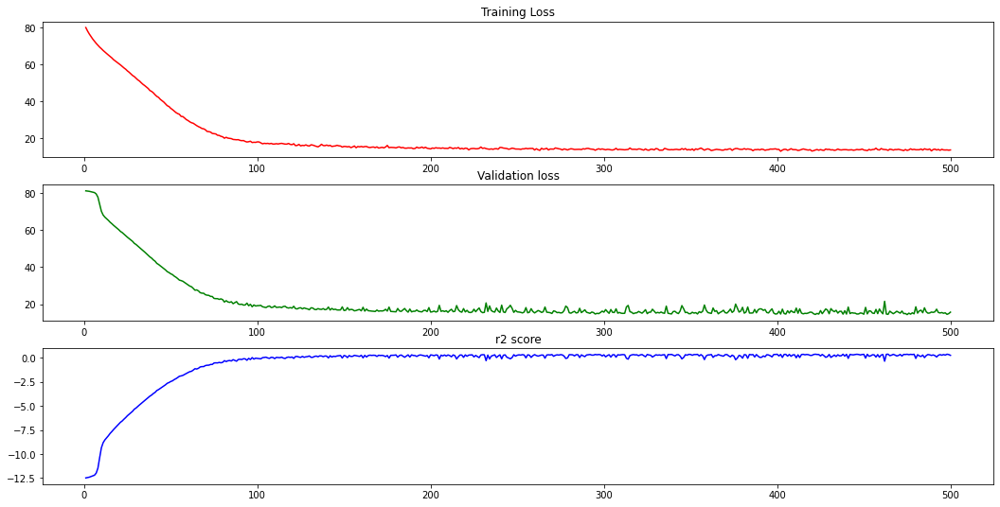

In [ ]:
# the regression model with data preprocessing on range 40-120 with hubert loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with huberloss
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    X_train = moving_smoothing(X_train,21)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,21,4)

    X_val = moving_smoothing(X_val,21)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,21,4)


    return X_train,Y_train,X_val,Y_val

def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.HuberLoss()
    loss.to(device=device)
    file_name = '/content/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)
            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_1_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    dir = 'figg_asta_ann_40_120_1_with_pre'
    fig.savefig(dir)
    files.download(dir)
    torch.save(model.state_dict(),dir_path)
    files.download(dir_path)

if __name__ == '__main__':
    run()

In [ ]:
# the regression model with data preprocessing on range 40-120 with hubert loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with huberloss
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    X_train = moving_smoothing(X_train,21)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,21,4)

    X_val = moving_smoothing(X_val,21)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,21,4)


    return X_train,Y_train,X_val,Y_val

def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.HuberLoss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)
            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_1_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    dir = 'figg_asta_ann_40_120_1_with_pre'
    fig.savefig(dir)
    files.download(dir)
    torch.save(model.state_dict(),dir_path)
    files.download(dir_path)

if __name__ == '__main__':
    run()

usingcudadevice

 the validation loss for the epoch 1 with loss 79.9921 is 81.1400

 the r2 score for the epoch 1 with loss 79.9921 is -12.4913

 the validation loss for the epoch 2 with loss 78.1311 is 81.0284

 the r2 score for the epoch 2 with loss 78.1311 is -12.4572

 the validation loss for the epoch 3 with loss 76.5192 is 80.8890

 the r2 score for the epoch 3 with loss 76.5192 is -12.4146

 the validation loss for the epoch 4 with loss 75.1467 is 80.6746

 the r2 score for the epoch 4 with loss 75.1467 is -12.3493

 the validation loss for the epoch 5 with loss 73.7504 is 80.4919

 the r2 score for the epoch 5 with loss 73.7504 is -12.2939

 the validation loss for the epoch 6 with loss 72.5803 is 80.2101

 the r2 score for the epoch 6 with loss 72.5803 is -12.2086

 the validation loss for the epoch 7 with loss 71.4208 is 79.4819

 the r2 score for the epoch 7 with loss 71.4208 is -11.9900


KeyboardInterrupt: ignored

1st 1DCNN on asta using adversarial learning

usingcudadevice

 the validation loss for the epoch 1 with loss 80.4921 is 81.6400

 the r2 score for the epoch 1 with loss 80.4921 is -12.4913

 the validation loss for the epoch 2 with loss 78.6311 is 81.5284

 the r2 score for the epoch 2 with loss 78.6311 is -12.4572

 the validation loss for the epoch 3 with loss 77.0192 is 81.3890

 the r2 score for the epoch 3 with loss 77.0192 is -12.4146

 the validation loss for the epoch 4 with loss 75.6467 is 81.1746

 the r2 score for the epoch 4 with loss 75.6467 is -12.3493

 the validation loss for the epoch 5 with loss 74.2504 is 80.9919

 the r2 score for the epoch 5 with loss 74.2504 is -12.2939

 the validation loss for the epoch 6 with loss 73.0803 is 80.7101

 the r2 score for the epoch 6 with loss 73.0803 is -12.2086

 the validation loss for the epoch 7 with loss 71.9208 is 79.9820

 the r2 score for the epoch 7 with loss 71.9208 is -11.9900

 the validation loss for the epoch 8 with loss 70.8752 is 78.2229

 the r2 score for th

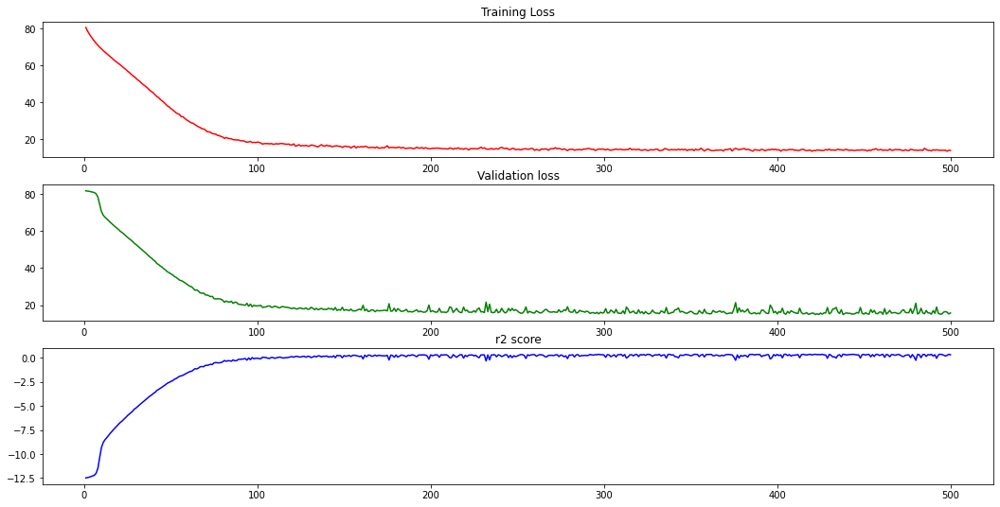

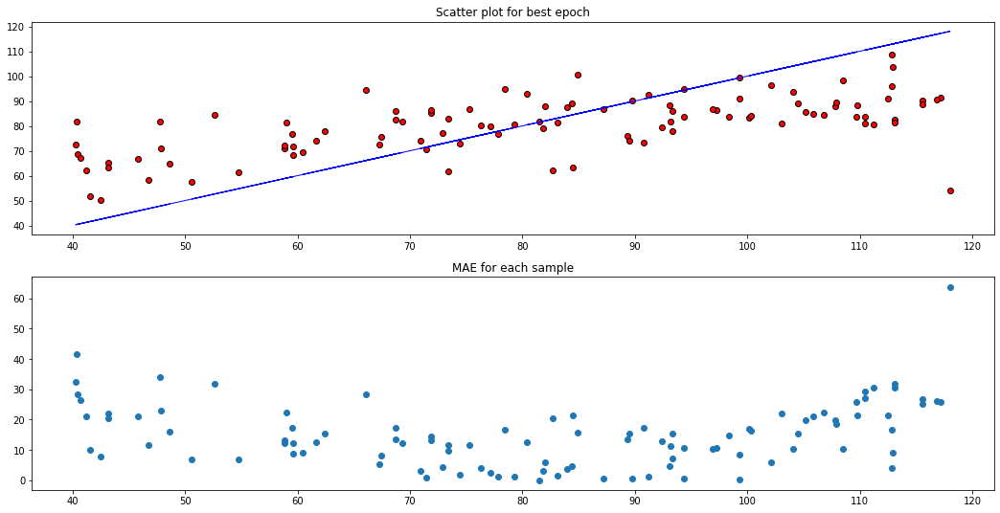

In [ ]:
 # the regression model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with L1loss and adam optimizer
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    X_train = moving_smoothing(X_train,21)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,21,4)

    X_val = moving_smoothing(X_val,21)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,21,4)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)
            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - v_y_1)
    ax5.plot(v_y_1,ttt,marker ='o',linestyle='')
    ax4.scatter(v_y_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(v_y_1,v_y_1,c='blue',linewidth = 1)
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

if __name__ == '__main__':
    run()

usingcudadevice

 the validation loss for the epoch 1 with loss 80.4921 is 81.6400

 the r2 score for the epoch 1 with loss 80.4921 is -12.4913

 the validation loss for the epoch 2 with loss 78.6311 is 81.5284

 the r2 score for the epoch 2 with loss 78.6311 is -12.4572

 the validation loss for the epoch 3 with loss 77.0192 is 81.3890

 the r2 score for the epoch 3 with loss 77.0192 is -12.4146

 the validation loss for the epoch 4 with loss 75.6467 is 81.1746

 the r2 score for the epoch 4 with loss 75.6467 is -12.3493

 the validation loss for the epoch 5 with loss 74.2504 is 80.9919

 the r2 score for the epoch 5 with loss 74.2504 is -12.2939

 the validation loss for the epoch 6 with loss 73.0803 is 80.7101

 the r2 score for the epoch 6 with loss 73.0803 is -12.2086

 the validation loss for the epoch 7 with loss 71.9208 is 79.9819

 the r2 score for the epoch 7 with loss 71.9208 is -11.9900

 the validation loss for the epoch 8 with loss 70.8752 is 78.2229

 the r2 score for th

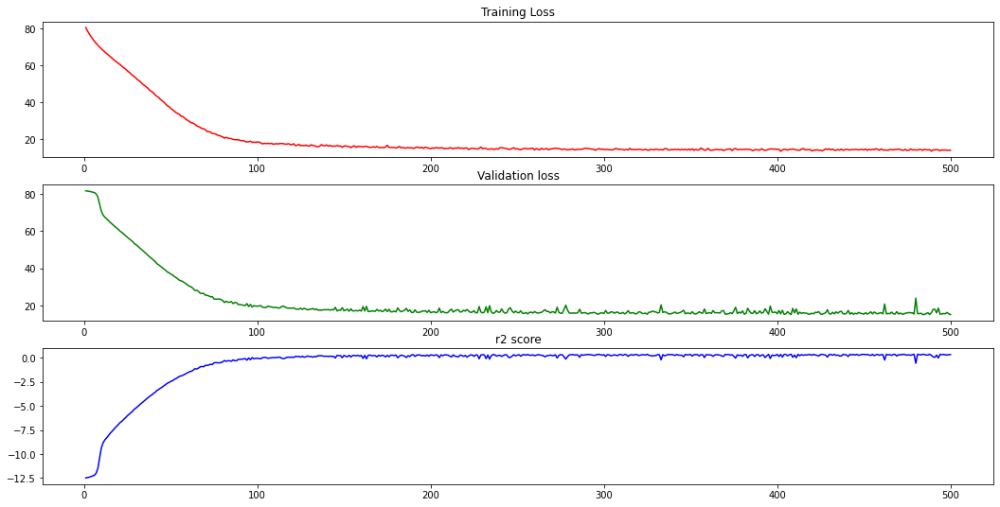

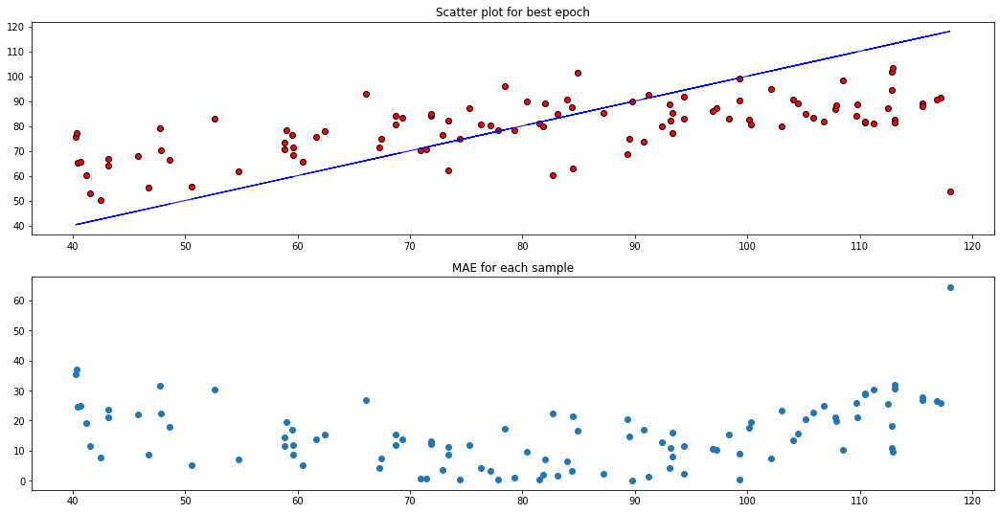

In [ ]:
 # the regression model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = moving_smoothing(X_train,21)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,21,4)

    X_val = moving_smoothing(X_val,21)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,21,4)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

usingcudadevice

 the validation loss for the epoch 1 with loss 80.4716 is 81.6545

 the r2 score for the epoch 1 with loss 80.4716 is -12.4958

 the validation loss for the epoch 2 with loss 78.4665 is 81.5550

 the r2 score for the epoch 2 with loss 78.4665 is -12.4653

 the validation loss for the epoch 3 with loss 76.7743 is 81.4127

 the r2 score for the epoch 3 with loss 76.7743 is -12.4219

 the validation loss for the epoch 4 with loss 75.4028 is 81.2393

 the r2 score for the epoch 4 with loss 75.4028 is -12.3690

 the validation loss for the epoch 5 with loss 74.0178 is 81.0562

 the r2 score for the epoch 5 with loss 74.0178 is -12.3134

 the validation loss for the epoch 6 with loss 72.9116 is 80.7289

 the r2 score for the epoch 6 with loss 72.9116 is -12.2143

 the validation loss for the epoch 7 with loss 71.7642 is 79.9542

 the r2 score for the epoch 7 with loss 71.7642 is -11.9819

 the validation loss for the epoch 8 with loss 70.7237 is 77.8150

 the r2 score for th

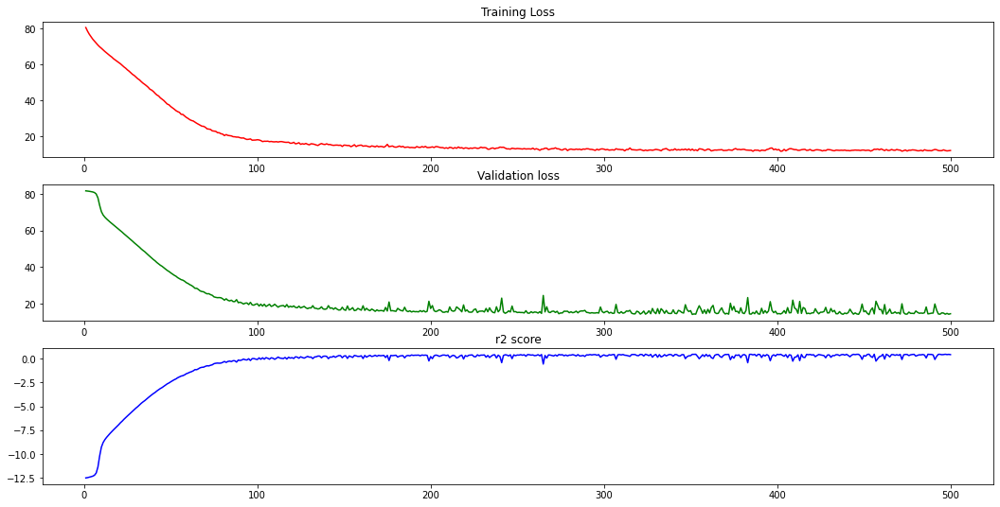

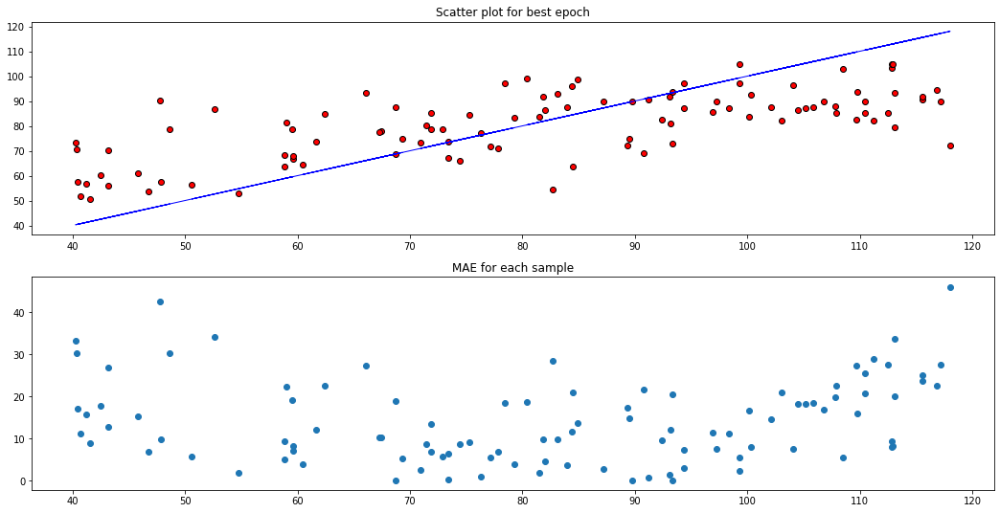

In [ ]:
 # the regression model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

usingcudadevice

 the validation loss for the epoch 1 with loss 80.7081 is 81.1396

 the r2 score for the epoch 1 with loss 80.7081 is -12.4912

 the validation loss for the epoch 2 with loss 79.7457 is 81.0238

 the r2 score for the epoch 2 with loss 79.7457 is -12.4558

 the validation loss for the epoch 3 with loss 78.7886 is 80.8846

 the r2 score for the epoch 3 with loss 78.7886 is -12.4133

 the validation loss for the epoch 4 with loss 77.9102 is 80.7226

 the r2 score for the epoch 4 with loss 77.9102 is -12.3639

 the validation loss for the epoch 5 with loss 76.9172 is 80.5500

 the r2 score for the epoch 5 with loss 76.9172 is -12.3114

 the validation loss for the epoch 6 with loss 75.9704 is 80.4164

 the r2 score for the epoch 6 with loss 75.9704 is -12.2709

 the validation loss for the epoch 7 with loss 74.8263 is 79.9471

 the r2 score for the epoch 7 with loss 74.8263 is -12.1294

 the validation loss for the epoch 8 with loss 73.5862 is 78.9304

 the r2 score for th

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

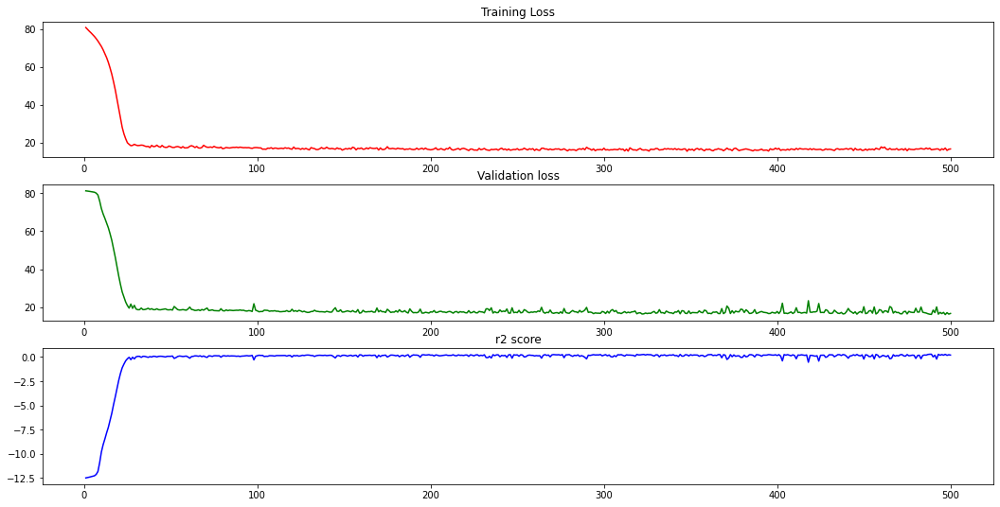

In [ ]:
# the regression model with data preprocessing on range 40-120 with L1 loss and sgd
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
#from pytorch_forecasting.metrics import MAPE
# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with L1loss
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    X_train = moving_smoothing(X_train,21)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,21,4)

    X_val = moving_smoothing(X_val,21)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,21,4)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.SGD(model.parameters(),lr = 0.00001,momentum = 0.9)
    loss = nn.HuberLoss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)
            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_l1_sgd_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    dir = 'figg_asta_ann_40_120_L1_sgd_with_pre'
    fig.savefig(dir)
    files.download(dir+'.png')
    torch.save(model.state_dict(),dir_path)
    files.download(dir_path)

if __name__ == '__main__':
    run()

### When switched the preprocessing window to 11,2 for savgol for 1DCNN

usingcudadevice

 the validation loss for the epoch 1 with loss 83.4973 is 84.7192

 the r2 score for the epoch 1 with loss 83.4973 is -18.9184

 the validation loss for the epoch 2 with loss 81.2411 is 84.5885

 the r2 score for the epoch 2 with loss 81.2411 is -18.8601

 the validation loss for the epoch 3 with loss 79.4374 is 84.4164

 the r2 score for the epoch 3 with loss 79.4374 is -18.7834

 the validation loss for the epoch 4 with loss 77.8339 is 84.2187

 the r2 score for the epoch 4 with loss 77.8339 is -18.6955

 the validation loss for the epoch 5 with loss 76.4937 is 83.9726

 the r2 score for the epoch 5 with loss 76.4937 is -18.5859

 the validation loss for the epoch 6 with loss 75.1815 is 83.1607

 the r2 score for the epoch 6 with loss 75.1815 is -18.2259

 the validation loss for the epoch 7 with loss 74.0461 is 80.6762

 the r2 score for the epoch 7 with loss 74.0461 is -17.1470

 the validation loss for the epoch 8 with loss 72.8800 is 76.0236

 the r2 score for th

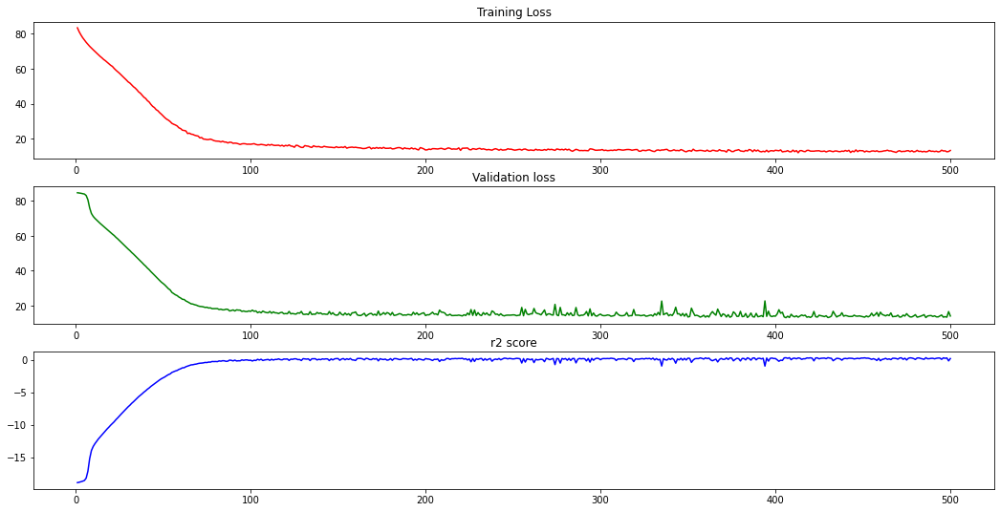

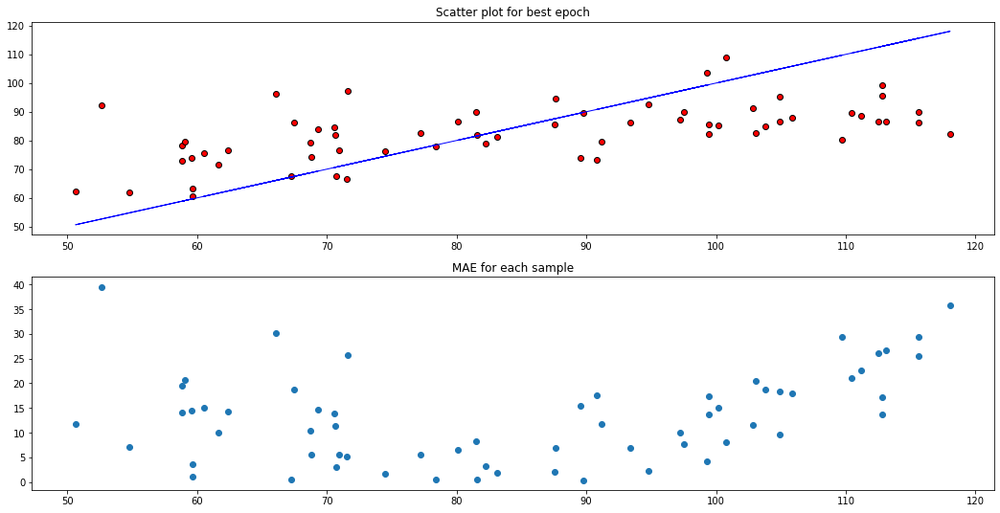

In [ ]:
 # the regression model with data preprocessing on range 50-120 with L1 loss, preprocessing used savgol(11,2), MSC, detrending and 1st derivative (11,2)
 # with batch size 35

import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 35 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [70,70,70,70,70,70,70] # for 490 samples to train.
    k = 50
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)
        data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        #if (len(data_asta_3_2.index)<14):
            #data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        #else:
            #data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 500
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.00001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_50_120_L1_adam_11_1{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_50_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred_50_120.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred_50_120.csv')


if __name__ == '__main__':
    run()

### Classification of the devices model

usingcudadevice

 the validation loss for the epoch 1 with loss 0.6951 is 0.7007

 the accuracy for the epoch 1 is 0.4787

 the validation loss for the epoch 2 with loss 0.6733 is 0.7258

 the accuracy for the epoch 2 is 0.4787

 the validation loss for the epoch 3 with loss 0.6576 is 0.7456

 the accuracy for the epoch 3 is 0.4787

 the validation loss for the epoch 4 with loss 0.6566 is 0.7276

 the accuracy for the epoch 4 is 0.4787

 the validation loss for the epoch 5 with loss 0.6403 is 0.6997

 the accuracy for the epoch 5 is 0.4787

 the validation loss for the epoch 6 with loss 0.6145 is 0.6232

 the accuracy for the epoch 6 is 0.7979

 the validation loss for the epoch 7 with loss 0.6144 is 0.5814

 the accuracy for the epoch 7 is 0.8298

 the validation loss for the epoch 8 with loss 0.6040 is 0.5644

 the accuracy for the epoch 8 is 0.8511

 the validation loss for the epoch 9 with loss 0.5856 is 0.5480

 the accuracy for the epoch 9 is 0.8617

 the validation loss for the 

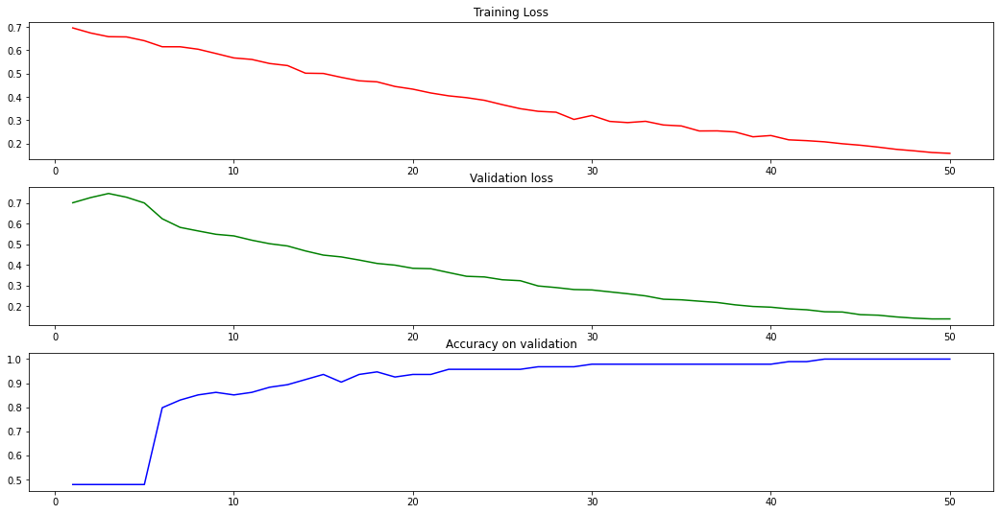

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        #self.regress = nn.Sequential()
        #self.regress.add_module('ANN_1',nn.Linear(1024,100))
        #self.regress.add_module('ANN_Relu',nn.ReLU())
        #self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        #self.regress.add_module('ANN_2',nn.Linear(100,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,100))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(100,2))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        #rev_fea = Rev_grad.apply(x,alpha)
        #x_out = self.regress(x)
        d_out = self.rev(x)
        return d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap','ASTA']
    d_asta = df.drop(columns=col)
    #d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)

    d_asta_2_1 = d_asta.sample(1000,random_state = sed)
    d_asta_2_2 = d_asta.drop(d_asta_2_1.index)

    X_train = np.array(d_asta_2_1.drop(columns = 'Device ID'))
    Y_train = np.array(d_asta_2_1['Device ID'])
    X_val = np.array(d_asta_2_2.drop(columns = 'Device ID'))
    Y_val = np.array(d_asta_2_2['Device ID'])

    #print(X_train.shape)
    #print(X_val.shape)

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 50
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    #loss = nn.L1Loss()
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    ### code to add
    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    Acc = [] # to store accuracy
    model_path =''

    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = torch.from_numpy(z_y[i])
            t_y_org = Variable(t_y_org,requires_grad=False).to(device,dtype = torch.int64)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err = rev_loss(t_yhat,t_y_org)
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        tru =[]
        pred = []

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.int64)
            #v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #print(v_yhat.shape)
            v_yhat_1 = v_yhat.argmax(axis = 1)
            #print(v_yhat_1.shape)
            #v_yhat = torch.exp(v_yhat)
            v_loss = rev_loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            #print(v_y_1.shape)
            v_yhat_1 = v_yhat_1.to('cpu')
            acc = sklearn.metrics.accuracy_score(v_y_1,v_yhat_1)
            Acc.append(acc)
            print('\n the accuracy for the epoch %d is %.4f'%(e+1,acc))
            CM2 = sklearn.metrics.confusion_matrix(v_y_1,v_yhat_1)
            #print(CM2)

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                best_acc = acc
                best_CM2 = CM2
                model_path = 'model_device_1_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()
            #nvmlInit()
            #h = nvmlDeviceGetHandleByIndex(0)
            #info = nvmlDeviceGetMemoryInfo(h)
            #print(f'total    : {info.total}')
            #print(f'free     : {info.free}')
            #print(f'used     : {info.used}')

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the acc of best model is %.4f '%(best_acc))
    print('the CM2 of the best model is ')
    print(best_CM2)
    
    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('Accuracy on validation')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,Acc,color = 'blue')

if __name__ == '__main__':
    run()

Training with GRL with very low factor, it takes aprrox 50 epch for classification and 2000 epoch for best r2 score, hence lets take the factor to effect be .1 - to influence

### So modelling of asta using gradinet reversal layer on 1dcnn

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 2751 with loss 11.7930 is 0.4734

 the validation loss for the epoch 2752 with loss 11.5301 is 14.0192

 the r2 score for the epoch 2752 with loss 11.5301 is 0.4354

 the validation loss for the epoch 2753 with loss 11.3104 is 14.5899

 the r2 score for the epoch 2753 with loss 11.3104 is 0.3863

 the validation loss for the epoch 2754 with loss 11.3358 is 13.7310

 the r2 score for the epoch 2754 with loss 11.3358 is 0.4640

 the validation loss for the epoch 2755 with loss 11.4157 is 15.0456

 the r2 score for the epoch 2755 with loss 11.4157 is 0.3552

 the validation loss for the epoch 2756 with loss 12.0058 is 13.7636

 the r2 score for the epoch 2756 with loss 12.0058 is 0.4636

 the validation loss for the epoch 2757 with loss 11.7834 is 14.0102

 the r2 score for the epoch 2757 with loss 11.7834 is 0.4336

 the validation loss for the epoch 2758 with loss 11.2909 is 13.7113

 the r2 score for the ep

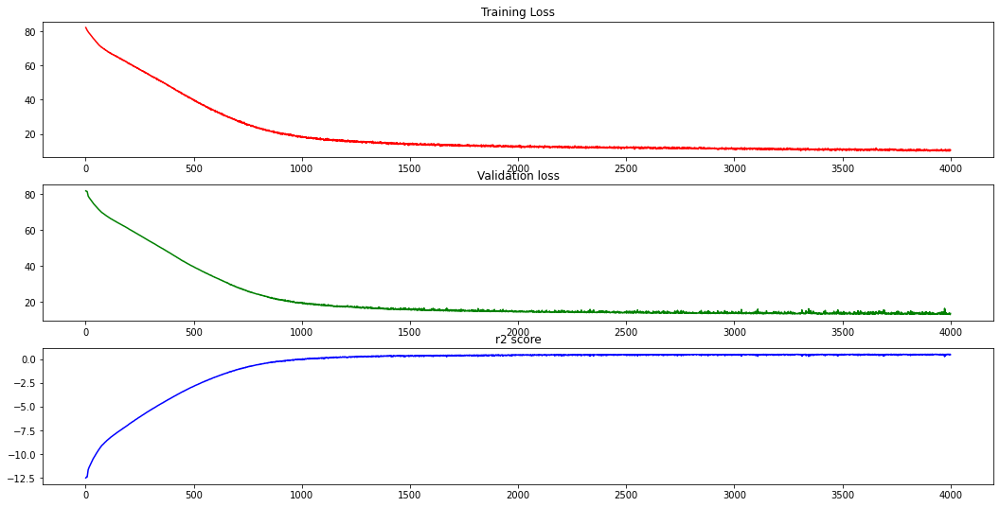

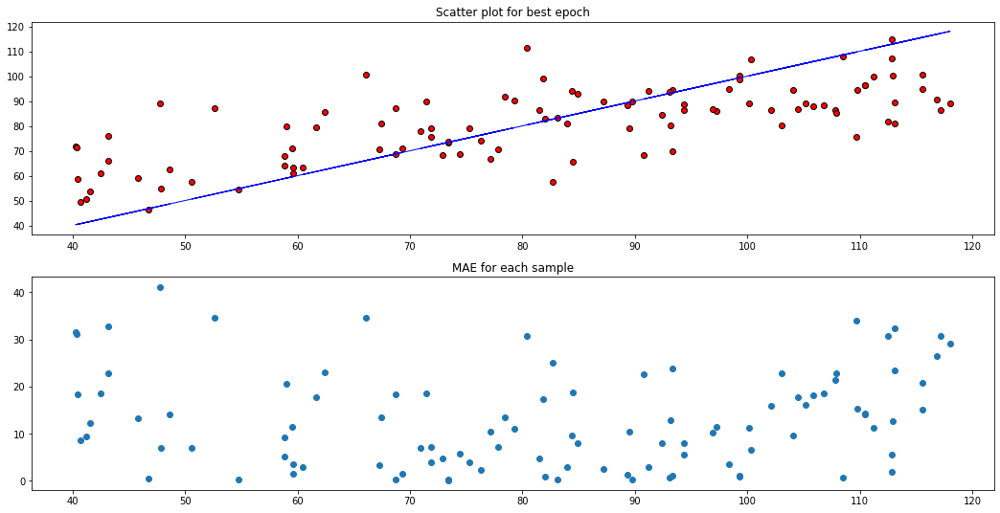

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,100))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(100,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 4000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg + err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 2751 with loss 11.4094 is 0.4663

 the validation loss for the epoch 2752 with loss 10.5974 is 13.8936

 the r2 score for the epoch 2752 with loss 10.5974 is 0.4417

 the validation loss for the epoch 2753 with loss 10.8399 is 13.6643

 the r2 score for the epoch 2753 with loss 10.8399 is 0.4599

 the validation loss for the epoch 2754 with loss 10.4922 is 13.6048

 the r2 score for the epoch 2754 with loss 10.4922 is 0.4640

 the validation loss for the epoch 2755 with loss 10.9258 is 14.0145

 the r2 score for the epoch 2755 with loss 10.9258 is 0.4343

 the validation loss for the epoch 2756 with loss 11.3963 is 13.7707

 the r2 score for the epoch 2756 with loss 11.3963 is 0.4506

 the validation loss for the epoch 2757 with loss 10.9683 is 13.6300

 the r2 score for the epoch 2757 with loss 10.9683 is 0.4546

 the validation loss for the epoch 2758 with loss 10.7480 is 13.4762

 the r2 score for the ep

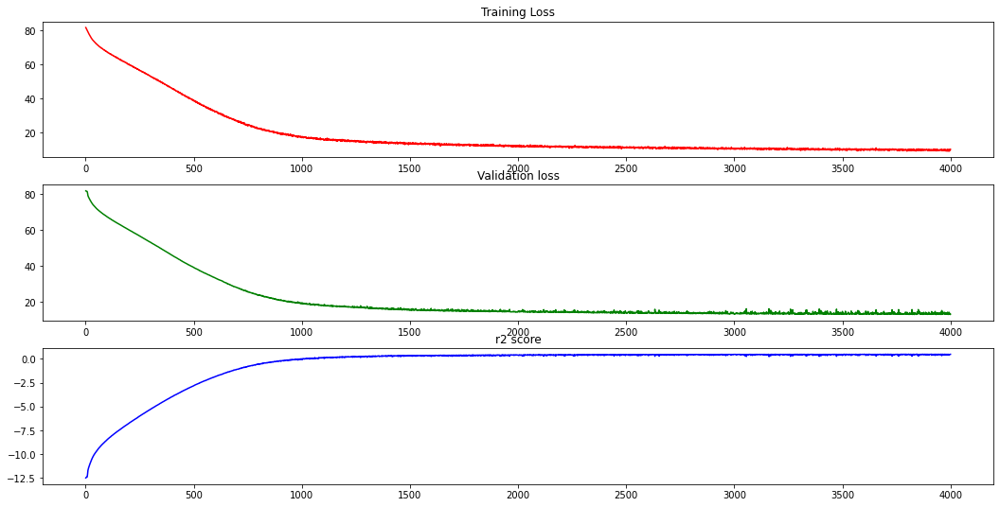

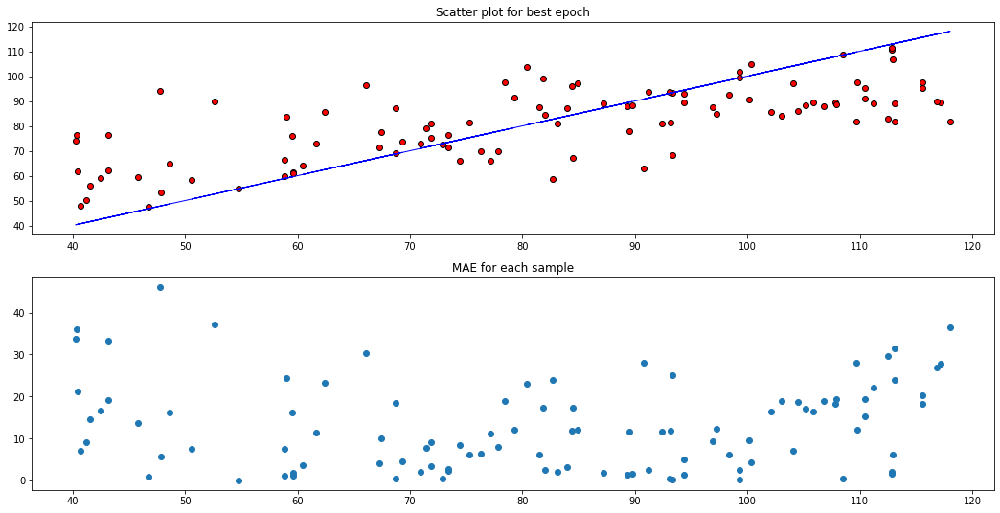

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,100))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(100,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 4000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg + 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

### Trying ASTA with 0-799 features instead of 150-750 with different model configuration , the kernel size of 21 windows and the kernel size of maxpool for consecutive layers is 2,3,3,3

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 2751 with loss 9.4315 is 0.5005

 the validation loss for the epoch 2752 with loss 8.5865 is 12.1409

 the r2 score for the epoch 2752 with loss 8.5865 is 0.4854

 the validation loss for the epoch 2753 with loss 9.3203 is 12.3402

 the r2 score for the epoch 2753 with loss 9.3203 is 0.4745

 the validation loss for the epoch 2754 with loss 9.3160 is 12.2622

 the r2 score for the epoch 2754 with loss 9.3160 is 0.4915

 the validation loss for the epoch 2755 with loss 9.2958 is 12.3574

 the r2 score for the epoch 2755 with loss 9.2958 is 0.4803

 the validation loss for the epoch 2756 with loss 9.1268 is 12.5473

 the r2 score for the epoch 2756 with loss 9.1268 is 0.4672

 the validation loss for the epoch 2757 with loss 8.7071 is 12.1272

 the r2 score for the epoch 2757 with loss 8.7071 is 0.4936

 the validation loss for the epoch 2758 with loss 8.8260 is 11.9883

 the r2 score for the epoch 2758 with 

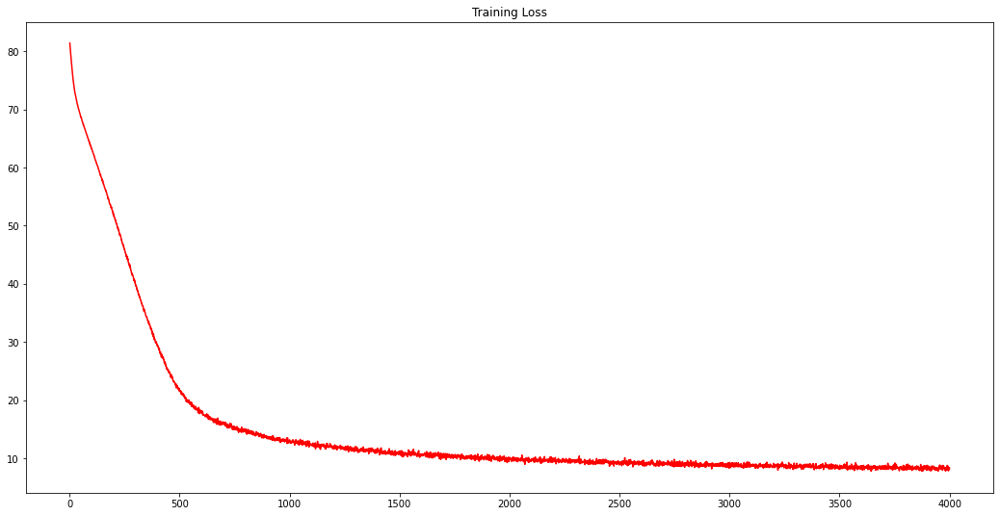

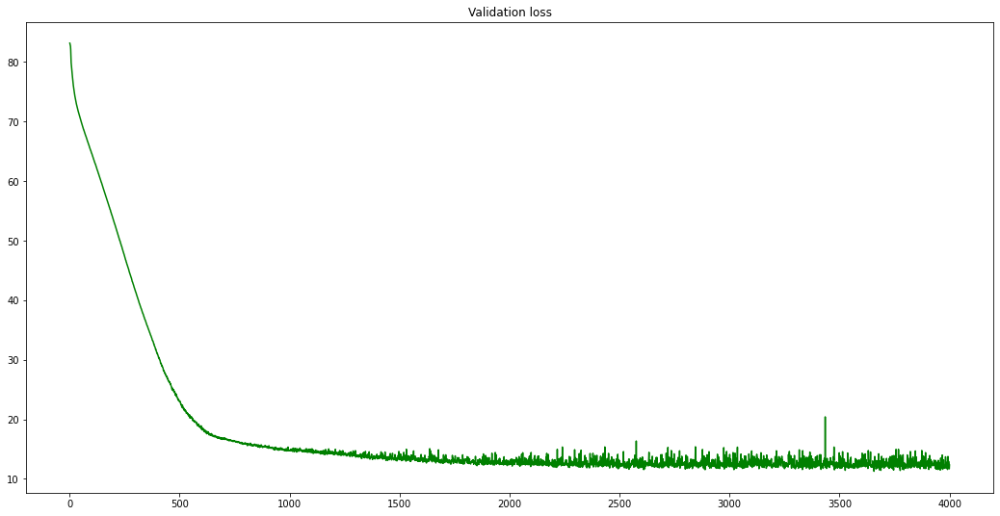

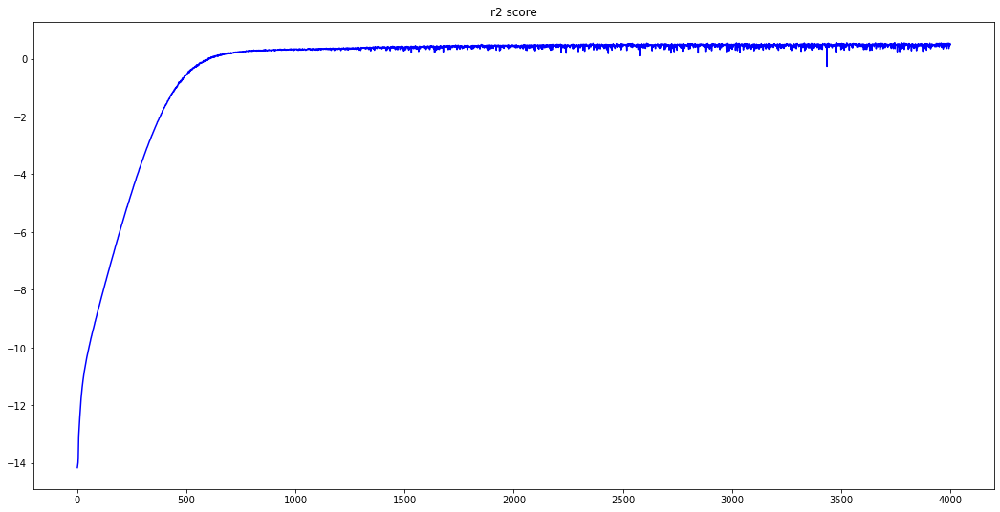

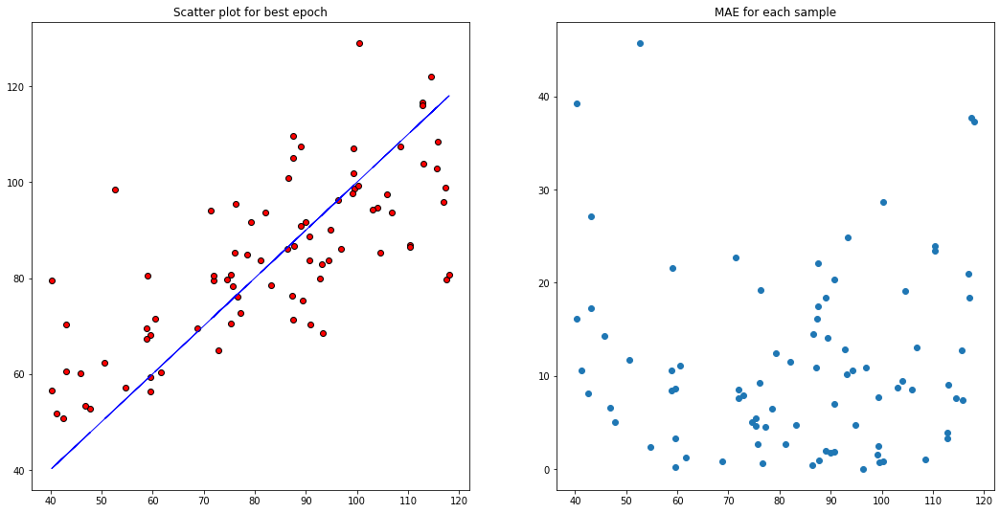

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,128))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(128,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 4000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg + 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

With increased ANN size for training for chili asta

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 2751 with loss 10.6309 is 0.4510

 the validation loss for the epoch 2752 with loss 10.2490 is 12.0218

 the r2 score for the epoch 2752 with loss 10.2490 is 0.5129

 the validation loss for the epoch 2753 with loss 10.2859 is 12.1480

 the r2 score for the epoch 2753 with loss 10.2859 is 0.5275

 the validation loss for the epoch 2754 with loss 10.1683 is 12.7459

 the r2 score for the epoch 2754 with loss 10.1683 is 0.4837

 the validation loss for the epoch 2755 with loss 10.4973 is 12.8324

 the r2 score for the epoch 2755 with loss 10.4973 is 0.4495

 the validation loss for the epoch 2756 with loss 10.2273 is 12.7416

 the r2 score for the epoch 2756 with loss 10.2273 is 0.4545

 the validation loss for the epoch 2757 with loss 10.3179 is 12.0956

 the r2 score for the epoch 2757 with loss 10.3179 is 0.5151

 the validation loss for the epoch 2758 with loss 10.5619 is 11.6893

 the r2 score for the ep

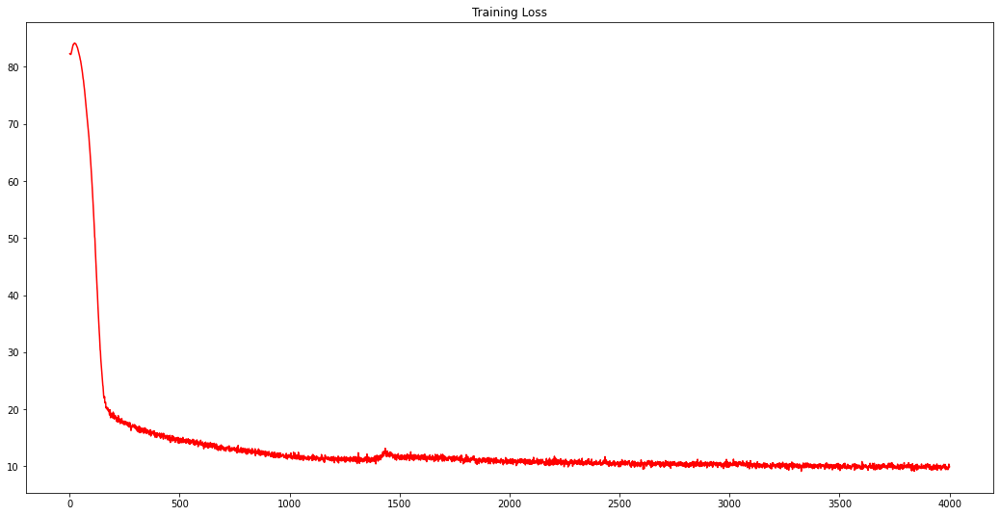

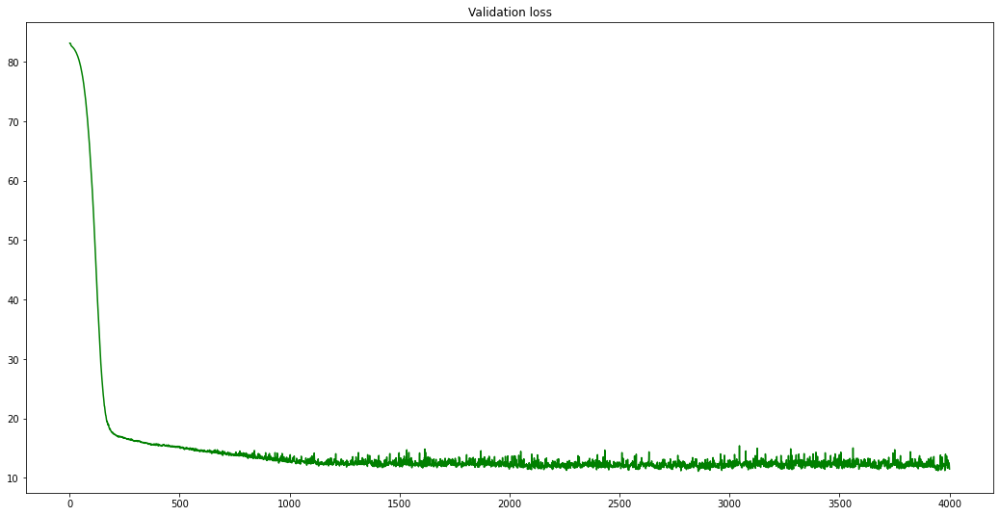

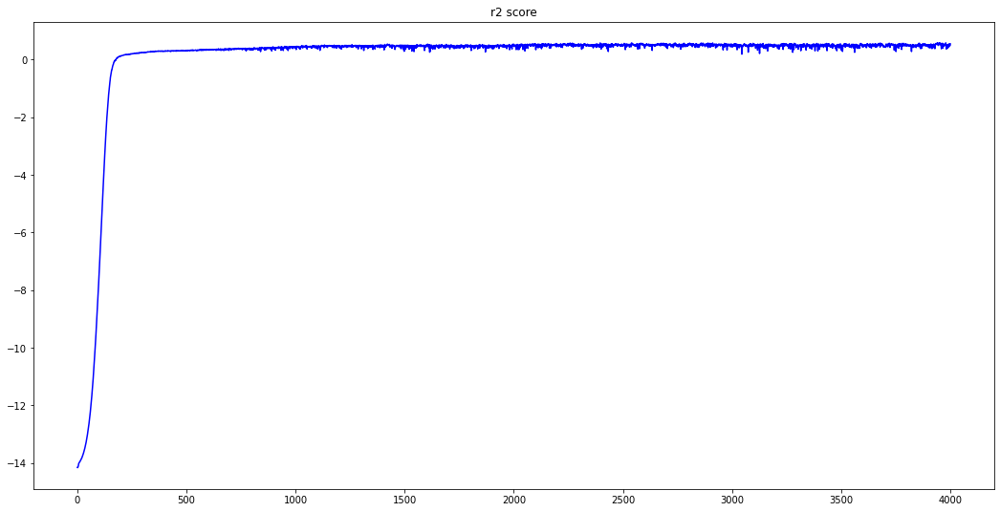

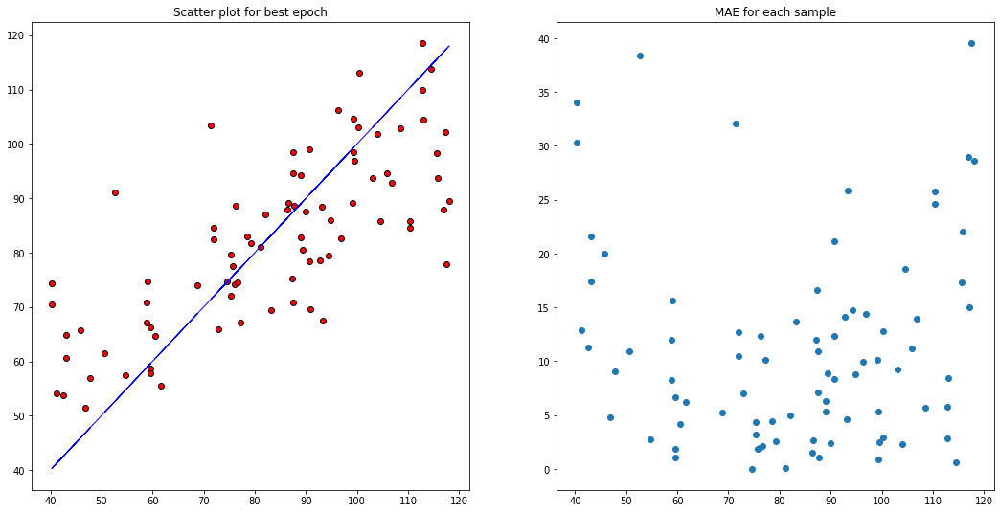

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 4000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg + err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

the one with dense ANN but no adversarial learning

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 2751 with loss 9.7435 is 0.5098

 the validation loss for the epoch 2752 with loss 9.6622 is 12.0704

 the r2 score for the epoch 2752 with loss 9.6622 is 0.5166

 the validation loss for the epoch 2753 with loss 9.6089 is 12.1689

 the r2 score for the epoch 2753 with loss 9.6089 is 0.4975

 the validation loss for the epoch 2754 with loss 8.9966 is 13.8856

 the r2 score for the epoch 2754 with loss 8.9966 is 0.3605

 the validation loss for the epoch 2755 with loss 9.8345 is 12.2760

 the r2 score for the epoch 2755 with loss 9.8345 is 0.4909

 the validation loss for the epoch 2756 with loss 9.2792 is 11.2979

 the r2 score for the epoch 2756 with loss 9.2792 is 0.5694

 the validation loss for the epoch 2757 with loss 9.5024 is 12.3729

 the r2 score for the epoch 2757 with loss 9.5024 is 0.4946

 the validation loss for the epoch 2758 with loss 9.2583 is 13.1678

 the r2 score for the epoch 2758 with 

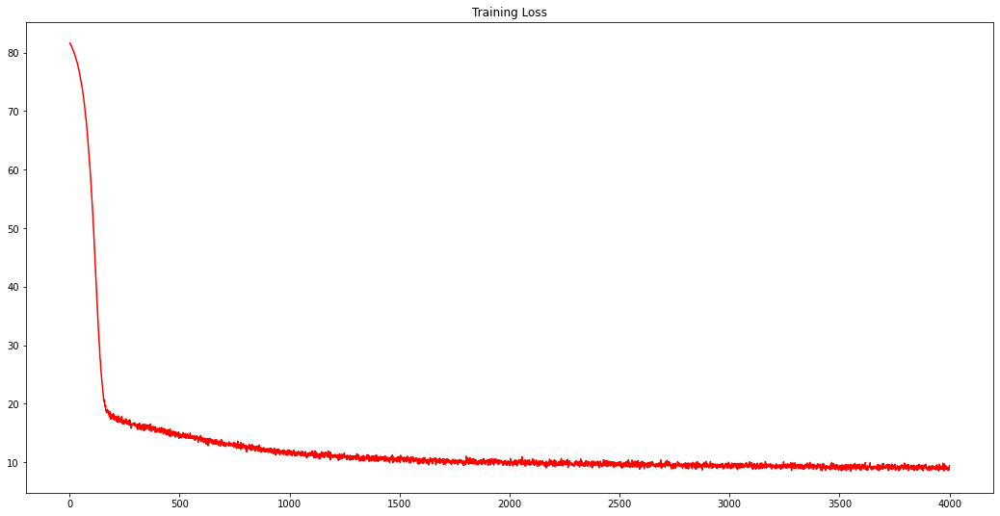

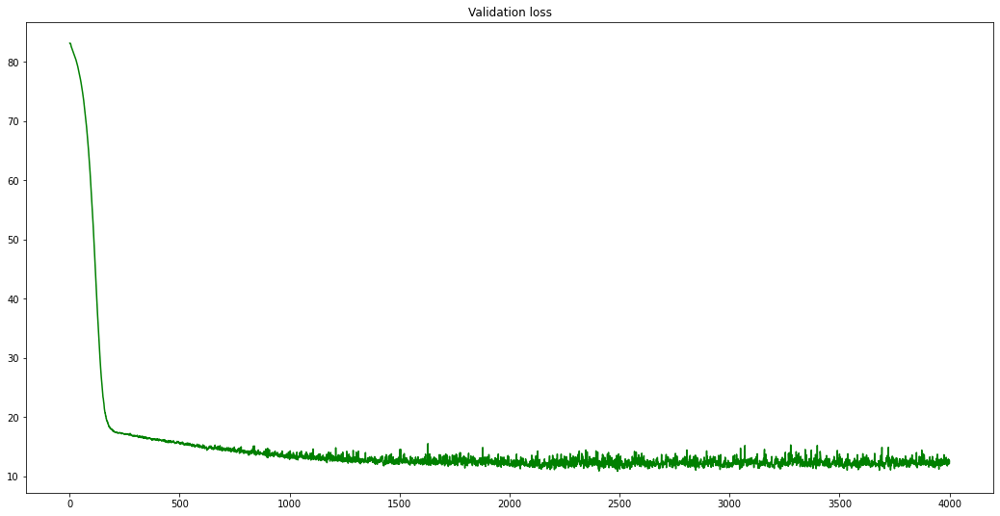

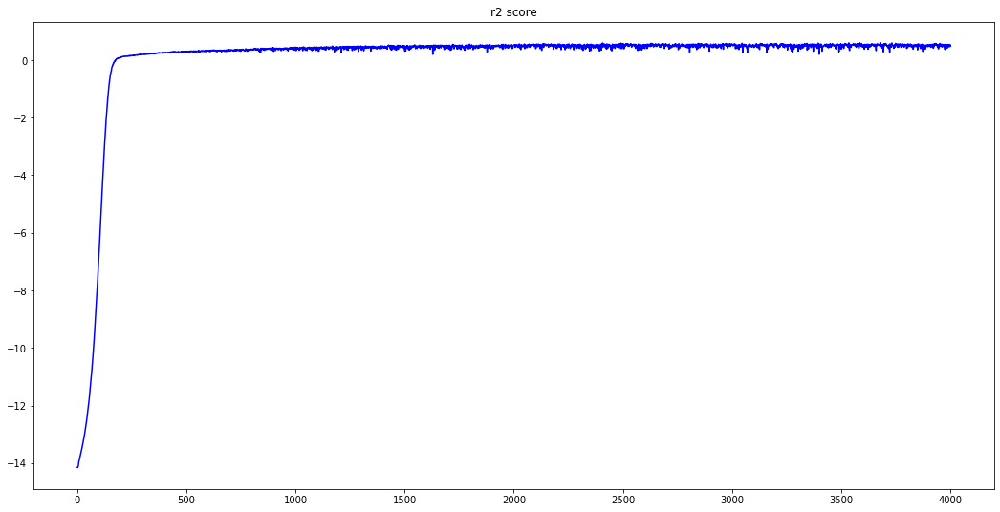

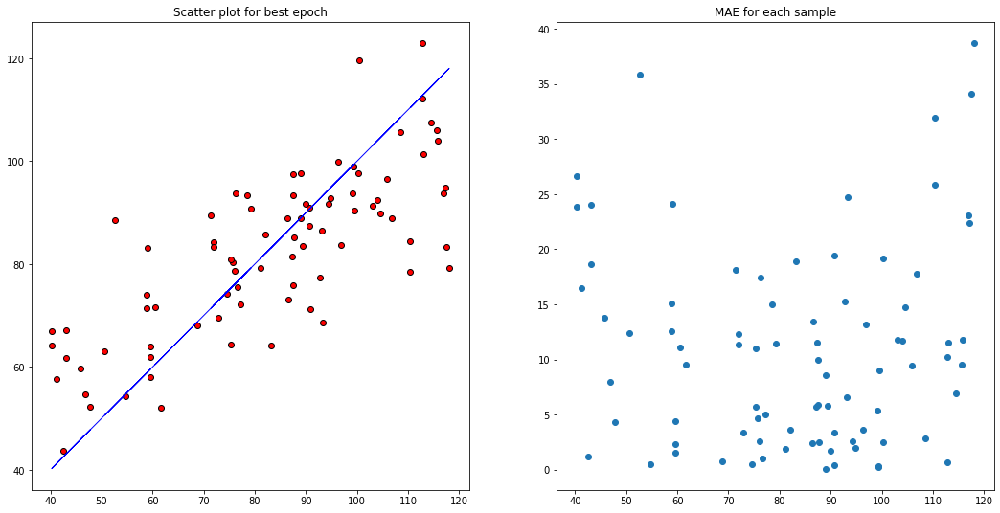

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 4000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

### Using LDS on the best Architecutre , with different kind of data distributions

With 0 - 799 features and kernel size of 21 windows and maxpool size - (2,3,3,3)

conv filter size = (32,64,128,256)
ann size = (512,128,128,64,1)

**it consists the best asta model**

*the data cleaning was also done using PCA and mahnalobis*

Using the best architecture model present below on complete dataset and using lds. Here the training dataset is un-uniformly distributed and the testing dataset is uniformly distributed. Will use the round off values for training - which yielded r2 score of .604. 

In this model we will apply the best model architecture with outliers removal from principal component analysis and using lds for dealing with imbalanced regression dataset. for the range 40-120

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 9.4503 is 0.4464

 the validation loss for the epoch 6752 with loss 10.3799 is 13.3846

 the r2 score for the epoch 6752 with loss 10.3799 is 0.4432

 the validation loss for the epoch 6753 with loss 9.5123 is 14.8077

 the r2 score for the epoch 6753 with loss 9.5123 is 0.3581

 the validation loss for the epoch 6754 with loss 9.8474 is 17.5962

 the r2 score for the epoch 6754 with loss 9.8474 is 0.1399

 the validation loss for the epoch 6755 with loss 10.3987 is 14.3846

 the r2 score for the epoch 6755 with loss 10.3987 is 0.3890

 the validation loss for the epoch 6756 with loss 10.1886 is 14.3654

 the r2 score for the epoch 6756 with loss 10.1886 is 0.3791

 the validation loss for the epoch 6757 with loss 10.2319 is 17.5962

 the r2 score for the epoch 6757 with loss 10.2319 is 0.1470

 the validation loss for the epoch 6758 with loss 10.1390 is 15.7308

 the r2 score for the epoch 6

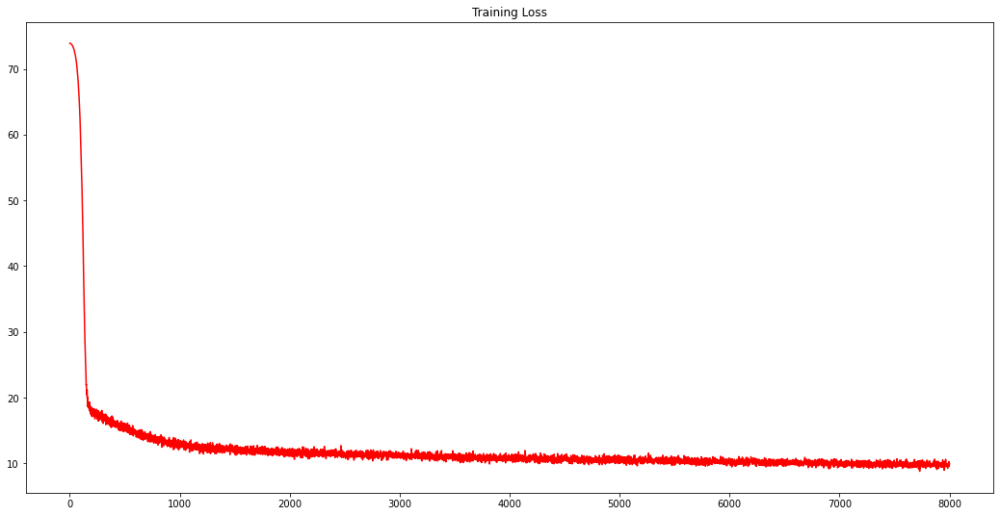

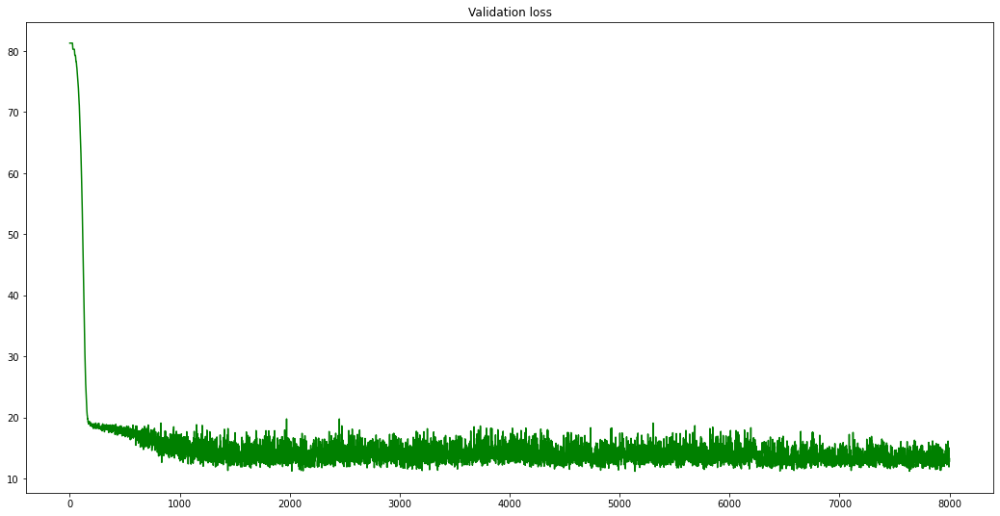

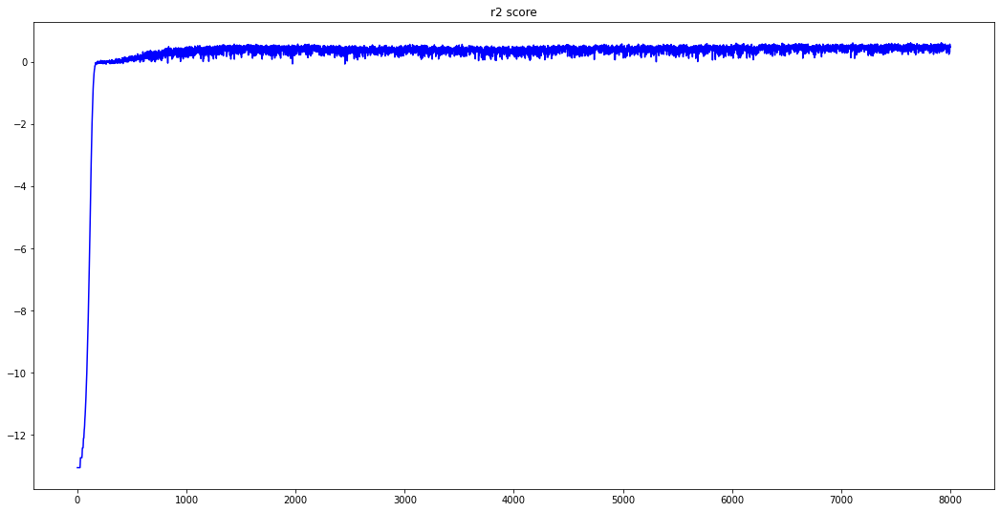

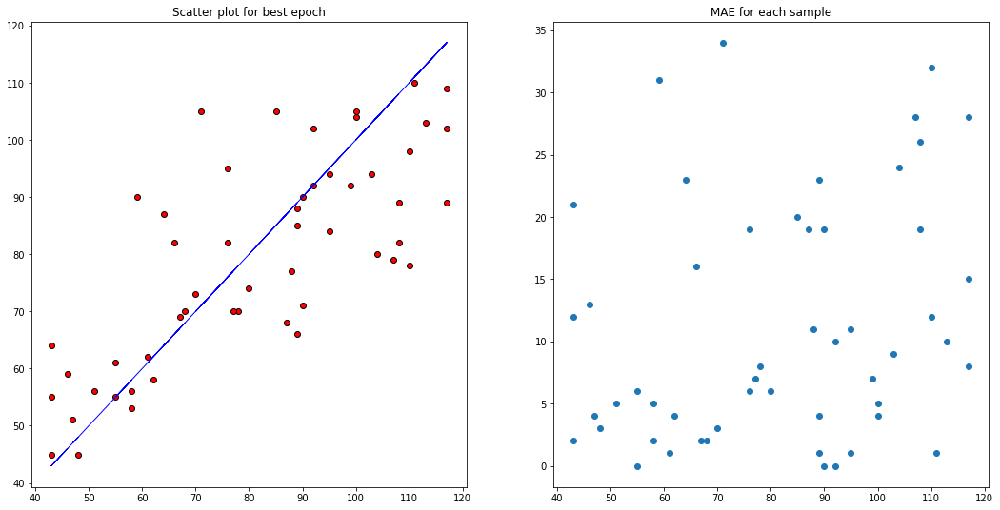

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F

# pynvml import *

b_size = 32 #batch size

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 3, 1)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    smoothed_value[0] = smoothed_value [1]
    smoothed_value[-1] = smoothed_value[-2]
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=40]
    d_asta = d_asta[d_asta['ASTA']<120]

    x_t = np.array(d_asta.drop(columns = ['ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))
    robust_cov = MinCovDet().fit(T[:,:5])
    m = robust_cov.mahalanobis(T[:,:5])

    d_asta['PC1'] = T[:,0]
    d_asta_1 = d_asta.query('PC1>60')
    d_asta = d_asta.drop(d_asta_1.index)
    d_asta = d_asta.drop(columns = ['PC1'])

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(40,120,10)}
    labels = d_asta['ASTA']
    
    for label in labels:
        value_dict[int((label//10)*10)]+=1

    l_1 = np.array([x for x in value_dict.values()])
    l = l_1 - 6
    l[4:] = l[4:] - 1
    #l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int((x-40)//10)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Above model with sampling of 1 instead of 10 for trainng the model - **The best ASTA Model**

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 8.6712 is 0.6771

 the validation loss for the epoch 6752 with loss 9.2990 is 10.3875

 the r2 score for the epoch 6752 with loss 9.2990 is 0.6792

 the validation loss for the epoch 6753 with loss 8.1828 is 10.4250

 the r2 score for the epoch 6753 with loss 8.1828 is 0.6822

 the validation loss for the epoch 6754 with loss 8.3362 is 10.1500

 the r2 score for the epoch 6754 with loss 8.3362 is 0.6638

 the validation loss for the epoch 6755 with loss 8.4503 is 10.3125

 the r2 score for the epoch 6755 with loss 8.4503 is 0.6883

 the validation loss for the epoch 6756 with loss 9.0259 is 10.1125

 the r2 score for the epoch 6756 with loss 9.0259 is 0.7155

 the validation loss for the epoch 6757 with loss 8.7580 is 10.7125

 the r2 score for the epoch 6757 with loss 8.7580 is 0.6789

 the validation loss for the epoch 6758 with loss 8.6238 is 9.7750

 the r2 score for the epoch 6758 with l

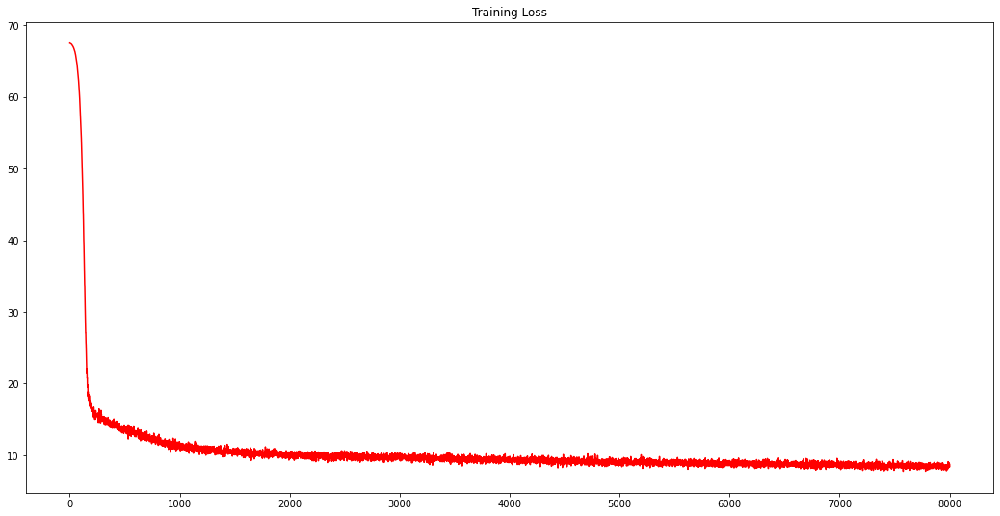

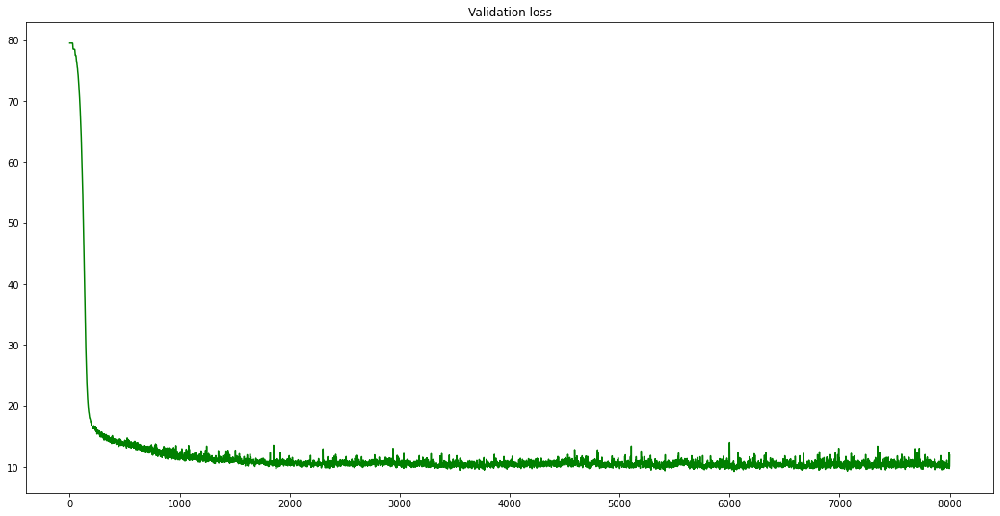

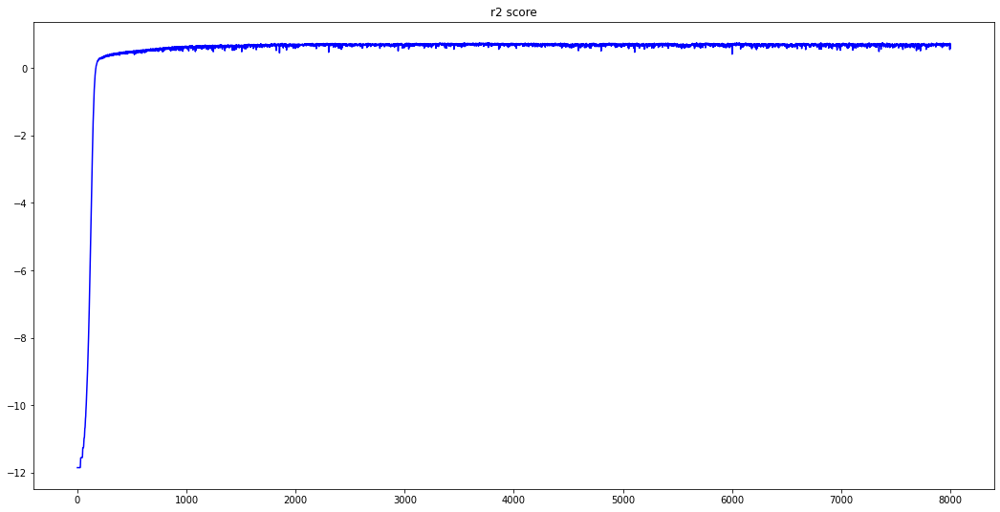

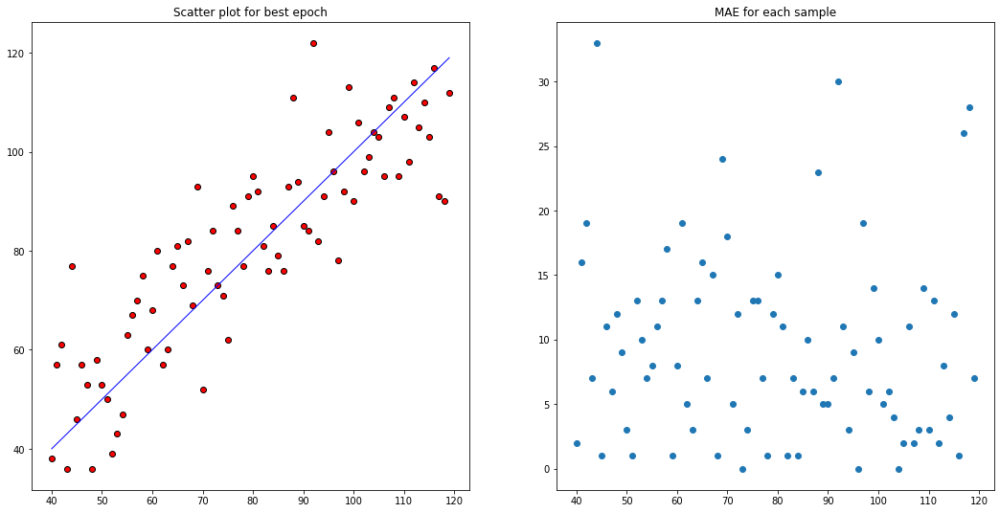

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=40]
    d_asta = d_asta[d_asta['ASTA']<120]

    x_t = np.array(d_asta.drop(columns = ['ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))
    robust_cov = MinCovDet().fit(T[:,:5])
    m = robust_cov.mahalanobis(T[:,:5])

    d_asta['PC1'] = T[:,0]
    d_asta_1 = d_asta.query('PC1>60')
    d_asta = d_asta.drop(d_asta_1.index)
    d_asta = d_asta.drop(columns = ['PC1'])

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(40,120)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    idx = np.random.randint(X_train.shape[0], size = 736)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-40)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

THE BEST MODEL WITH LDS ( PRESENT ABOVE) WITH NO DROPOUT FOR MORE MODEL CONVERGENCE

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 1.8408 is 0.6998

 the validation loss for the epoch 6752 with loss 1.5856 is 9.8375

 the r2 score for the epoch 6752 with loss 1.5856 is 0.7050

 the validation loss for the epoch 6753 with loss 1.6410 is 10.8125

 the r2 score for the epoch 6753 with loss 1.6410 is 0.6669

 the validation loss for the epoch 6754 with loss 1.5289 is 10.0000

 the r2 score for the epoch 6754 with loss 1.5289 is 0.7096

 the validation loss for the epoch 6755 with loss 1.6477 is 10.3875

 the r2 score for the epoch 6755 with loss 1.6477 is 0.6755

 the validation loss for the epoch 6756 with loss 1.5740 is 10.8375

 the r2 score for the epoch 6756 with loss 1.5740 is 0.6417

 the validation loss for the epoch 6757 with loss 1.7028 is 10.9750

 the r2 score for the epoch 6757 with loss 1.7028 is 0.6238

 the validation loss for the epoch 6758 with loss 1.7302 is 10.4250

 the r2 score for the epoch 6758 with l

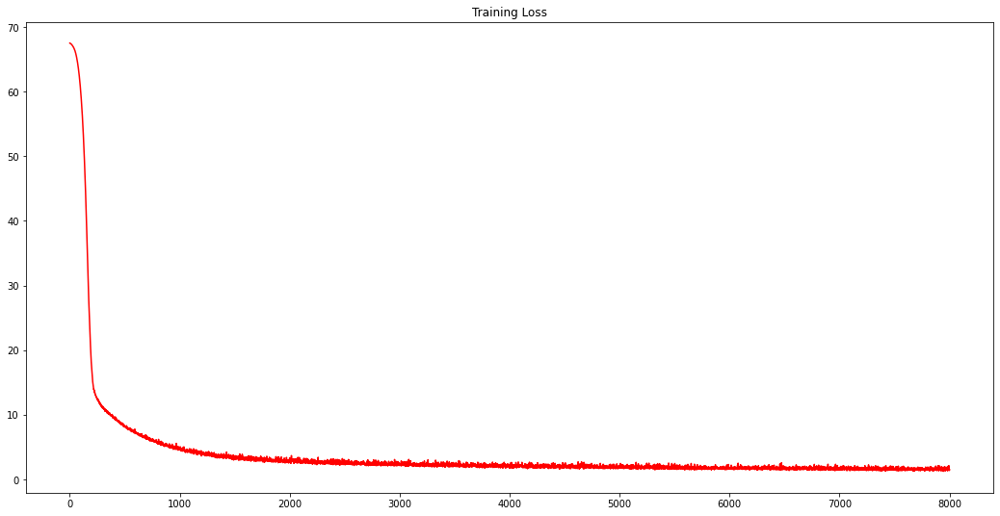

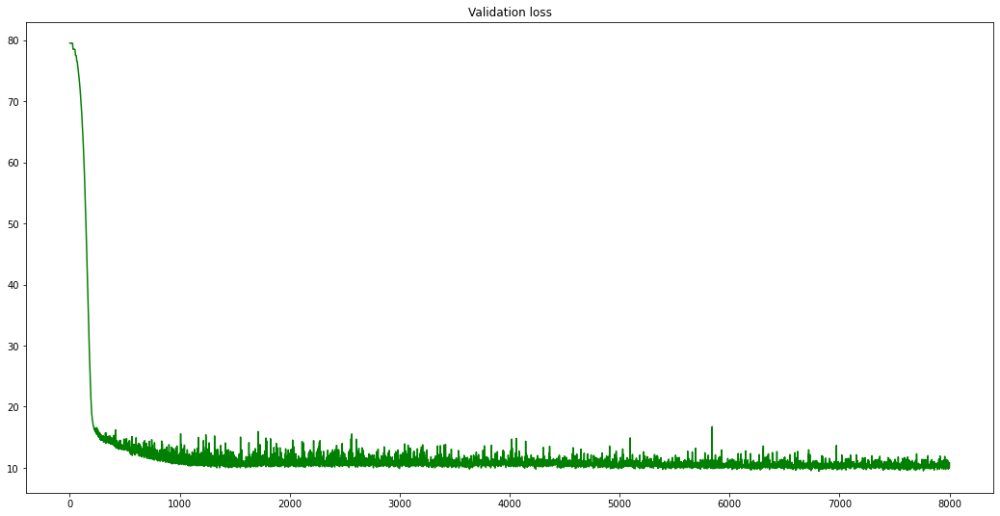

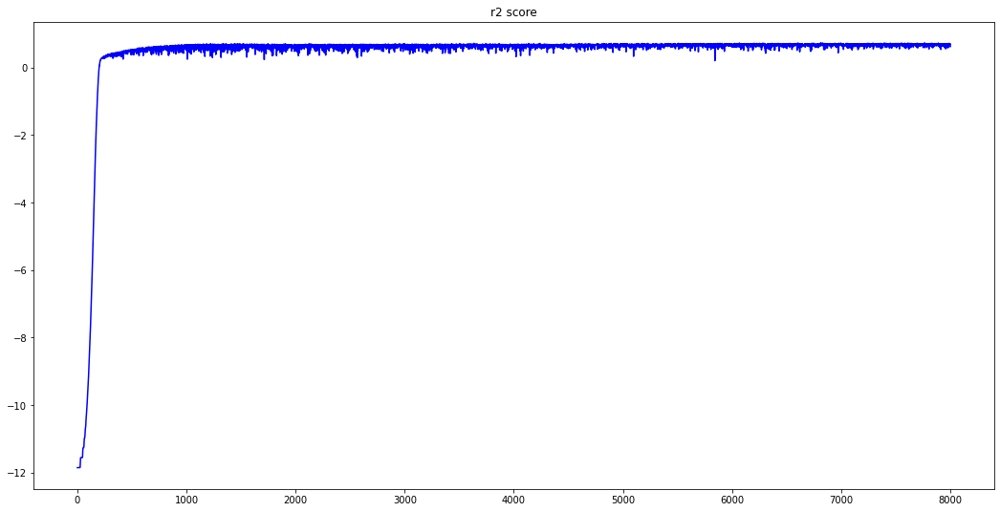

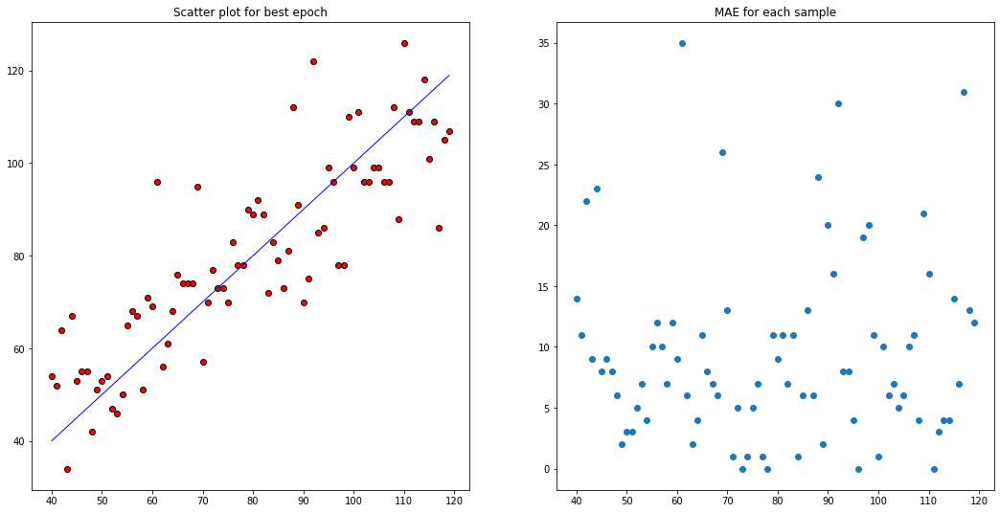

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        #self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        #self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        #self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        #self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        #self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        #self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=40]
    d_asta = d_asta[d_asta['ASTA']<120]

    x_t = np.array(d_asta.drop(columns = ['ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))
    robust_cov = MinCovDet().fit(T[:,:5])
    m = robust_cov.mahalanobis(T[:,:5])

    d_asta['PC1'] = T[:,0]
    d_asta_1 = d_asta.query('PC1>60')
    d_asta = d_asta.drop(d_asta_1.index)
    d_asta = d_asta.drop(columns = ['PC1'])

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(40,120)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    idx = np.random.randint(X_train.shape[0], size = 736)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-40)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

The best model lds one but with no outlier detection for range (40,120)

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 8.8036 is 0.6830

 the validation loss for the epoch 6752 with loss 8.8843 is 10.1000

 the r2 score for the epoch 6752 with loss 8.8843 is 0.6958

 the validation loss for the epoch 6753 with loss 9.0385 is 9.7750

 the r2 score for the epoch 6753 with loss 9.0385 is 0.7165

 the validation loss for the epoch 6754 with loss 8.4390 is 9.5125

 the r2 score for the epoch 6754 with loss 8.4390 is 0.7349

 the validation loss for the epoch 6755 with loss 8.8158 is 10.1875

 the r2 score for the epoch 6755 with loss 8.8158 is 0.6920

 the validation loss for the epoch 6756 with loss 9.1617 is 10.0500

 the r2 score for the epoch 6756 with loss 9.1617 is 0.6805

 the validation loss for the epoch 6757 with loss 8.9730 is 10.7625

 the r2 score for the epoch 6757 with loss 8.9730 is 0.6523

 the validation loss for the epoch 6758 with loss 8.7352 is 9.7875

 the r2 score for the epoch 6758 with los

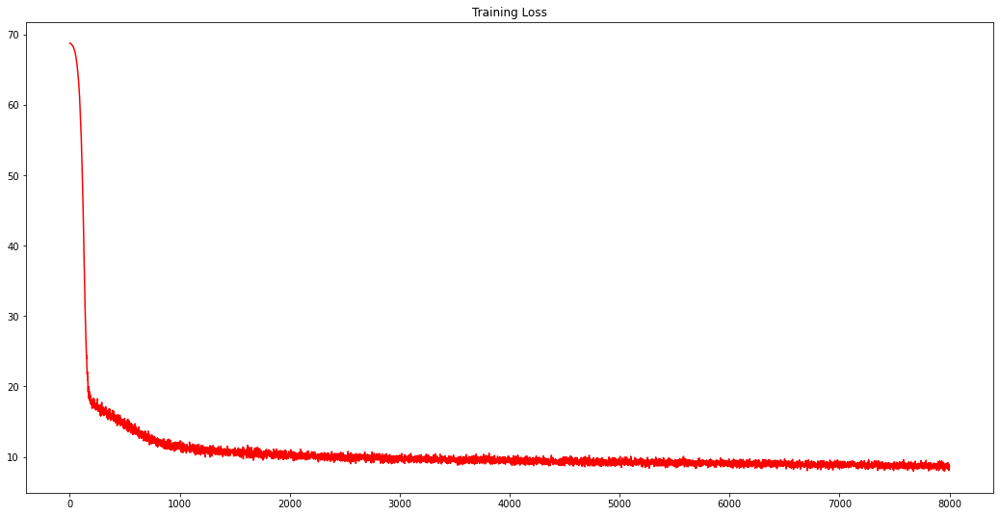

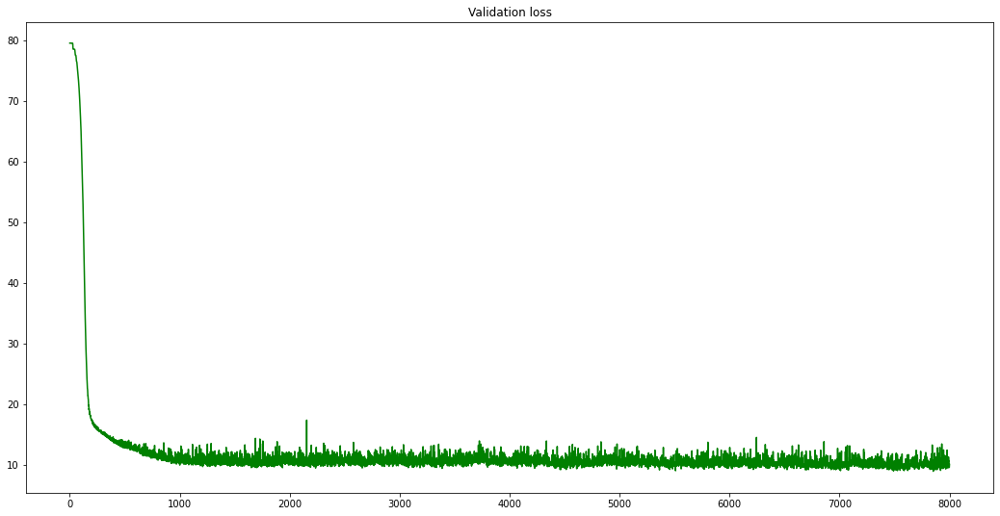

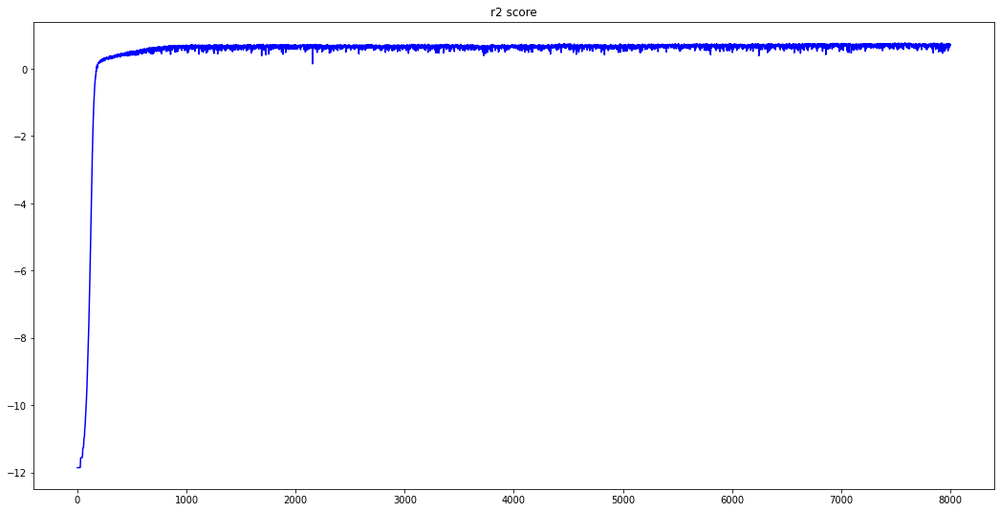

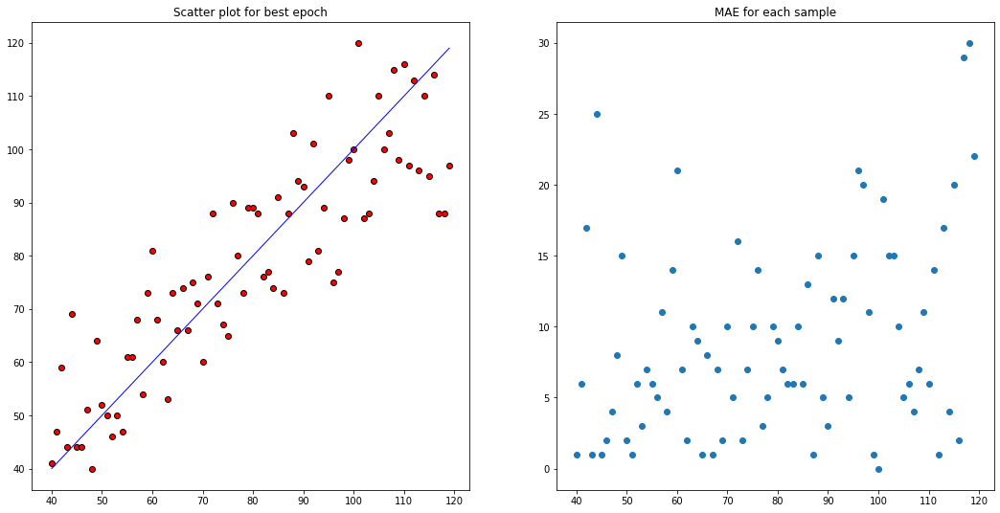

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=40]
    d_asta = d_asta[d_asta['ASTA']<120]

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(40,120)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    idx = np.random.randint(X_train.shape[0], size = 736)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-40)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

The best model on range [40-120] with lds and no outlier detection with data augmentation by applying offset , slope and multiplication on the training dataset

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

def dataaugment(x, betashift = 0.05, slopeshift = 0.05,multishift = 0.05):
    #Shift of baseline
    #calculate arrays
    beta = np.random.random(size=(x.shape[0],1))*2*betashift-betashift
    slope = np.random.random(size=(x.shape[0],1))*2*slopeshift-slopeshift + 1
    #Calculate relative position
    axis = np.array(range(x.shape[1]))/float(x.shape[1])
    #Calculate offset to be added
    offset = slope*(axis) + beta - axis - slope/2. + 0.5

    #Multiplicative
    multi = np.random.random(size=(x.shape[0],1))*2*multishift-multishift + 1

    x = multi*x + offset

    return x

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=40]
    d_asta = d_asta[d_asta['ASTA']<120]

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(40,120)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    #x_train = pd.DataFrame(X_train)
    #x_train['Actual Y'] = Y_train
    #x_train.to_csv('train_chili.csv')

    X_train_aug = np.repeat(X_train,repeats = 9, axis = 0)
    shift = .1*np.std(X_train)
    X_train_aug = dataaugment(X_train_aug,betashift = shift,slopeshift = shift/2,multishift = shift)
    X_train = np.concatenate((X_train,X_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train,repeats = 9 ,axis = 0)
    Y_train = np.concatenate((Y_train,Y_train_aug),axis = 0)



    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-40)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()

            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            R2_L.append(r2_score)
            if (e+1)%100 == 0:
                print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
                print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run() 

The best model with lds on range (18,150)

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 1.6288 is 0.6033

 the validation loss for the epoch 6752 with loss 1.4198 is 19.1194

 the r2 score for the epoch 6752 with loss 1.4198 is 0.5971

 the validation loss for the epoch 6753 with loss 1.3547 is 20.2313

 the r2 score for the epoch 6753 with loss 1.3547 is 0.5540

 the validation loss for the epoch 6754 with loss 1.4912 is 19.1642

 the r2 score for the epoch 6754 with loss 1.4912 is 0.5890

 the validation loss for the epoch 6755 with loss 1.3260 is 19.0075

 the r2 score for the epoch 6755 with loss 1.3260 is 0.6059

 the validation loss for the epoch 6756 with loss 1.7211 is 18.8657

 the r2 score for the epoch 6756 with loss 1.7211 is 0.5981

 the validation loss for the epoch 6757 with loss 1.5701 is 19.0970

 the r2 score for the epoch 6757 with loss 1.5701 is 0.5900

 the validation loss for the epoch 6758 with loss 1.4052 is 20.1791

 the r2 score for the epoch 6758 with 

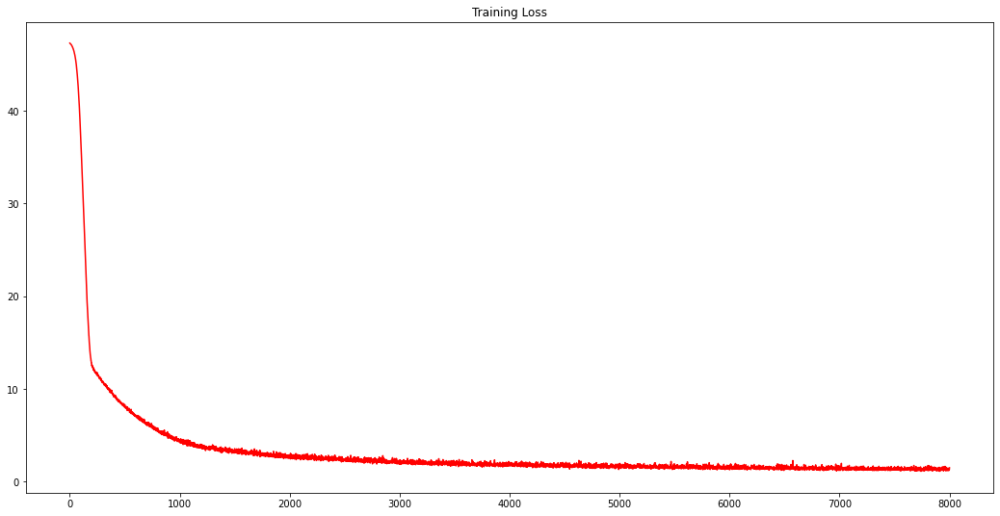

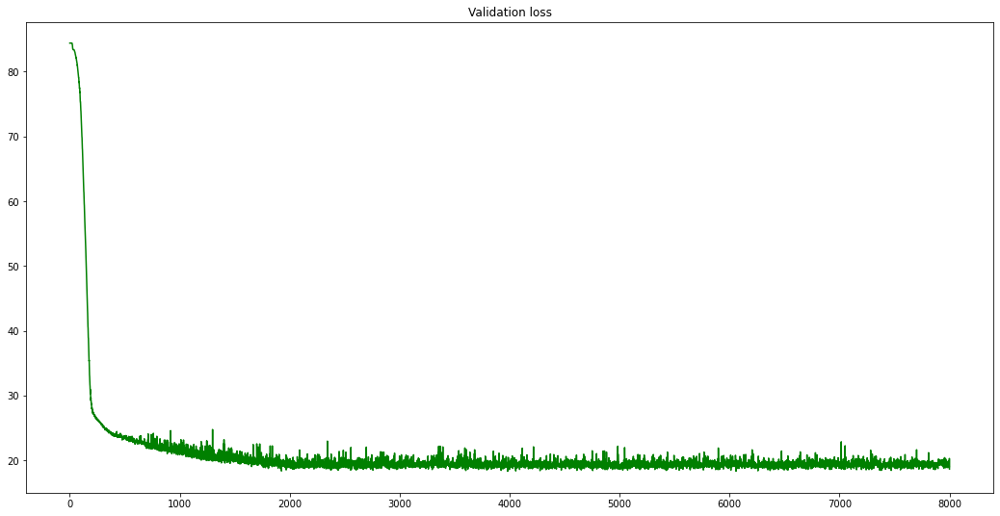

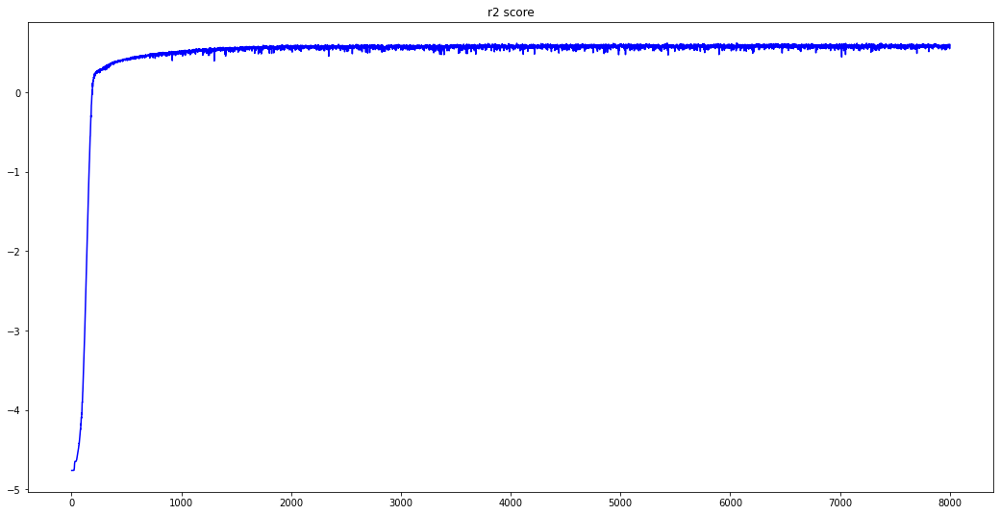

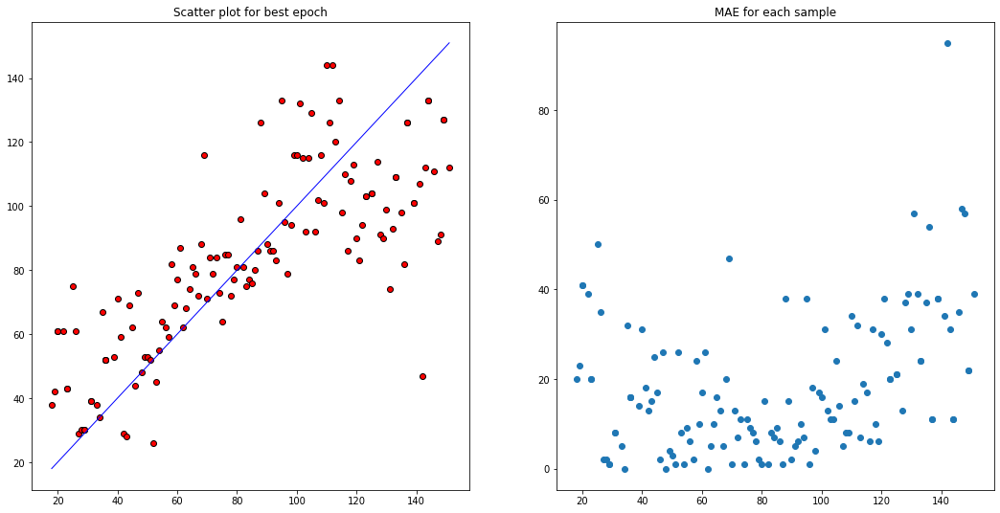

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        #self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        #self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        #self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        #self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        #self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        #self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=18]
    d_asta = d_asta[d_asta['ASTA']<152]

    x_t = np.array(d_asta.drop(columns = ['ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))
    robust_cov = MinCovDet().fit(T[:,:5])
    m = robust_cov.mahalanobis(T[:,:5])

    d_asta['PC1'] = T[:,0]
    d_asta_1 = d_asta.query('PC1>60')
    d_asta = d_asta.drop(d_asta_1.index)
    d_asta = d_asta.drop(columns = ['PC1'])

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(18,152)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    


    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-40)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

The best model lds one with asta range 18-152. wihtout dropout

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 5.9588 is 0.4591

 the validation loss for the epoch 6752 with loss 6.2513 is 20.0821

 the r2 score for the epoch 6752 with loss 6.2513 is 0.4917

 the validation loss for the epoch 6753 with loss 6.1135 is 19.4776

 the r2 score for the epoch 6753 with loss 6.1135 is 0.5251

 the validation loss for the epoch 6754 with loss 5.7140 is 20.8433

 the r2 score for the epoch 6754 with loss 5.7140 is 0.4555

 the validation loss for the epoch 6755 with loss 6.0789 is 21.0224

 the r2 score for the epoch 6755 with loss 6.0789 is 0.4575

 the validation loss for the epoch 6756 with loss 6.4514 is 21.8881

 the r2 score for the epoch 6756 with loss 6.4514 is 0.4129

 the validation loss for the epoch 6757 with loss 6.1287 is 20.4627

 the r2 score for the epoch 6757 with loss 6.1287 is 0.4718

 the validation loss for the epoch 6758 with loss 6.0283 is 21.2313

 the r2 score for the epoch 6758 with 

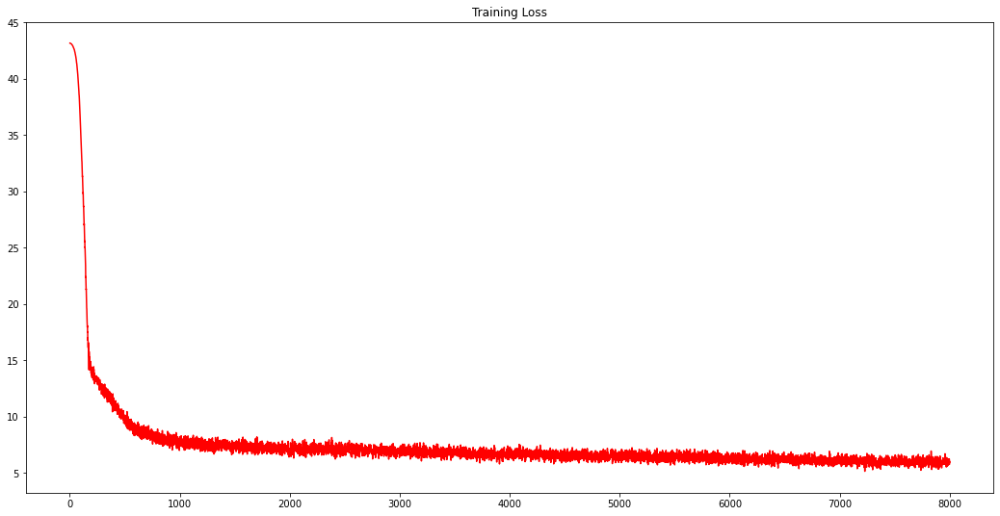

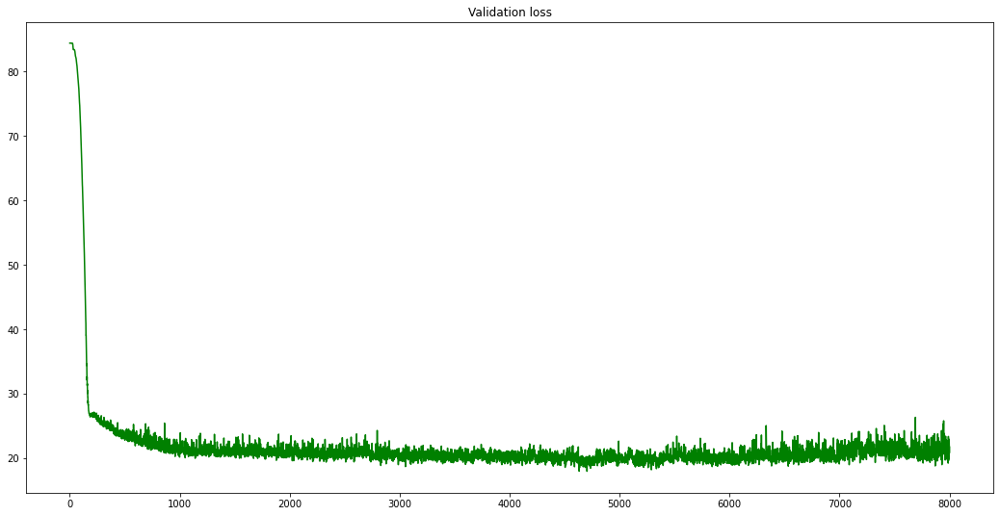

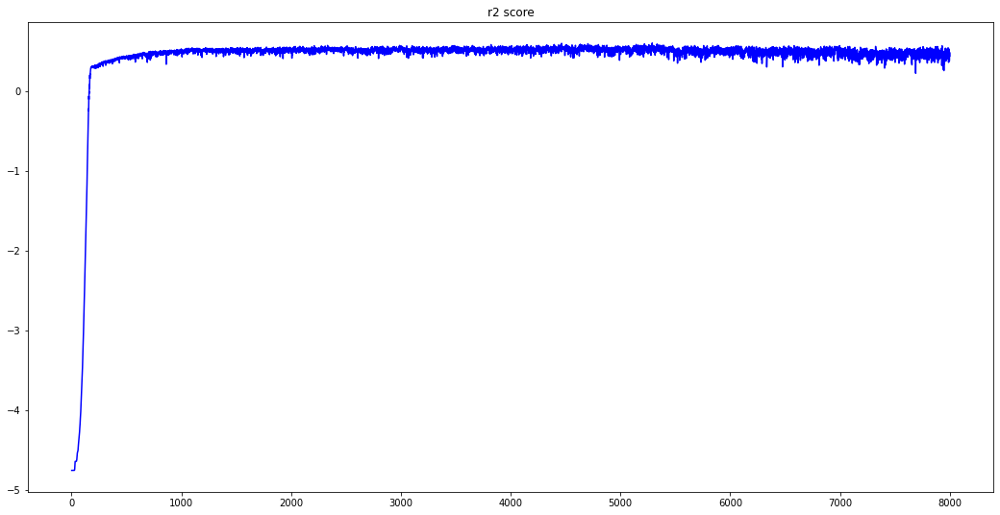

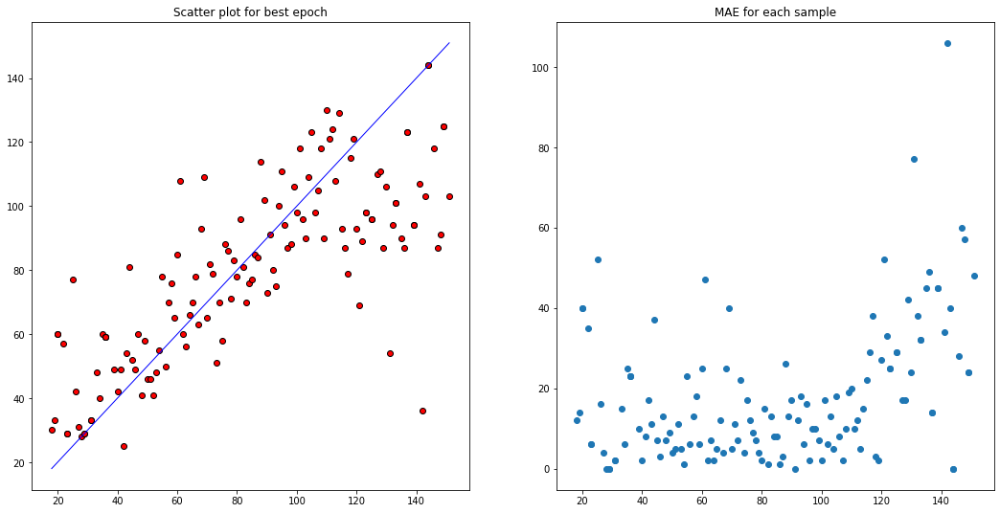

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=18]
    d_asta = d_asta[d_asta['ASTA']<152]

    x_t = np.array(d_asta.drop(columns = ['ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))
    robust_cov = MinCovDet().fit(T[:,:5])
    m = robust_cov.mahalanobis(T[:,:5])

    d_asta['PC1'] = T[:,0]
    d_asta_1 = d_asta.query('PC1>60')
    d_asta = d_asta.drop(d_asta_1.index)
    d_asta = d_asta.drop(columns = ['PC1'])

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(18,152)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    


    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-18)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

The best lds on range 18-152 with no outlier detection model

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 6.3261 is 0.6580

 the validation loss for the epoch 6752 with loss 7.2050 is 16.9851

 the r2 score for the epoch 6752 with loss 7.2050 is 0.6340

 the validation loss for the epoch 6753 with loss 6.6978 is 17.2164

 the r2 score for the epoch 6753 with loss 6.6978 is 0.6244

 the validation loss for the epoch 6754 with loss 6.6598 is 17.9552

 the r2 score for the epoch 6754 with loss 6.6598 is 0.6399

 the validation loss for the epoch 6755 with loss 6.5648 is 16.7612

 the r2 score for the epoch 6755 with loss 6.5648 is 0.6489

 the validation loss for the epoch 6756 with loss 6.1568 is 17.1791

 the r2 score for the epoch 6756 with loss 6.1568 is 0.6463

 the validation loss for the epoch 6757 with loss 6.5327 is 16.6493

 the r2 score for the epoch 6757 with loss 6.5327 is 0.6494

 the validation loss for the epoch 6758 with loss 6.7530 is 18.1866

 the r2 score for the epoch 6758 with 

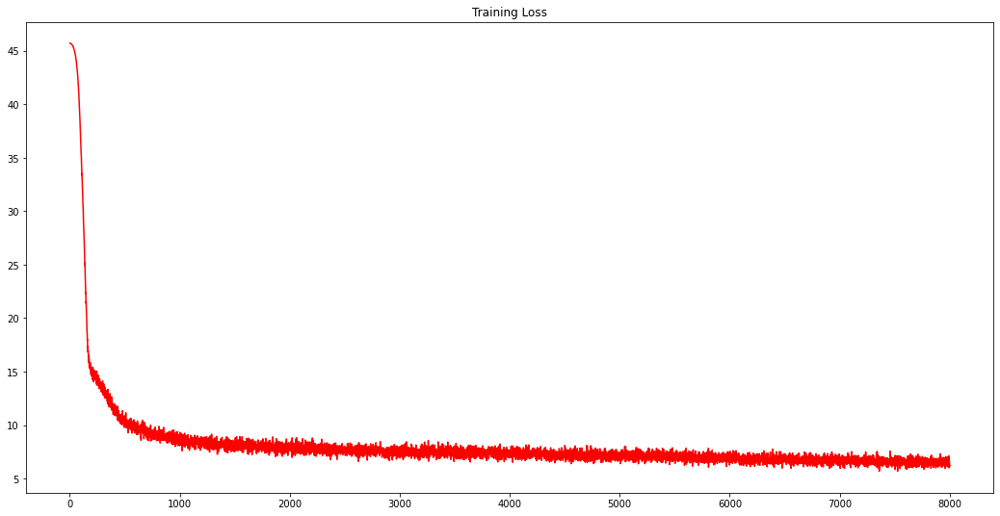

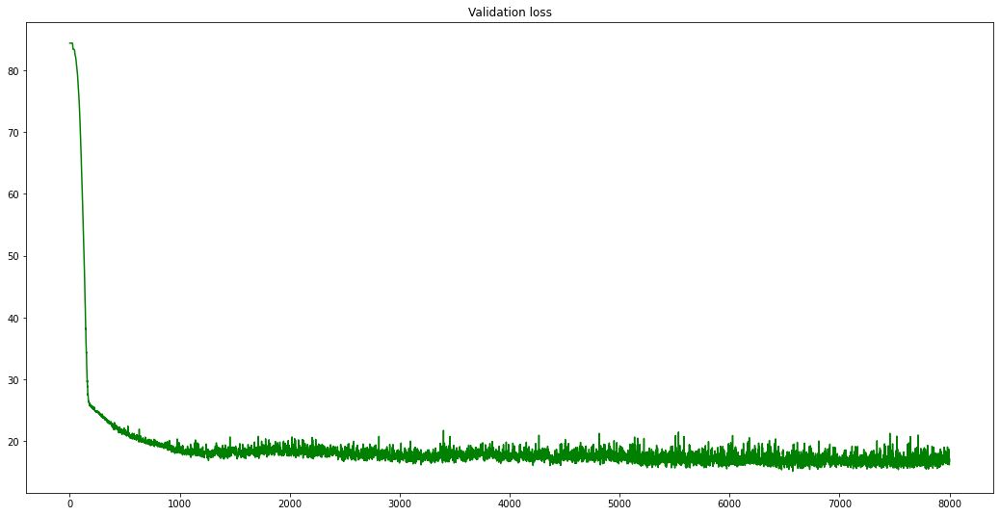

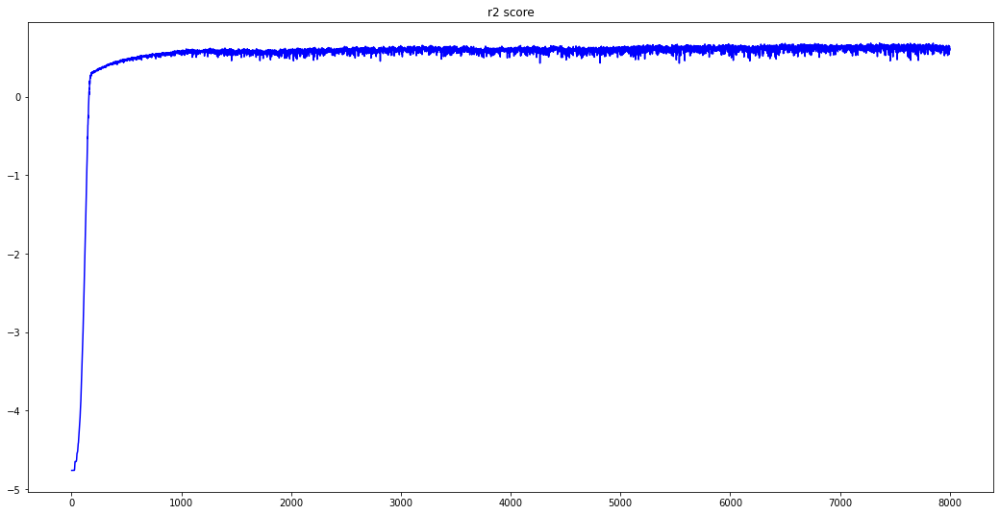

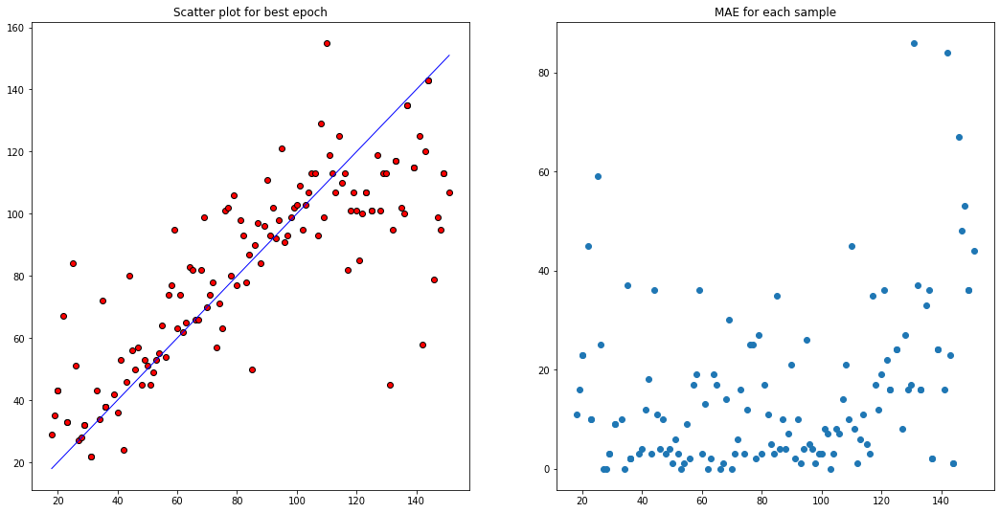

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=18]
    d_asta = d_asta[d_asta['ASTA']<152]

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(18,152)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-18)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('/content/drive/MyDrive/Chili/chili_val_actual_pred_18_152.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('/content/drive/MyDrive/Chili/chili_train_actual_pred_18_152.csv')


if __name__ == '__main__':
    run()

The best lds model on range (18-152) with no outliers and data augmentation

usingcudadevice

 the validation loss for the epoch 1 with loss 42.7843 is 84.3955

 the r2 score for the epoch 1 with loss 42.7843 is -4.7597

 the validation loss for the epoch 51 with loss 11.1912 is 21.9701

 the r2 score for the epoch 51 with loss 11.1912 is 0.4636

 the validation loss for the epoch 101 with loss 8.7970 is 19.4254

 the r2 score for the epoch 101 with loss 8.7970 is 0.5405

 the validation loss for the epoch 151 with loss 8.1419 is 18.7687

 the r2 score for the epoch 151 with loss 8.1419 is 0.6212

 the validation loss for the epoch 201 with loss 7.6508 is 17.0896

 the r2 score for the epoch 201 with loss 7.6508 is 0.6523

 the validation loss for the epoch 251 with loss 7.7481 is 17.7761

 the r2 score for the epoch 251 with loss 7.7481 is 0.6395

 the validation loss for the epoch 301 with loss 7.5890 is 16.7164

 the r2 score for the epoch 301 with loss 7.5890 is 0.6681

 the validation loss for the epoch 351 with loss 7.3676 is 16.9328

 the r2 score for th

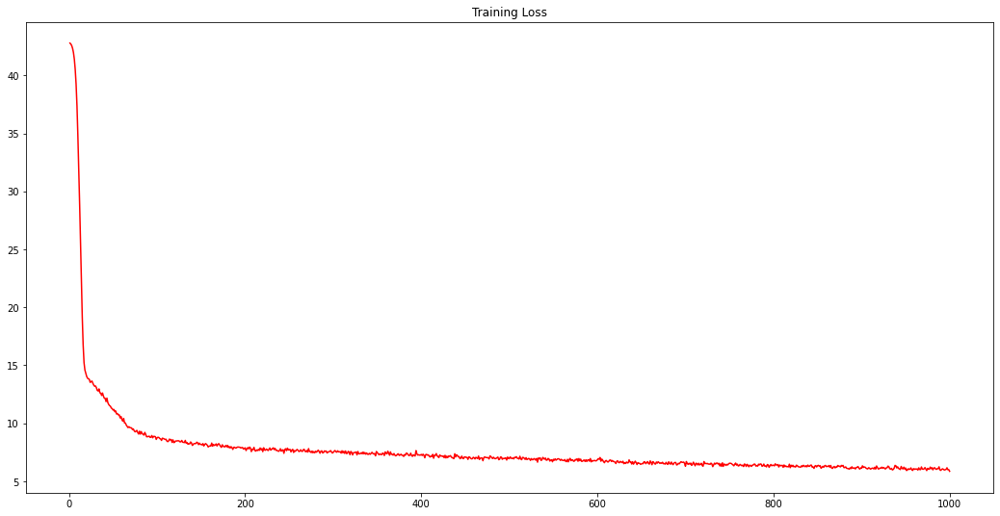

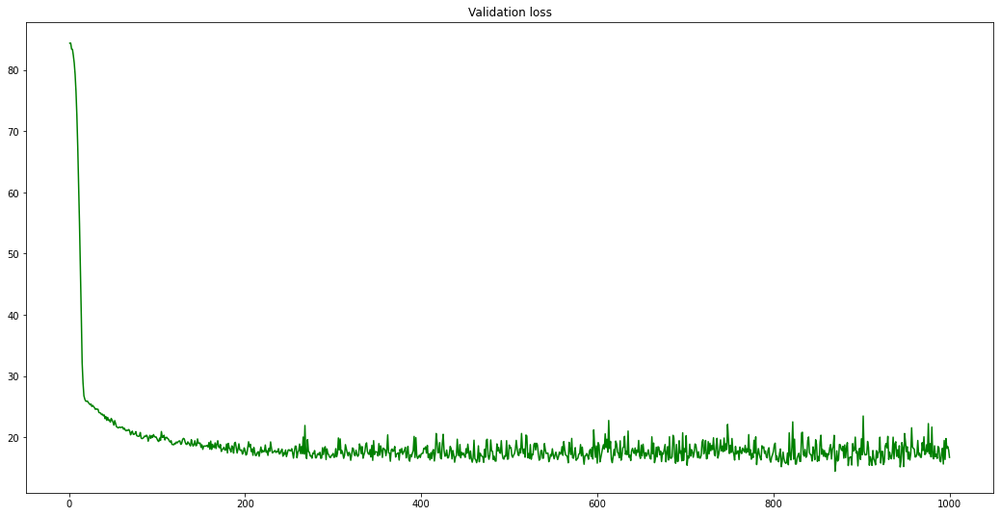

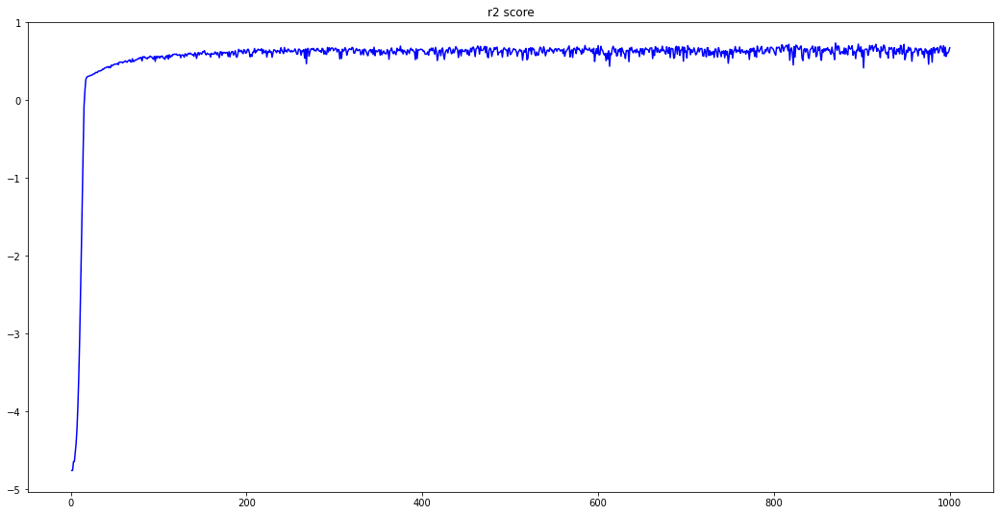

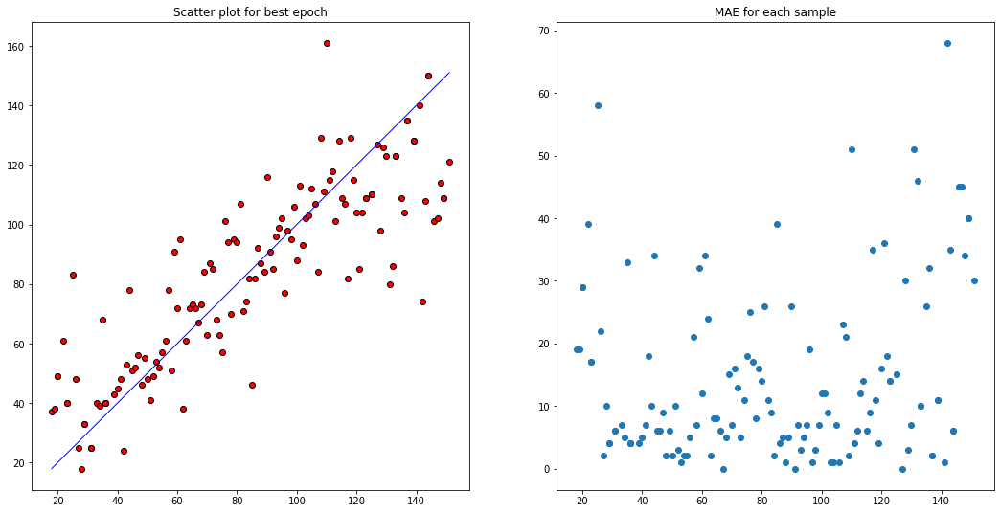

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

def dataaugment(x, betashift = 0.05, slopeshift = 0.05,multishift = 0.05):
    #Shift of baseline
    #calculate arrays
    beta = np.random.random(size=(x.shape[0],1))*2*betashift-betashift
    slope = np.random.random(size=(x.shape[0],1))*2*slopeshift-slopeshift + 1
    #Calculate relative position
    axis = np.array(range(x.shape[1]))/float(x.shape[1])
    #Calculate offset to be added
    offset = slope*(axis) + beta - axis - slope/2. + 0.5

    #Multiplicative
    multi = np.random.random(size=(x.shape[0],1))*2*multishift-multishift + 1

    x = multi*x + offset

    return x

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=18]
    d_asta = d_asta[d_asta['ASTA']<152]

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(18,152)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    #x_train = pd.DataFrame(X_train)
    #x_train['Actual Y'] = Y_train
    #x_train.to_csv('train_chili.csv')

    X_train_aug = np.repeat(X_train,repeats = 9, axis = 0)
    shift = .1*np.std(X_train)
    X_train_aug = dataaugment(X_train_aug,betashift = shift,slopeshift = shift/2,multishift = shift)
    X_train = np.concatenate((X_train,X_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train,repeats = 9 ,axis = 0)
    Y_train = np.concatenate((Y_train,Y_train_aug),axis = 0)



    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-18)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()

            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            R2_L.append(r2_score)
            if e%50 == 0:
                print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
                print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_18_152_lds_dataaug_2_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    torch.save(model.state_dict(),dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_lds_aug_actual_pred_2.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_lds_aug_actual_pred_2.csv')


if __name__ == '__main__':
    run()

with mahanlobis distance - should not be used cause it is removed various values spectras as outliers

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys
from scipy.stats import chi2

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=18]
    d_asta = d_asta[d_asta['ASTA']<152]

    x_t = np.array(d_asta.drop(columns = ['ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))
    robust_cov = MinCovDet().fit(T[:,:5])
    m = robust_cov.mahalanobis(T[:,:5])

    d_asta['mahan'] = m
    d_asta['p'] = 1 - chi2.cdf(d_asta['mahan'], 4) # 4 because we took 5 principal components for distance

    d_asta_1 = d_asta.query('p<.001')
    d_asta = d_asta.drop(d_asta_1.index)
    d_asta = d_asta.drop(columns = ['mahan','p'])

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(18,152)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>1):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=1,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    


    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-18)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            torch.set_printoptions(threshold=10_000)
            print(v_y_1)
            print(v_yhat_1)
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

usingcudadevice


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:169: RuntimeWarning: divide by zero encountered in long_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: invalid value encountered in double_scalars



 the validation loss for the epoch 1 with loss nan is nan
tensor([ 18.,  18.,  18.,  18.,  22.,  23.,  23.,  23.,  23.,  23.,  23.,  23.,
         23.,  23.,  23.,  23.,  23.,  35.,  35.,  35.,  35.,  39.,  40.,  41.,
         42.,  43.,  44.,  45.,  46.,  47.,  48.,  48.,  50.,  51.,  52.,  53.,
         54.,  55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
         66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
         78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,  89.,
         90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99., 100., 101.,
        102., 103., 104., 105., 106., 107., 108., 109., 110., 111., 112., 113.,
        114., 115., 116., 117., 118., 119., 120., 121., 122., 123., 123., 125.,
        125., 127., 128., 129., 130., 131., 132., 133., 133., 135., 136., 137.,
        137., 139., 139., 141., 141., 143., 144., 144., 146., 146., 148., 149.,
        149., 149.])
tensor([nan, nan, nan, nan, nan, nan, na

ValueError: ignored

### The one with dense configuratoin - 1024,512,512,128,128,64,1 - **BEST MODEL without LDS**

low accuracy than lds ones

*Contains models with outlier removing using pca , mahnalobis and chi square distribution*

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 11.2073 is 0.5305

 the validation loss for the epoch 6752 with loss 11.5183 is 12.0201

 the r2 score for the epoch 6752 with loss 11.5183 is 0.5335

 the validation loss for the epoch 6753 with loss 10.7868 is 11.7932

 the r2 score for the epoch 6753 with loss 10.7868 is 0.5625

 the validation loss for the epoch 6754 with loss 11.4422 is 11.5187

 the r2 score for the epoch 6754 with loss 11.4422 is 0.5770

 the validation loss for the epoch 6755 with loss 10.4624 is 12.1405

 the r2 score for the epoch 6755 with loss 10.4624 is 0.5605

 the validation loss for the epoch 6756 with loss 11.2891 is 12.7135

 the r2 score for the epoch 6756 with loss 11.2891 is 0.5187

 the validation loss for the epoch 6757 with loss 11.0908 is 12.4849

 the r2 score for the epoch 6757 with loss 11.0908 is 0.5001

 the validation loss for the epoch 6758 with loss 11.6061 is 12.2315

 the r2 score for the ep

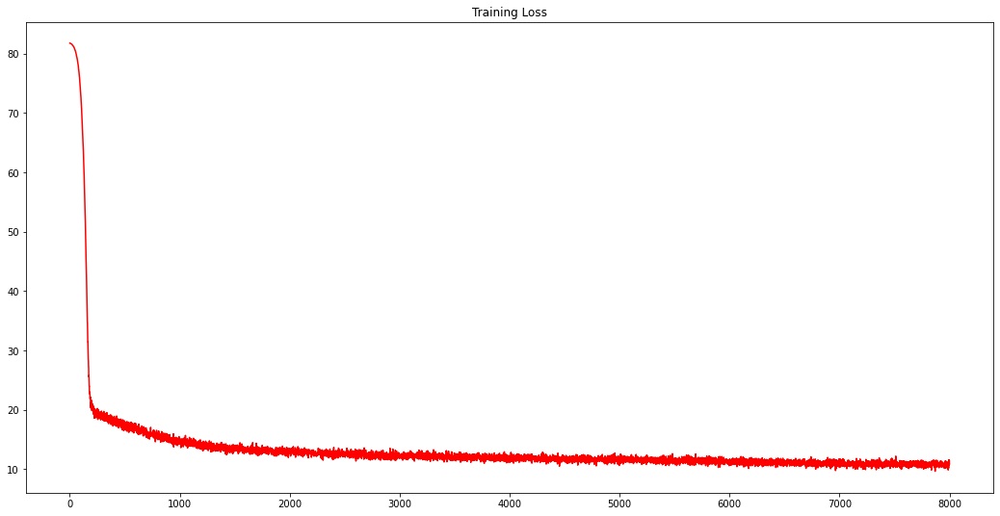

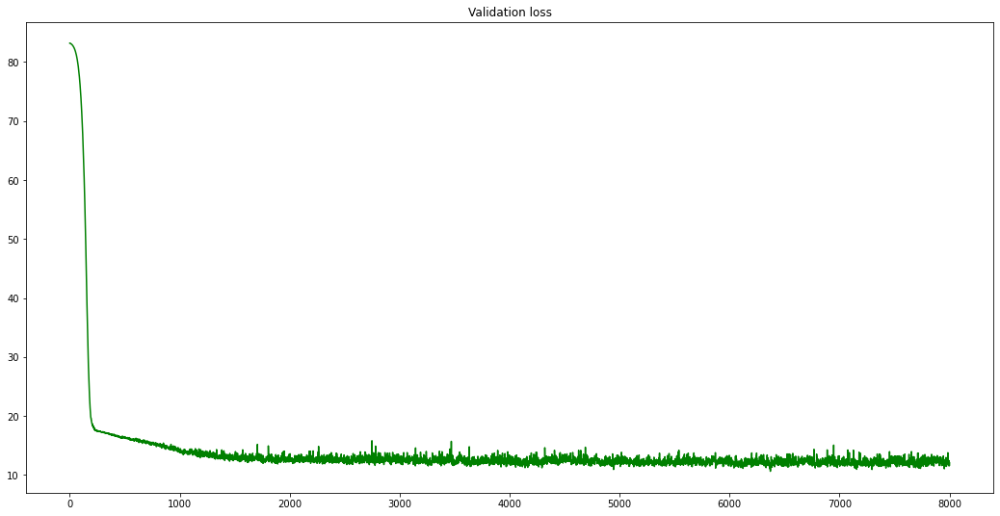

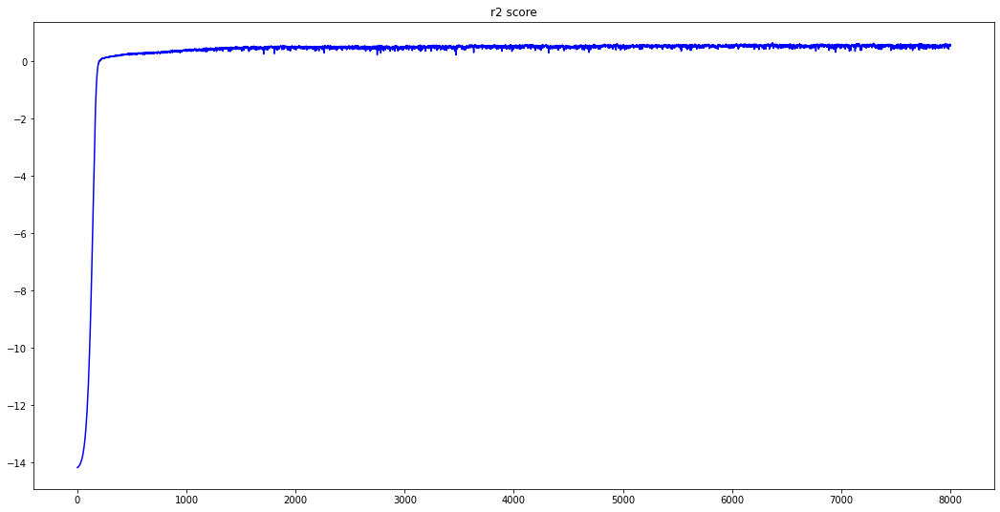

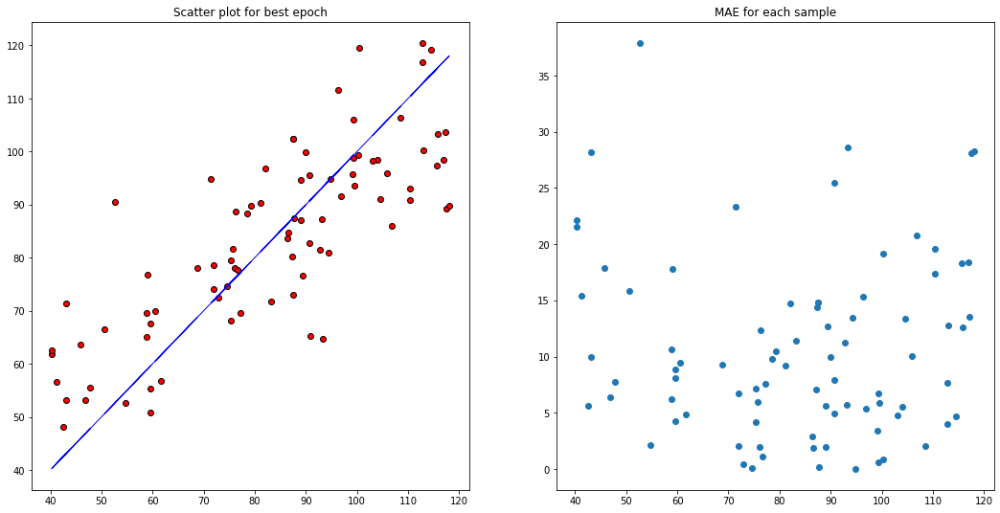

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

The best model without LDS with rounding-off the ASTA values for training and validation

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 11.5490 is 0.5623

 the validation loss for the epoch 6752 with loss 11.6580 is 11.6627

 the r2 score for the epoch 6752 with loss 11.6580 is 0.5726

 the validation loss for the epoch 6753 with loss 10.9743 is 12.3976

 the r2 score for the epoch 6753 with loss 10.9743 is 0.5114

 the validation loss for the epoch 6754 with loss 11.6090 is 12.1566

 the r2 score for the epoch 6754 with loss 11.6090 is 0.5390

 the validation loss for the epoch 6755 with loss 10.7546 is 11.9036

 the r2 score for the epoch 6755 with loss 10.7546 is 0.5614

 the validation loss for the epoch 6756 with loss 11.2273 is 12.1687

 the r2 score for the epoch 6756 with loss 11.2273 is 0.5268

 the validation loss for the epoch 6757 with loss 11.0597 is 12.3133

 the r2 score for the epoch 6757 with loss 11.0597 is 0.5257

 the validation loss for the epoch 6758 with loss 11.4878 is 12.4940

 the r2 score for the ep

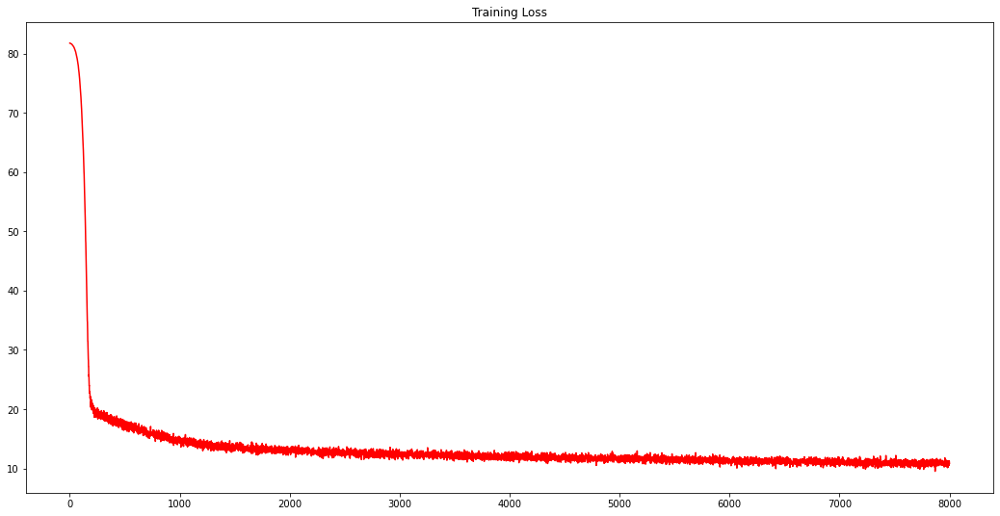

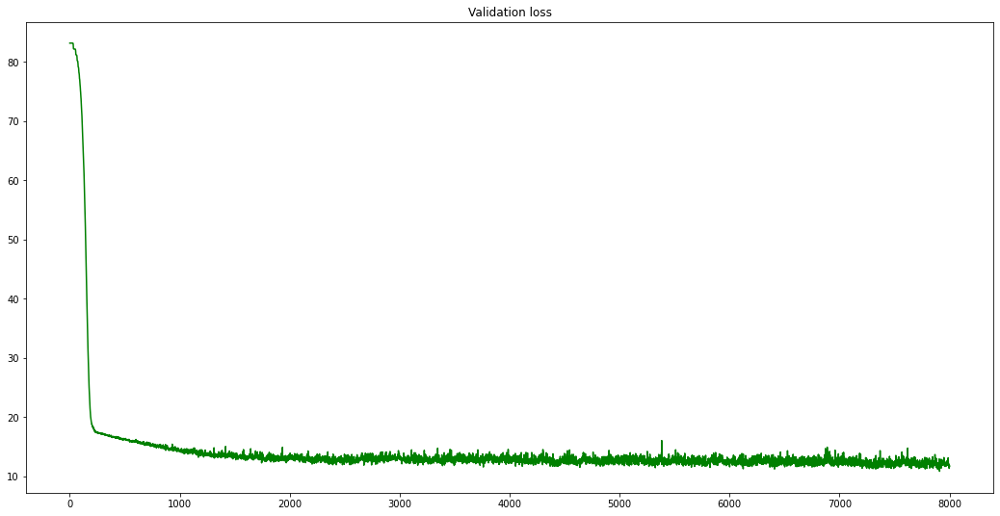

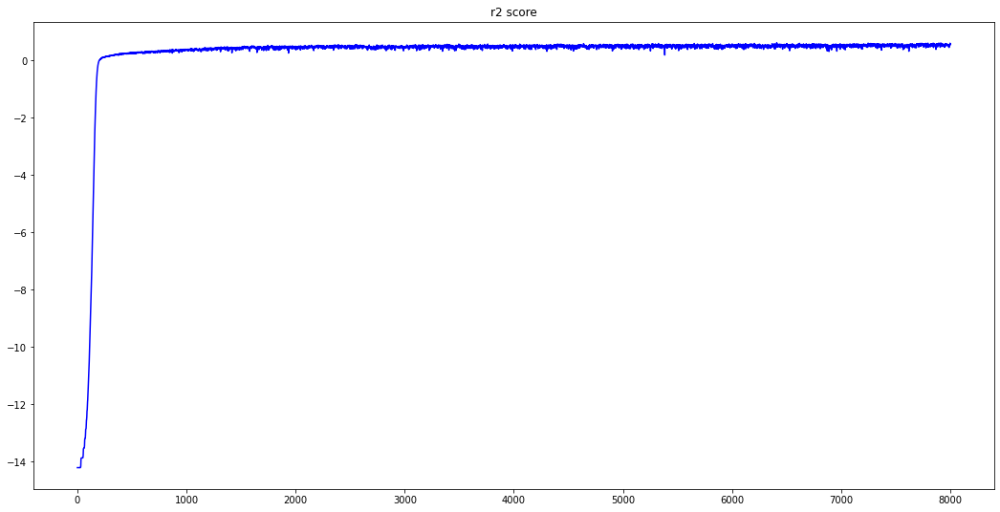

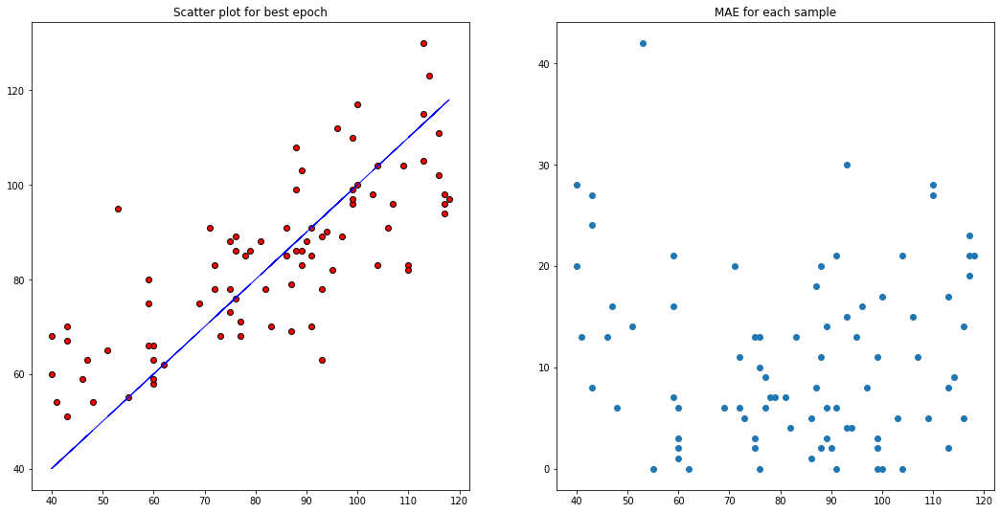

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA'].round()))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA'].round()))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            #t_yhat = torch.round(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

the best model with **no dropout** used

So the loss decreased and model did fit, however due to overfitting more samples from unseen dataset were classified wrongly.

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 2.6142 is 0.4709

 the validation loss for the epoch 6752 with loss 2.7256 is 12.0221

 the r2 score for the epoch 6752 with loss 2.7256 is 0.5333

 the validation loss for the epoch 6753 with loss 2.5431 is 12.0452

 the r2 score for the epoch 6753 with loss 2.5431 is 0.5141

 the validation loss for the epoch 6754 with loss 2.4686 is 12.2060

 the r2 score for the epoch 6754 with loss 2.4686 is 0.5015

 the validation loss for the epoch 6755 with loss 2.2649 is 12.2407

 the r2 score for the epoch 6755 with loss 2.2649 is 0.4925

 the validation loss for the epoch 6756 with loss 2.3988 is 11.5719

 the r2 score for the epoch 6756 with loss 2.3988 is 0.5478

 the validation loss for the epoch 6757 with loss 2.5092 is 12.8119

 the r2 score for the epoch 6757 with loss 2.5092 is 0.4733

 the validation loss for the epoch 6758 with loss 2.4136 is 11.9523

 the r2 score for the epoch 6758 with 

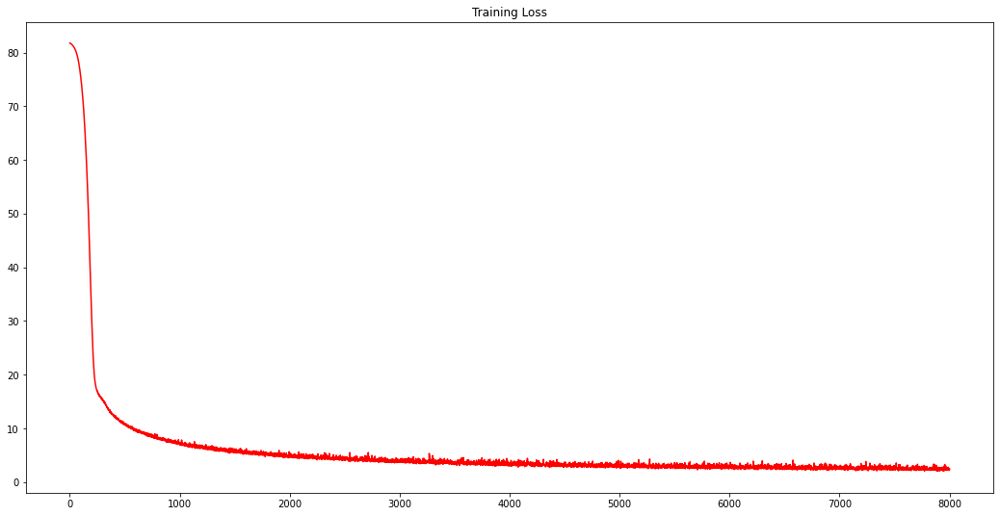

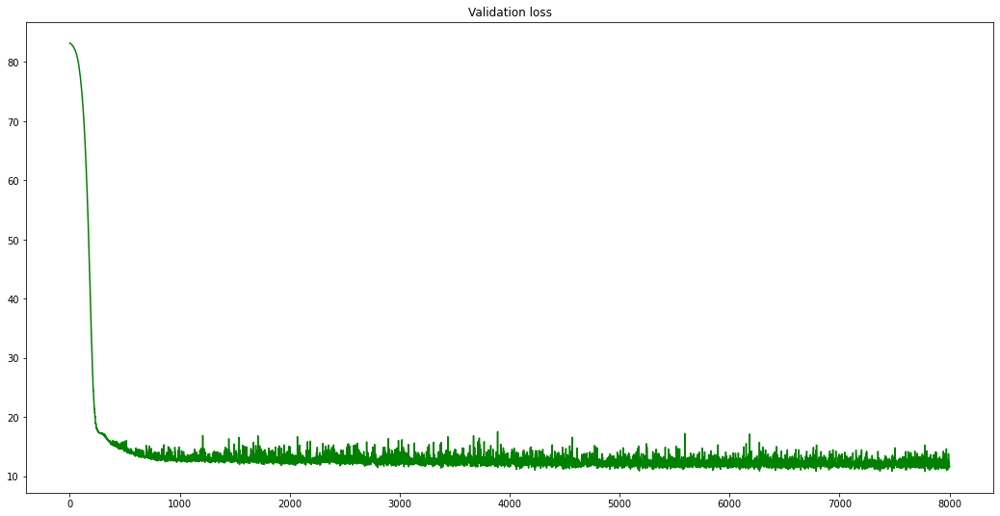

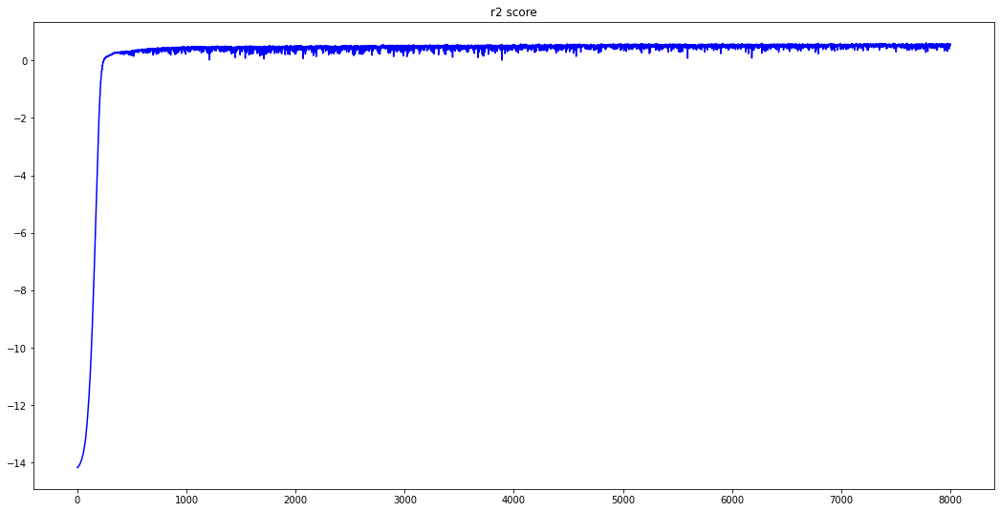

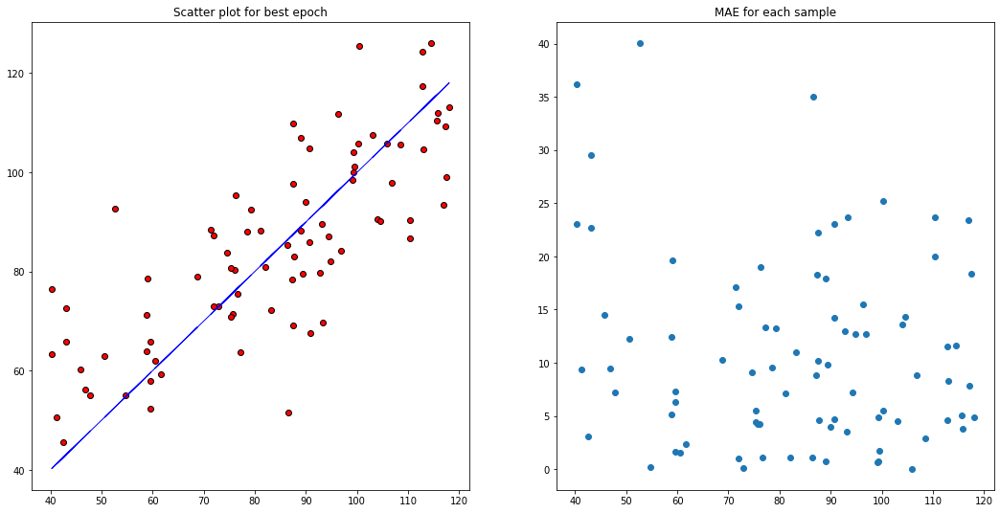

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        #self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        #self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        #self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        #self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        #self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        #self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        #self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

The one with dense configuratoin - 1024,512,512,128,128,64,1 - **BEST MODEL**
Best model applying on clean data , generating clean data using mahanlobis distance as criteria

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 10.6293 is 0.2432

 the validation loss for the epoch 6752 with loss 11.3544 is 13.3545

 the r2 score for the epoch 6752 with loss 11.3544 is 0.3148

 the validation loss for the epoch 6753 with loss 11.1239 is 12.6982

 the r2 score for the epoch 6753 with loss 11.1239 is 0.3882

 the validation loss for the epoch 6754 with loss 11.1860 is 11.6179

 the r2 score for the epoch 6754 with loss 11.1860 is 0.5264

 the validation loss for the epoch 6755 with loss 11.1327 is 12.9664

 the r2 score for the epoch 6755 with loss 11.1327 is 0.4250

 the validation loss for the epoch 6756 with loss 10.7889 is 13.3456

 the r2 score for the epoch 6756 with loss 10.7889 is 0.2925

 the validation loss for the epoch 6757 with loss 11.2358 is 15.4096

 the r2 score for the epoch 6757 with loss 11.2358 is 0.0469

 the validation loss for the epoch 6758 with loss 11.4694 is 12.7092

 the r2 score for the ep

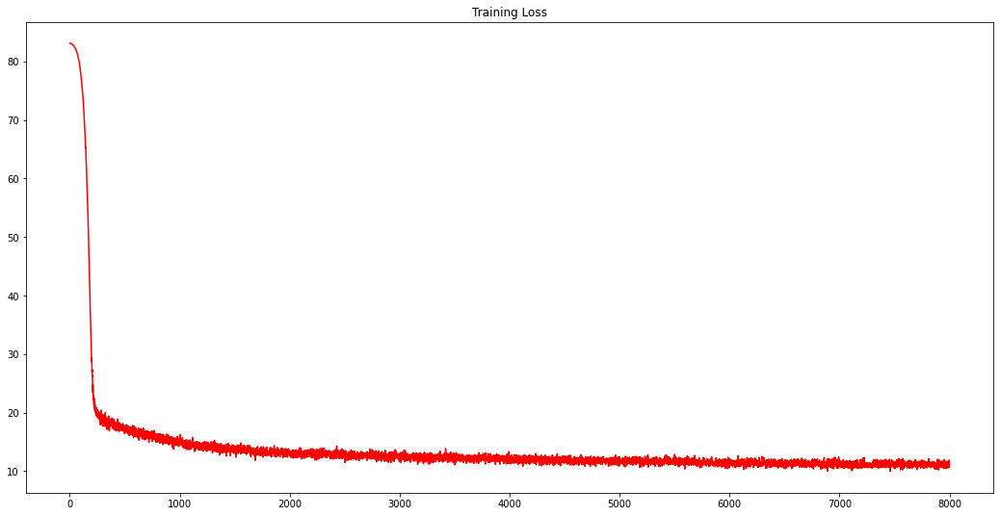

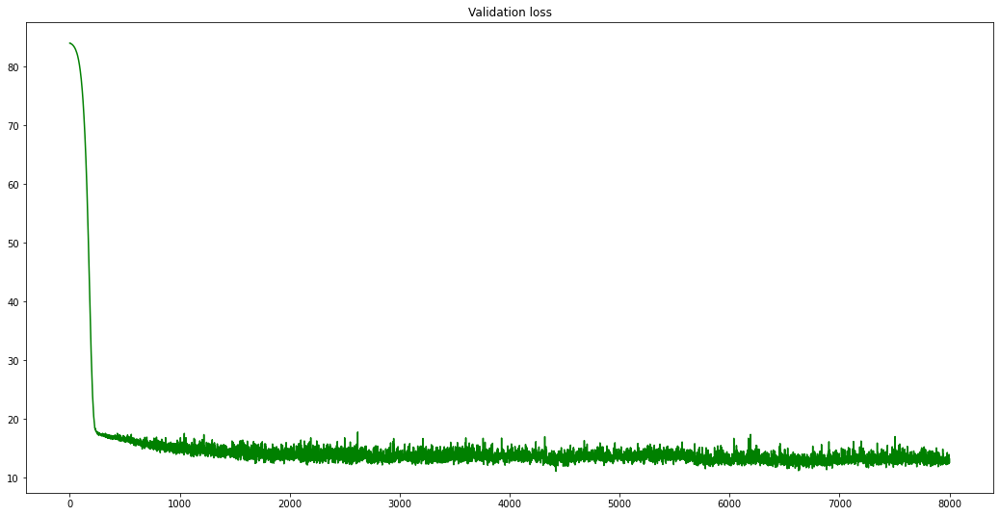

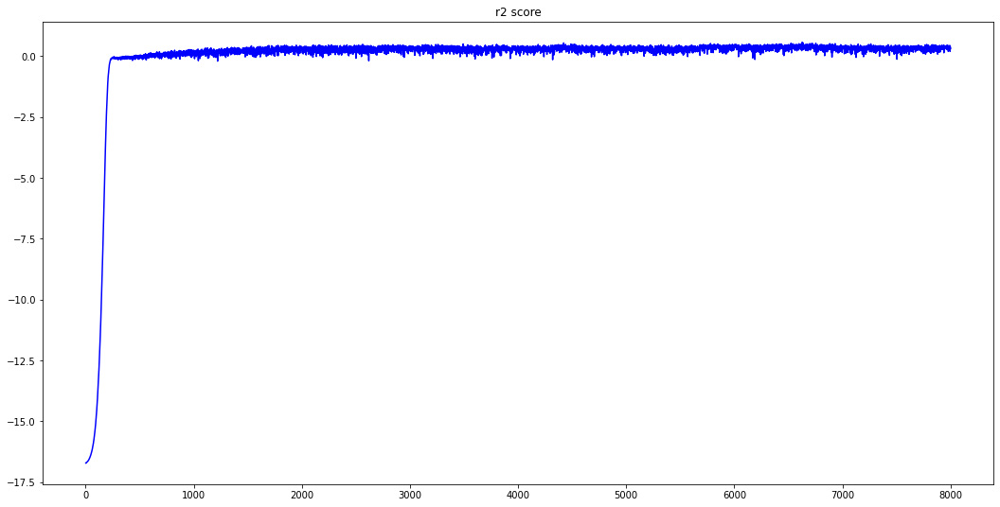

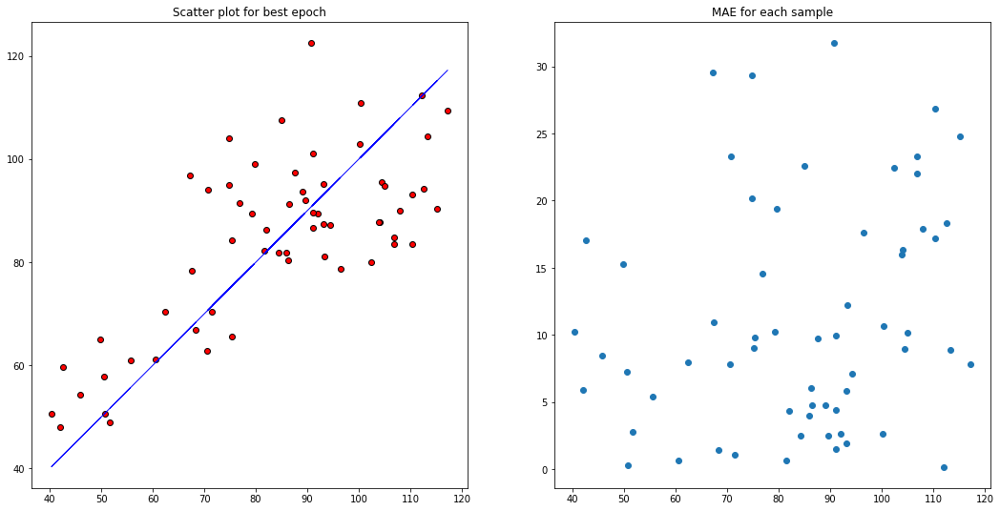

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['ASTA'])
    data_asta = data_asta[data_asta['ASTA']>=40]
    data_asta = data_asta[data_asta['ASTA']<120]

    x_t = np.array(data_asta.drop(columns = ['Device ID','ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    data_asta['mahan'] = m
    data_asta['p'] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance

    data_asta_1 = data_asta.query('p<.001')
    data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [40,60,60,79,79,78,78,70]# for 544 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<10):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=10,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID','mahan','p'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID','mahan','p'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Above code with removing outliers through Principal Componenets and mahanlobis distance.

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 10.4789 is 0.4823

 the validation loss for the epoch 6752 with loss 10.6914 is 12.9648

 the r2 score for the epoch 6752 with loss 10.6914 is 0.4888

 the validation loss for the epoch 6753 with loss 11.2699 is 12.6659

 the r2 score for the epoch 6753 with loss 11.2699 is 0.5162

 the validation loss for the epoch 6754 with loss 10.6889 is 13.2669

 the r2 score for the epoch 6754 with loss 10.6889 is 0.4790

 the validation loss for the epoch 6755 with loss 11.8065 is 13.0050

 the r2 score for the epoch 6755 with loss 11.8065 is 0.4998

 the validation loss for the epoch 6756 with loss 11.7086 is 13.5165

 the r2 score for the epoch 6756 with loss 11.7086 is 0.4563

 the validation loss for the epoch 6757 with loss 10.5749 is 14.0403

 the r2 score for the epoch 6757 with loss 10.5749 is 0.3936

 the validation loss for the epoch 6758 with loss 10.5346 is 12.9596

 the r2 score for the ep

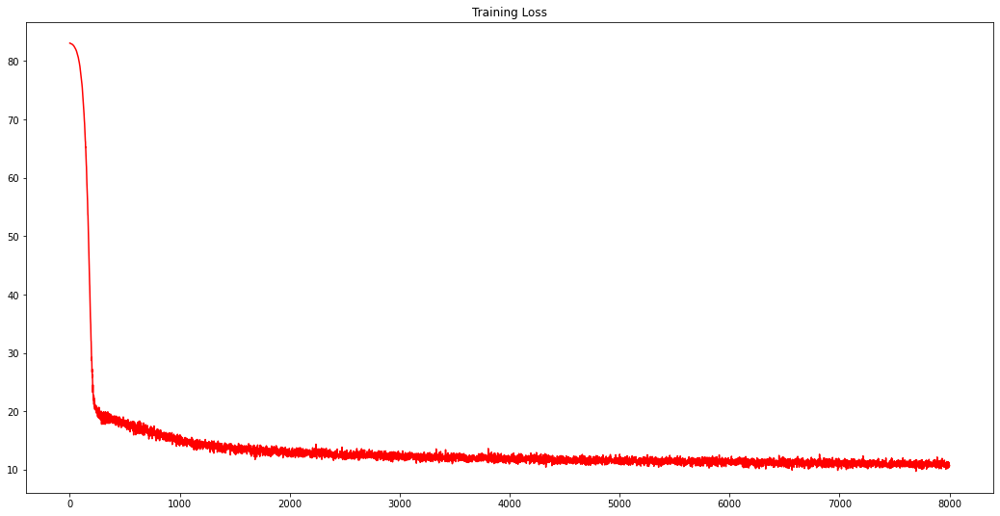

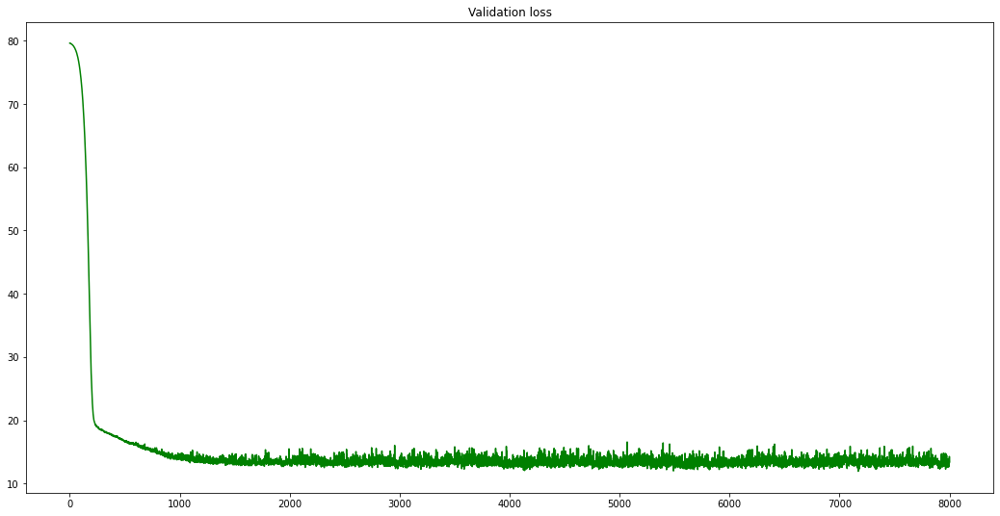

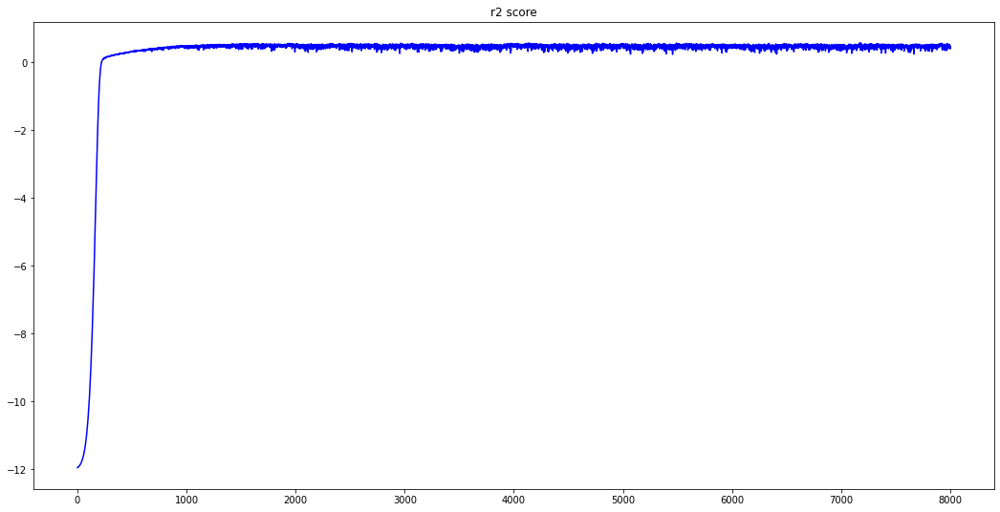

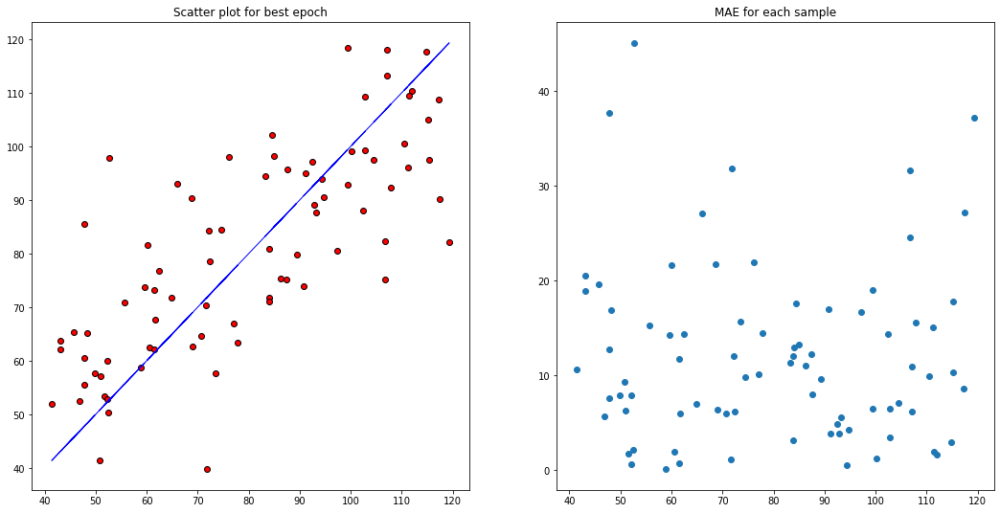

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['ASTA'])
    data_asta = data_asta[data_asta['ASTA']>=40]
    data_asta = data_asta[data_asta['ASTA']<120]

    x_t = np.array(data_asta.drop(columns = ['Device ID','ASTA']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    data_asta['PC'] = T[:,0]

    #data_asta['mahan'] = m
    #data_asta[''] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance

    data_asta_1 = data_asta.query('PC>60')
    data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [40,60,60,79,79,78,78,70]# for 544 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<10):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=10,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID','PC'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID','PC'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

### Edits on the ANN config of best model without lds one, the accuracy wasnt better

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 16.0472 is 0.4703

 the validation loss for the epoch 6752 with loss 16.5639 is 12.8033

 the r2 score for the epoch 6752 with loss 16.5639 is 0.4722

 the validation loss for the epoch 6753 with loss 15.9872 is 13.0388

 the r2 score for the epoch 6753 with loss 15.9872 is 0.4557

 the validation loss for the epoch 6754 with loss 16.4188 is 13.3305

 the r2 score for the epoch 6754 with loss 16.4188 is 0.4355

 the validation loss for the epoch 6755 with loss 16.8151 is 12.6440

 the r2 score for the epoch 6755 with loss 16.8151 is 0.4702

 the validation loss for the epoch 6756 with loss 16.0085 is 13.3651

 the r2 score for the epoch 6756 with loss 16.0085 is 0.4106

 the validation loss for the epoch 6757 with loss 16.9741 is 12.6385

 the r2 score for the epoch 6757 with loss 16.9741 is 0.4696

 the validation loss for the epoch 6758 with loss 15.4887 is 12.3533

 the r2 score for the ep

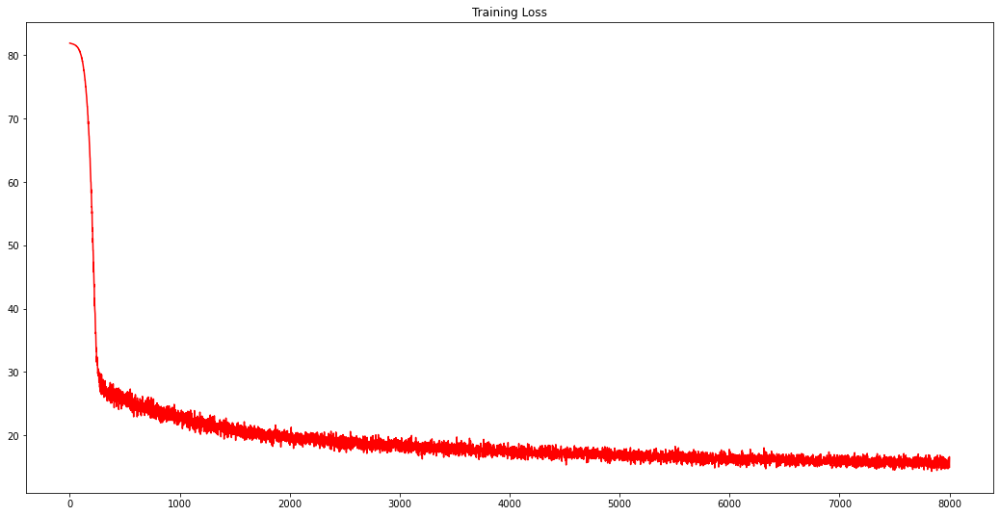

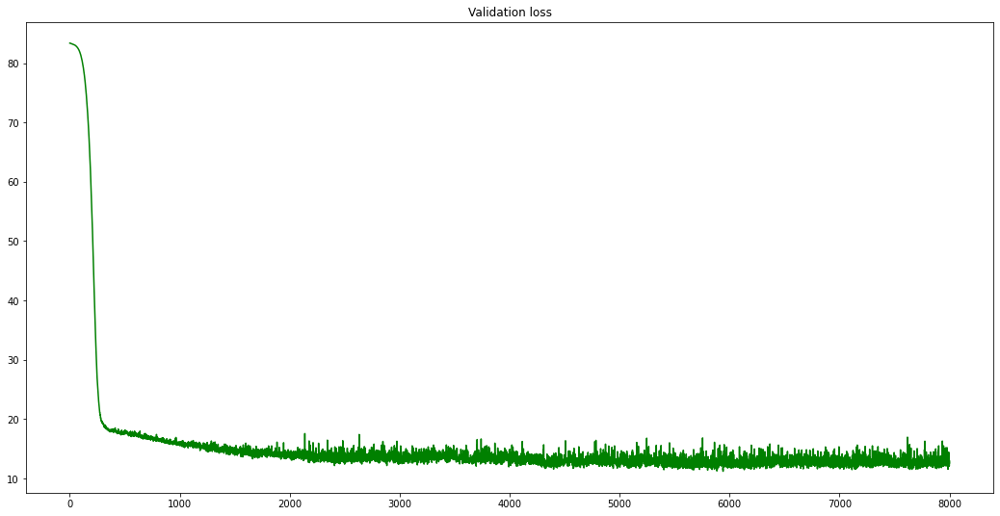

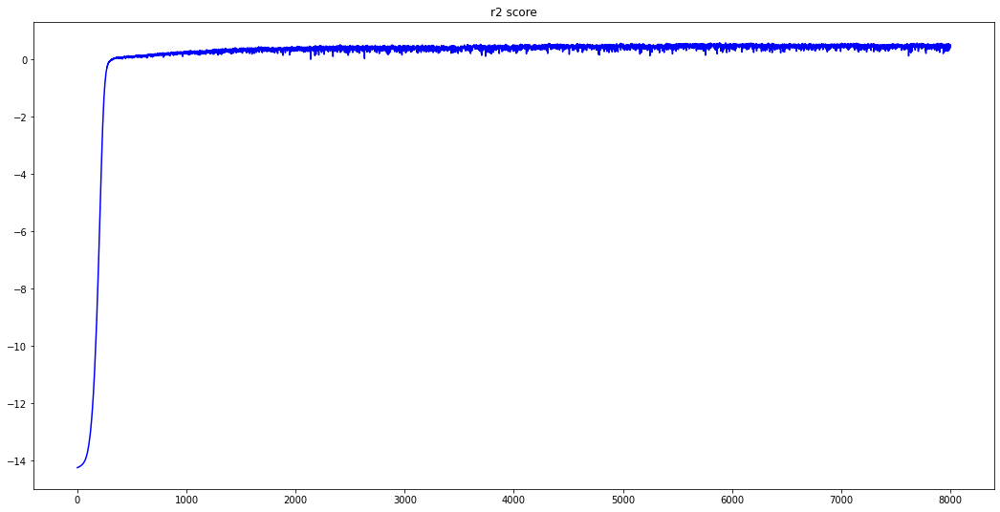

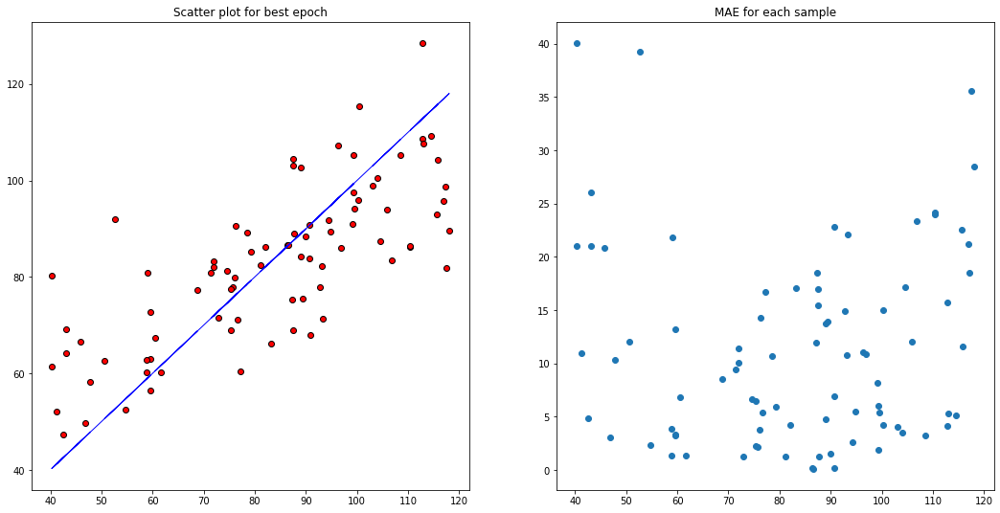

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,32))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(32,32))
        self.regress.add_module('an_Relu_6',nn.ReLU())
        self.regress.add_module('an_drop_6',nn.Dropout(p=0.2))
        self.regress.add_module('an_7',nn.Linear(32,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Dropping CNN and trying just ANN for regression

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 6751 with loss 20.0458 is -0.0136

 the validation loss for the epoch 6752 with loss 19.8994 is 18.7720

 the r2 score for the epoch 6752 with loss 19.8994 is -0.0134

 the validation loss for the epoch 6753 with loss 19.8642 is 18.7561

 the r2 score for the epoch 6753 with loss 19.8642 is -0.0123

 the validation loss for the epoch 6754 with loss 19.6499 is 18.7533

 the r2 score for the epoch 6754 with loss 19.6499 is -0.0121

 the validation loss for the epoch 6755 with loss 19.6736 is 18.7722

 the r2 score for the epoch 6755 with loss 19.6736 is -0.0134

 the validation loss for the epoch 6756 with loss 20.2338 is 18.7758

 the r2 score for the epoch 6756 with loss 20.2338 is -0.0137

 the validation loss for the epoch 6757 with loss 19.9002 is 18.7684

 the r2 score for the epoch 6757 with loss 19.9002 is -0.0131

 the validation loss for the epoch 6758 with loss 20.4475 is 18.7677

 the r2 score for

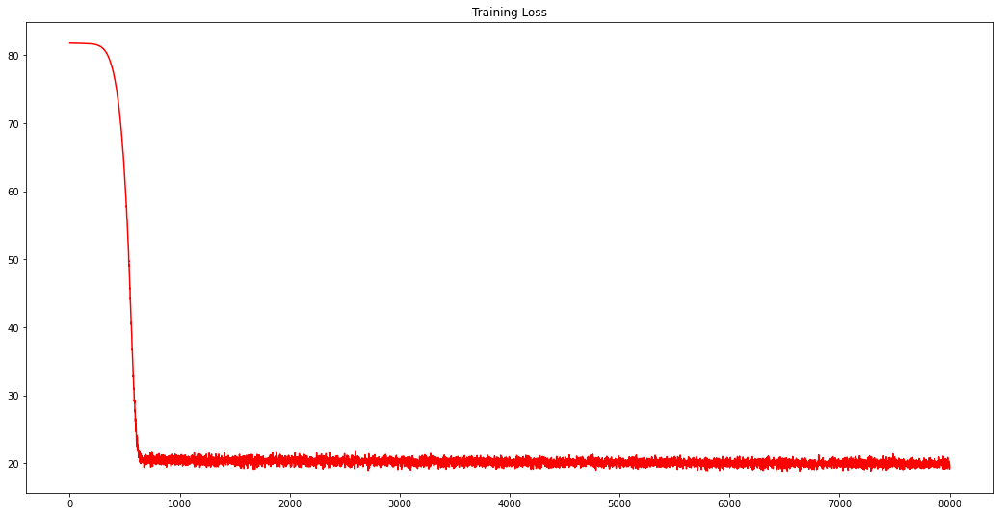

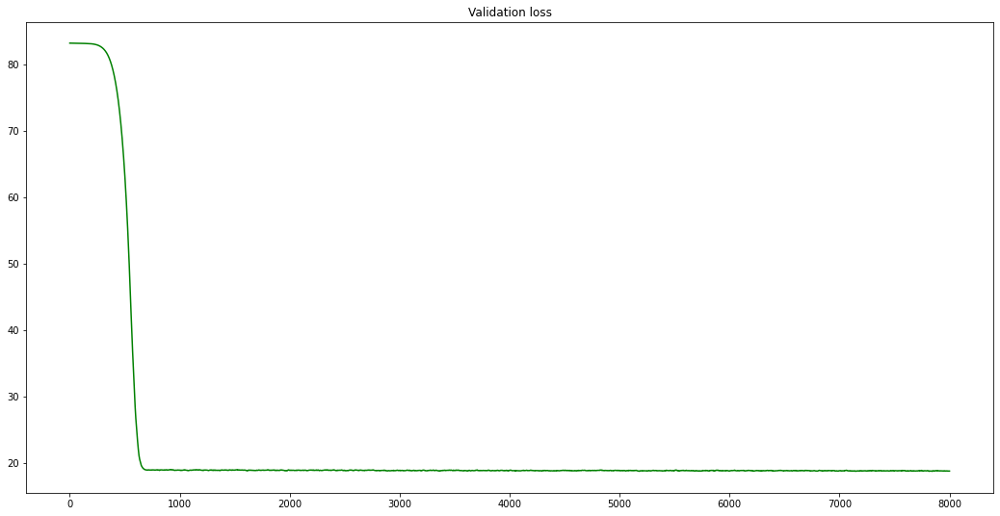

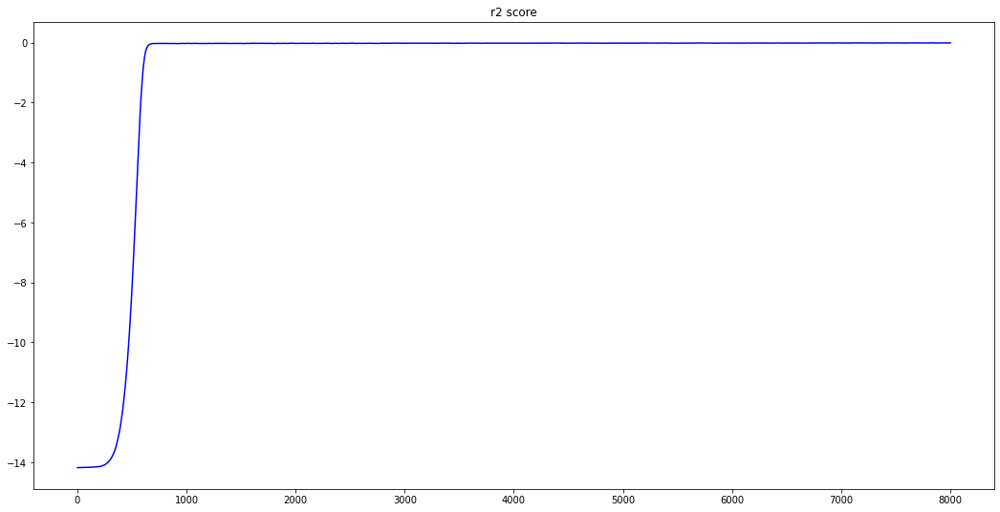

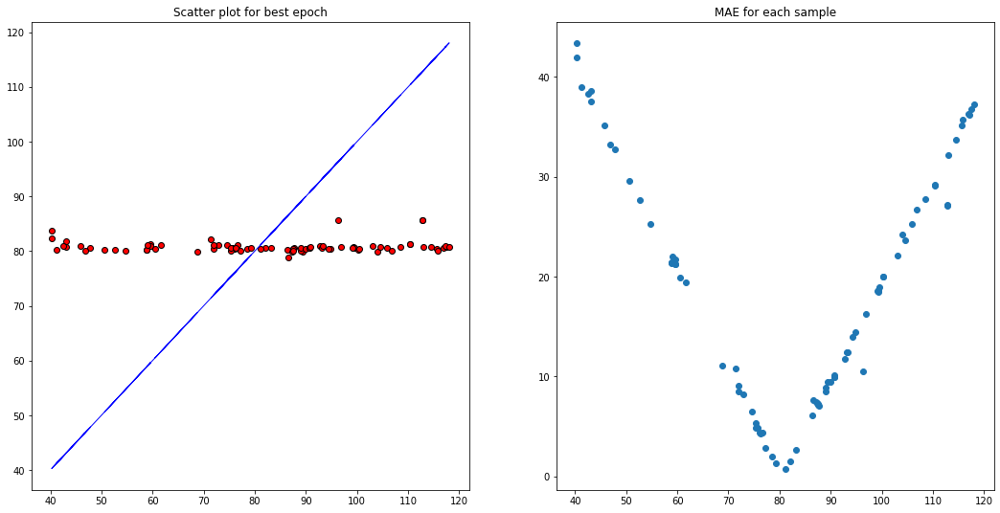

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        #self.features = nn.Sequential()
        #self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        #self.features.add_module('1_relu',nn.ReLU())            
        #self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        #self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        #self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        #self.features.add_module('2_relu',nn.ReLU())
        #self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        #self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        #self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        #self.features.add_module('3_relu',nn.ReLU())
        #self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        #self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        #self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        #self.features.add_module('4_relu',nn.ReLU())
        #self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        #self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        #self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(800,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,256))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(256,256))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(256,128))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(128,128))
        self.regress.add_module('an_Relu_6',nn.ReLU())
        self.regress.add_module('an_drop_6',nn.Dropout(p=0.2))
        self.regress.add_module('an_7',nn.Linear(128,64))
        self.regress.add_module('an_Relu_7',nn.ReLU())
        self.regress.add_module('an_drop_7',nn.Dropout(p=0.2))
        self.regress.add_module('an_8',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(800,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        #x = self.features(x)
        #x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 8000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

adding more layer for increased complexity

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,256))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(256,256))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(256,128))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(128,128))
        self.regress.add_module('an_Relu_6',nn.ReLU())
        self.regress.add_module('an_drop_6',nn.Dropout(p=0.2))
        self.regress.add_module('an_7',nn.Linear(128,64))
        self.regress.add_module('an_Relu_7',nn.ReLU())
        self.regress.add_module('an_drop_7',nn.Dropout(p=0.2))
        self.regress.add_module('an_8',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 12000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Streaming output truncated to the last 5000 lines.

 the validation loss for the epoch 5753 with loss 12.9301 is 13.5324

 the r2 score for the epoch 5753 with loss 12.9301 is 0.3987

 the validation loss for the epoch 5754 with loss 12.4736 is 12.8139

 the r2 score for the epoch 5754 with loss 12.4736 is 0.4466

 the validation loss for the epoch 5755 with loss 12.6753 is 14.0270

 the r2 score for the epoch 5755 with loss 12.6753 is 0.3320

 the validation loss for the epoch 5756 with loss 12.3357 is 13.8540

 the r2 score for the epoch 5756 with loss 12.3357 is 0.3580

 the validation loss for the epoch 5757 with loss 12.7143 is 13.3645

 the r2 score for the epoch 5757 with loss 12.7143 is 0.4007

 the validation loss for the epoch 5758 with loss 12.0428 is 12.9544

 the r2 score for the epoch 5758 with loss 12.0428 is 0.4504

 the validation loss for the epoch 5759 with loss 11.8124 is 13.0561

 the r2 score for the epoch 5759 with loss 11.8124 is 0.4499

 the validation loss for

with 1DCNN and deep ANN layers but with ANN config - 1024,256,256,64,64,16,16,1

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 10751 with loss 19.6118 is 0.0063

 the validation loss for the epoch 10752 with loss 19.9528 is 22.6533

 the r2 score for the epoch 10752 with loss 19.9528 is -0.4547

 the validation loss for the epoch 10753 with loss 20.9489 is 20.5189

 the r2 score for the epoch 10753 with loss 20.9489 is -0.2298

 the validation loss for the epoch 10754 with loss 19.8155 is 17.9277

 the r2 score for the epoch 10754 with loss 19.8155 is 0.0316

 the validation loss for the epoch 10755 with loss 20.2450 is 19.1238

 the r2 score for the epoch 10755 with loss 20.2450 is -0.0770

 the validation loss for the epoch 10756 with loss 19.6984 is 19.4424

 the r2 score for the epoch 10756 with loss 19.6984 is -0.1260

 the validation loss for the epoch 10757 with loss 19.0366 is 19.5979

 the r2 score for the epoch 10757 with loss 19.0366 is -0.1537

 the validation loss for the epoch 10758 with loss 18.5934 is 17.7784

 the 

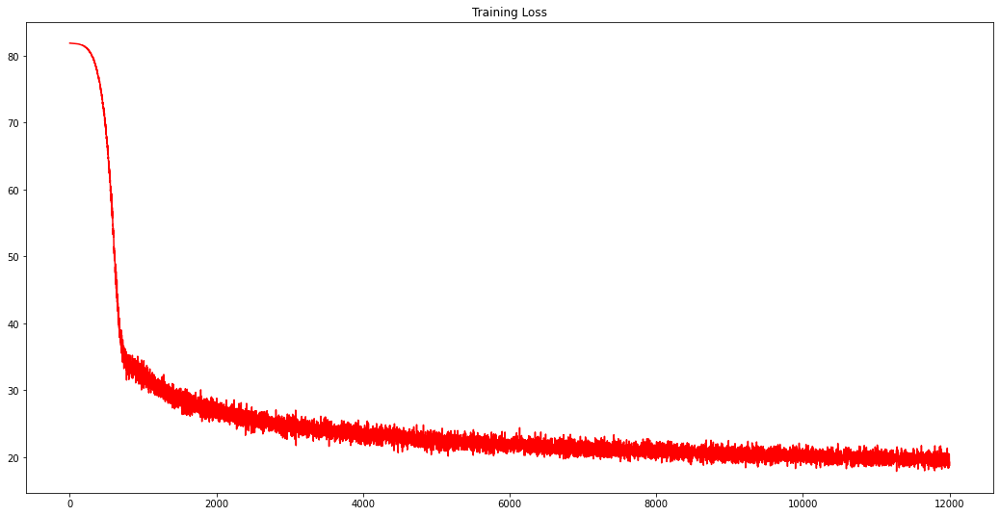

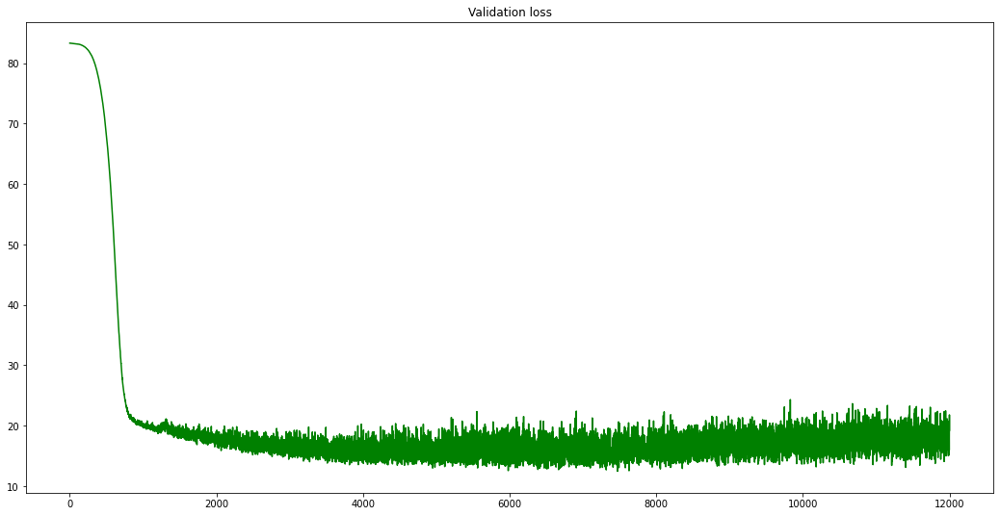

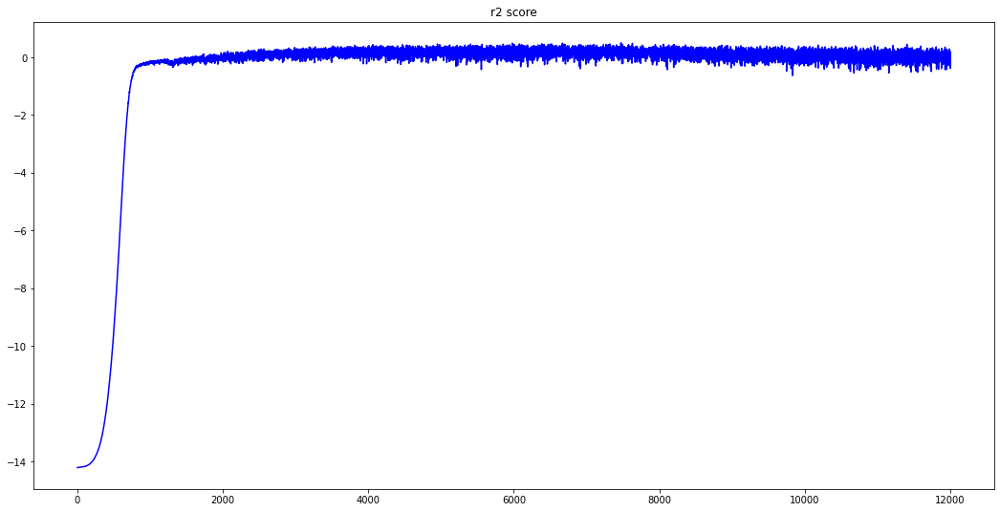

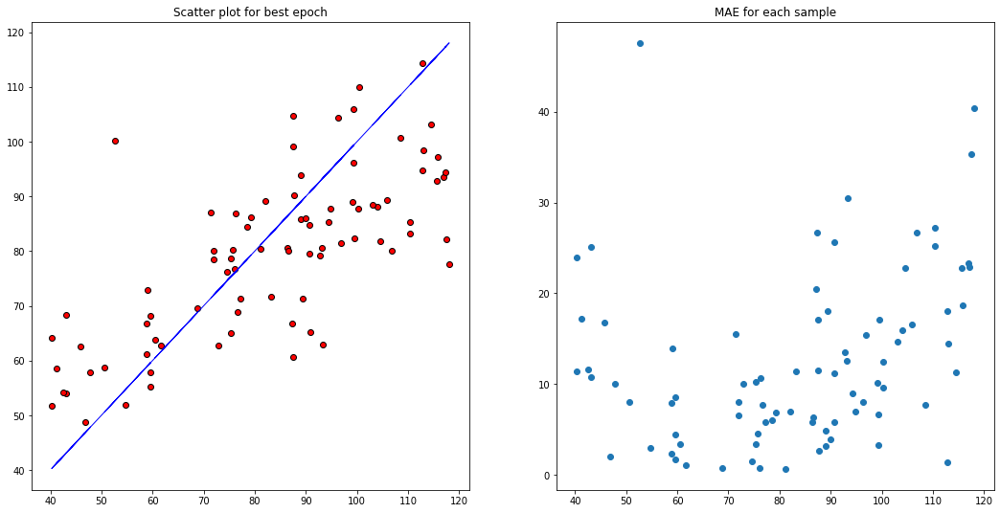

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,256))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(256,256))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(256,64))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(64,64))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(64,16))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(16,16))
        self.regress.add_module('an_Relu_6',nn.ReLU())
        self.regress.add_module('an_drop_6',nn.Dropout(p=0.2))
        self.regress.add_module('an_7',nn.Linear(16,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_id = [*set(d_asta['Device ID'])]
    for j in range(len(d_id)):
      d_asta = d_asta.replace(d_id[j],j)
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [55,70,76,96,96,86,86,75]# for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA','Device ID'])))
        Y_train_1.append(np.array(data_asta_3_1['ASTA']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA','Device ID'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train_1,Y_train_2,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 12000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_1)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

With different model configuration with decreased kernel size of 11 for conv , 3 conv layers and maxpool kernel size of 3

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 2751 with loss 23.7665 is -0.8130

 the validation loss for the epoch 2752 with loss 24.2737 is 24.8225

 the r2 score for the epoch 2752 with loss 24.2737 is -0.7800

 the validation loss for the epoch 2753 with loss 24.5544 is 25.0039

 the r2 score for the epoch 2753 with loss 24.5544 is -0.8068

 the validation loss for the epoch 2754 with loss 23.7386 is 24.8818

 the r2 score for the epoch 2754 with loss 23.7386 is -0.7873

 the validation loss for the epoch 2755 with loss 23.2904 is 24.7831

 the r2 score for the epoch 2755 with loss 23.2904 is -0.7705

 the validation loss for the epoch 2756 with loss 24.4459 is 24.7732

 the r2 score for the epoch 2756 with loss 24.4459 is -0.7666

 the validation loss for the epoch 2757 with loss 24.0131 is 24.8237

 the r2 score for the epoch 2757 with loss 24.0131 is -0.7720

 the validation loss for the epoch 2758 with loss 23.6330 is 24.8549

 the r2 score for

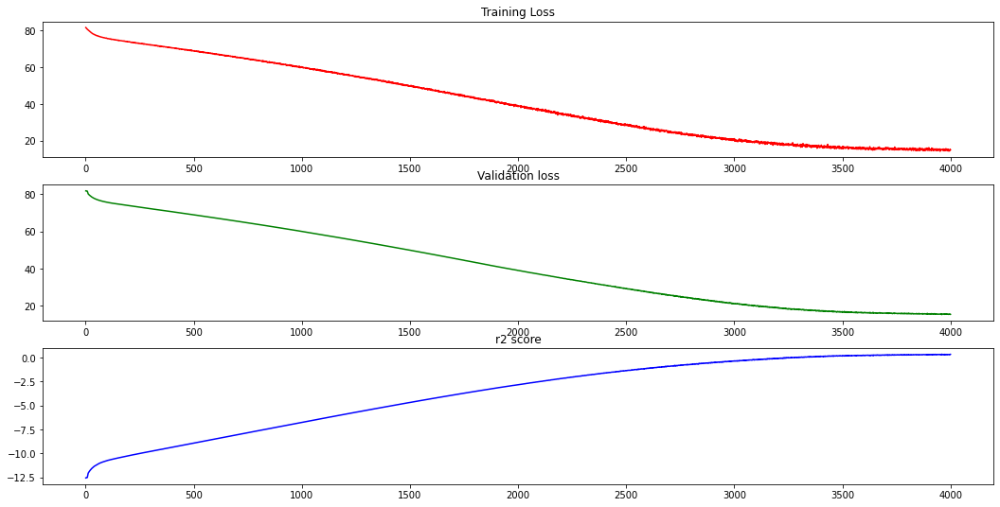

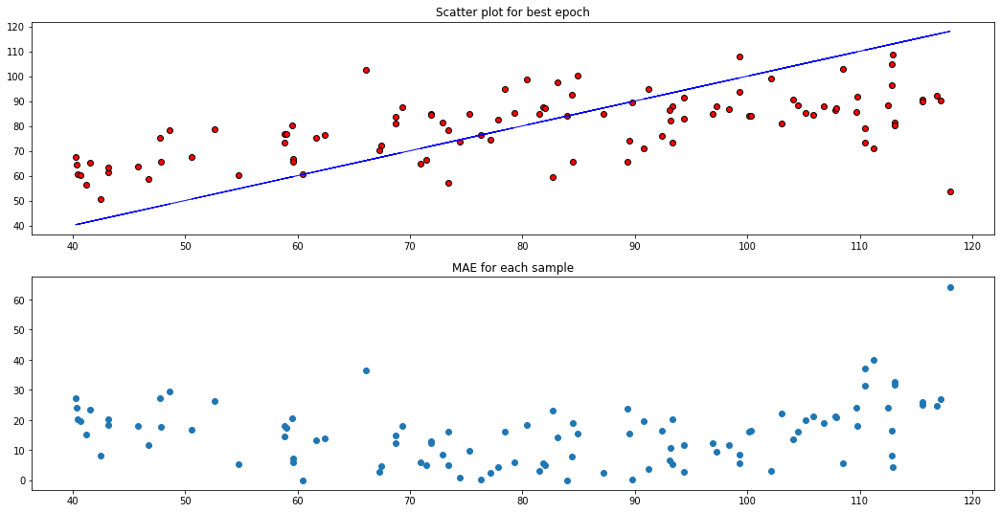

In [ ]:
 # the regression model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=11))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=3))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=11))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=11))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=11))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(512,32))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(32,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','Cap']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [50,70,70,90,90,80,80,70] # for 600 samples to train.
    k = 40
    for i in range(len(l)):
        qr = 'ASTA>='+str(k+i*10)+' & ASTA<'+str(k+(i+1)*10)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<14):
            data_asta_3_2 = data_asta_3_2.sample(n=9,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=14,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'ASTA')))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'ASTA')))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 4000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            #t_x_dt.to(device)
            #print(list(t_x_dt.shape))
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            #t_y_org = torch.log(t_y_org)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_actual_pred.csv')


if __name__ == '__main__':
    run()

### Trying on mixed dataset with data augmentatoin and lds

so model description n this we are using twice the sample for testing due to increase in dataset. The dataset used is old data and new data

usingcudadevice

 the validation loss for the epoch 1 with loss 64.4669 is 78.4750

 the r2 score for the epoch 1 with loss 64.4669 is -11.5195

 the validation loss for the epoch 51 with loss 10.8624 is 11.3063

 the r2 score for the epoch 51 with loss 10.8624 is 0.6213

 the validation loss for the epoch 101 with loss 9.9721 is 12.2500

 the r2 score for the epoch 101 with loss 9.9721 is 0.5578

 the validation loss for the epoch 151 with loss 9.4797 is 12.1250

 the r2 score for the epoch 151 with loss 9.4797 is 0.5758

 the validation loss for the epoch 201 with loss 9.0049 is 11.4688

 the r2 score for the epoch 201 with loss 9.0049 is 0.6171

 the validation loss for the epoch 251 with loss 8.8439 is 10.7563

 the r2 score for the epoch 251 with loss 8.8439 is 0.6522

 the validation loss for the epoch 301 with loss 8.5430 is 10.7625

 the r2 score for the epoch 301 with loss 8.5430 is 0.6485

 the validation loss for the epoch 351 with loss 8.3230 is 10.6500

 the r2 score for t

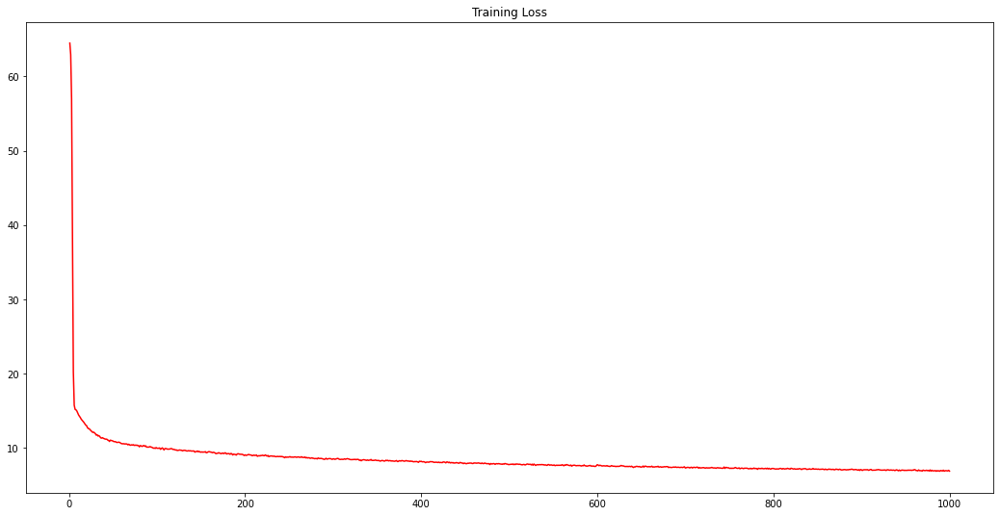

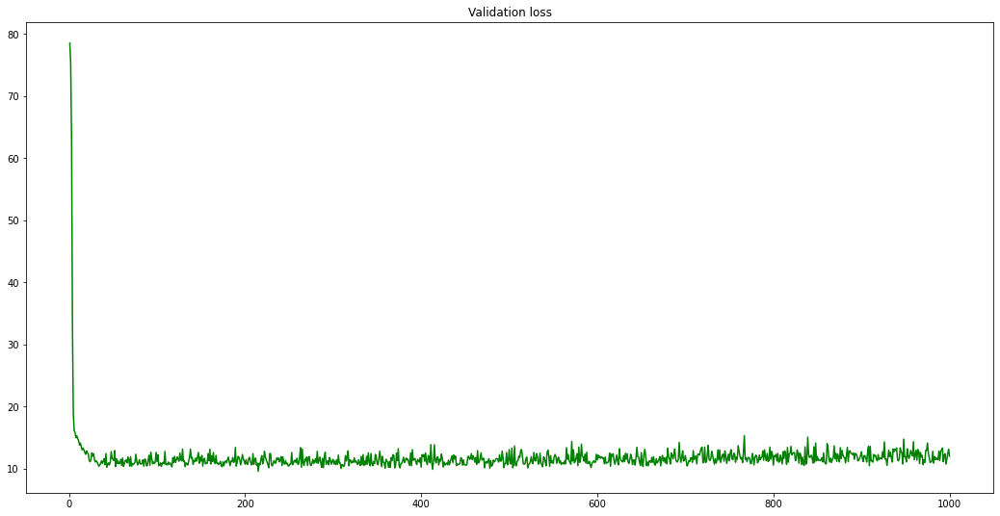

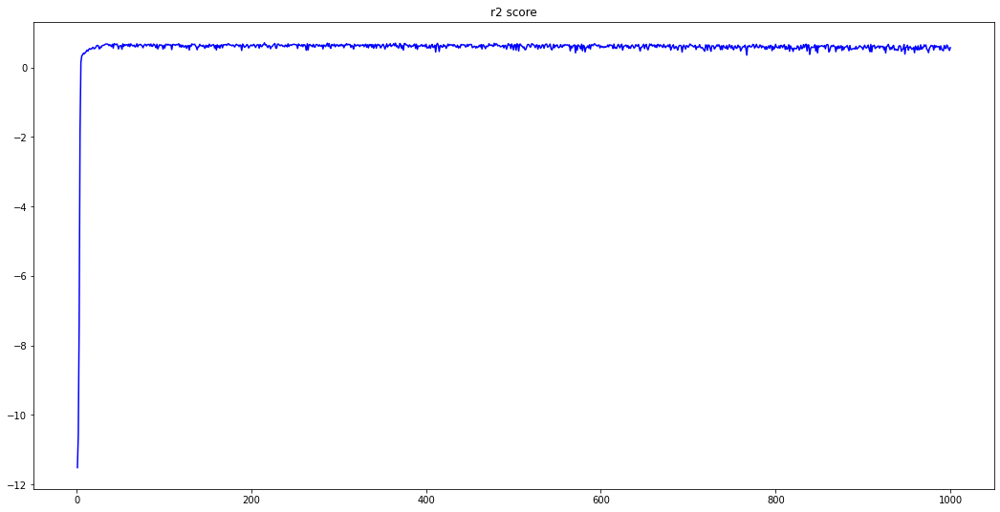

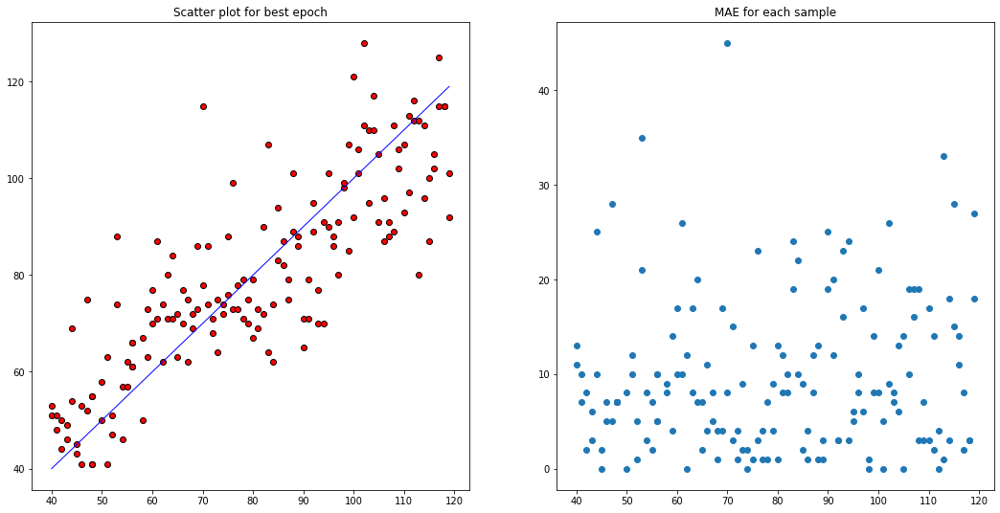

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys

# pynvml import *

b_size = 32 #batch size
np.random.seed(100)

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 11, 2)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

def dataaugment(x, betashift = 0.05, slopeshift = 0.05,multishift = 0.05):
    #Shift of baseline
    #calculate arrays
    beta = np.random.random(size=(x.shape[0],1))*2*betashift-betashift
    slope = np.random.random(size=(x.shape[0],1))*2*slopeshift-slopeshift + 1
    #Calculate relative position
    axis = np.array(range(x.shape[1]))/float(x.shape[1])
    #Calculate offset to be added
    offset = slope*(axis) + beta - axis - slope/2. + 0.5

    #Multiplicative
    multi = np.random.random(size=(x.shape[0],1))*2*multishift-multishift + 1

    x = multi*x + offset

    return x

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','Cap','800','Device ID']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['ASTA'])
    d_asta['ASTA'] = d_asta['ASTA'].round()
    d_asta = d_asta[d_asta['ASTA']>=40]
    d_asta = d_asta[d_asta['ASTA']<120]

    X_train = []
    X_val = []
    Y_train = []
    Y_val = []

    value_dict = {x:0 for x in range(40,120)}
    labels = d_asta['ASTA']
    
    
    for label in labels:
        value_dict[(int(label))]+=1

    l_1 = np.array([x for x in value_dict.values()])

    for x,y in value_dict.items():
        if(y>3):
            qr = 'ASTA=='+str(x)
            data_asta_3 = d_asta.query(qr)
            data_asta_3_2 = data_asta_3.sample(n=2,random_state = sed)
            data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['ASTA'])))
        Y_train.append(np.array(data_asta_3_1['ASTA']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['ASTA'])))
        Y_val.append(np.array(data_asta_3_2['ASTA']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    #x_train = pd.DataFrame(X_train)
    #x_train['Actual Y'] = Y_train
    #x_train.to_csv('train_chili.csv')

    X_train_aug = np.repeat(X_train,repeats = 24, axis = 0)
    shift = .1*np.std(X_train)
    X_train_aug = dataaugment(X_train_aug,betashift = shift,slopeshift = shift/2,multishift = shift)
    X_train = np.concatenate((X_train,X_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train,repeats = 24 ,axis = 0)
    Y_train = np.concatenate((Y_train,Y_train_aug),axis = 0)



    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train = Y_train[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val,get_weights(l_1)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-002.csv'
    x_train,y_train,x_val,y_val,wt = data_1D(file_name)
    best_v_loss = 1_000_000
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat = model.forward(t_x_dt)
            t_yhat = torch.squeeze(t_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            weights = torch.tensor([wt[int(x-40)] for x in z_y_1[i] ]).to(device=device)

            err = loss(t_yhat,t_y_1_org,weights)

            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()

            gg = model.state_dict()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = torch.round(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()

            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            R2_L.append(r2_score)
            if e%50 == 0:
                print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
                print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.round(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_asta_40_120_lds_dataaug_2_{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')
                model_wts = gg

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    torch.save(model_wts,dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_lds_aug_actual_pred_2.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_train_lds_aug_actual_pred_2.csv')


if __name__ == '__main__':
    run()

# Capsaicin on 1DCNNN

## **training capsaicin on 1DCNN**

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 50 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [70,95,95,95,95] # for 280 samples to train.
    k = 25000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<13):
            data_asta_3_2 = data_asta_3_2.sample(n=8,random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=12,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)


    return X_train,Y_train,X_val,Y_val


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train,x_val,y_val = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(np.log(z_y[i])),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_rsme = loss(t_yhat,t_y_org)
            err_rsme.backward()
            optimizer.step()
            t_loss += float(err_rsme.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(np.log(y_val)),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            #v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = torch.exp(v_yhat).to('cpu')
            r2_score = sklearn.metrics.r2_score(y_val,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = torch.exp(vt_yhat)
            #v_yhat = torch.exp(v_yhat)
            #vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                #b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(3,1,1)
    ax2 = fig.add_subplot(3,1,2)
    ax3 = fig.add_subplot(3,1,3)
    ax4 = fig_2.add_subplot(2,1,1)
    ax5 = fig_2.add_subplot(2,1,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - y_val)
    ax5.plot(y_val,ttt,marker ='o',linestyle='')
    ax4.scatter(y_val,b_yhat,c='red',edgecolors='k')
    ax4.plot(y_val,y_val,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Streaming output truncated to the last 5000 lines.

 the validation loss for the epoch 736 with loss 0.7783 is 0.1804

 the r2 score for the epoch 736 with loss 0.7783 is -0.4417

 the validation loss for the epoch 737 with loss 0.7476 is 0.1711

 the r2 score for the epoch 737 with loss 0.7476 is -0.3299

 the validation loss for the epoch 738 with loss 0.6977 is 0.1618

 the r2 score for the epoch 738 with loss 0.6977 is -0.2439

 the validation loss for the epoch 739 with loss 0.7739 is 0.1753

 the r2 score for the epoch 739 with loss 0.7739 is -0.3753

 the validation loss for the epoch 740 with loss 0.7321 is 0.1586

 the r2 score for the epoch 740 with loss 0.7321 is -0.2150

 the validation loss for the epoch 741 with loss 0.7351 is 0.1593

 the r2 score for the epoch 741 with loss 0.7351 is -0.2176

 the validation loss for the epoch 742 with loss 0.6880 is 0.1745

 the r2 score for the epoch 742 with loss 0.6880 is -0.3626

 the validation loss for the epoch 743 with loss 0.7

KeyboardInterrupt: ignored

1DCNN Cap with dividing by 16 and then performing SNV on the Y label

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1 with loss 0.2342 is -2.5107
loss in training dataset after epoch 1 is 35259.2734

 the validation loss for the epoch 2 with loss 0.2153 is 53321.9720

 the r2 score for the epoch 2 with loss 0.2153 is -7.0609
loss in training dataset after epoch 2 is 56732.7681

 the validation loss for the epoch 3 with loss 0.2295 is 73192.6149

 the r2 score for the epoch 3 with loss 0.2295 is -13.3021
loss in training dataset after epoch 3 is 76615.2207

 the validation loss for the epoch 4 with loss 0.2407 is 93724.3278

 the r2 score for the epoch 4 with loss 0.2407 is -21.8049
loss in training dataset after epoch 4 is 97164.9000

 the validation loss for the epoch 5 with loss 0.2252 is 109705.1686

 the r2 score for the epoch 5 with loss 0.2252 is -29.8513
loss in training dataset after epoch 5 is 113218.8192

 the validation loss for the epoch 6 with loss 0.2240 is 101671.8666

 the r2 score for the epoch 6 with lo

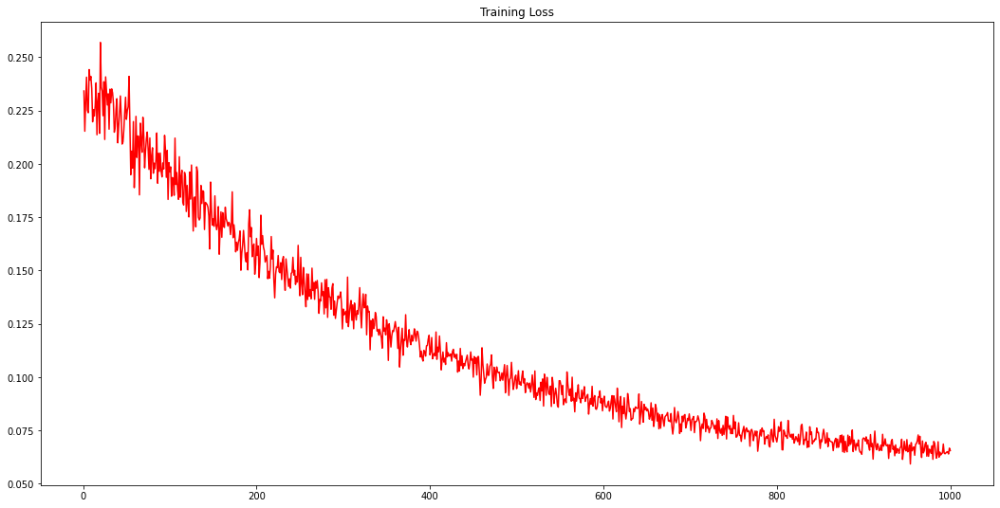

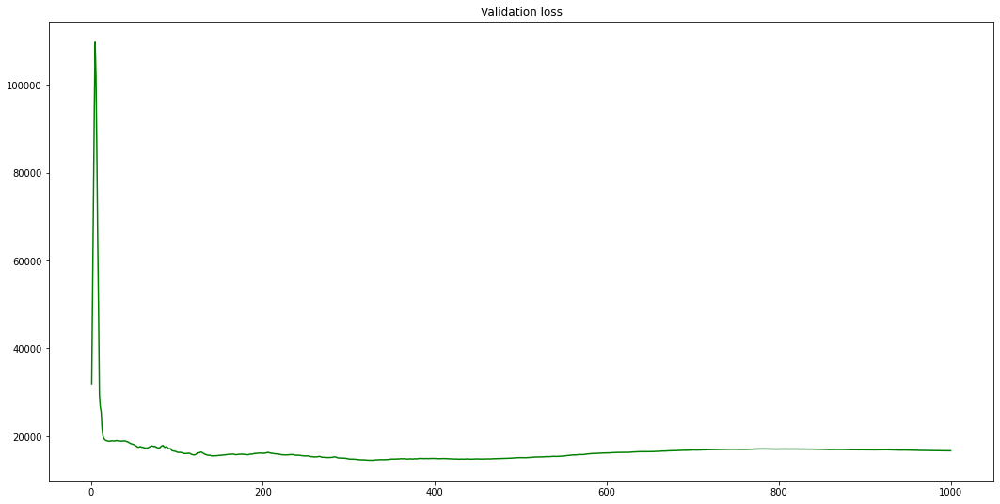

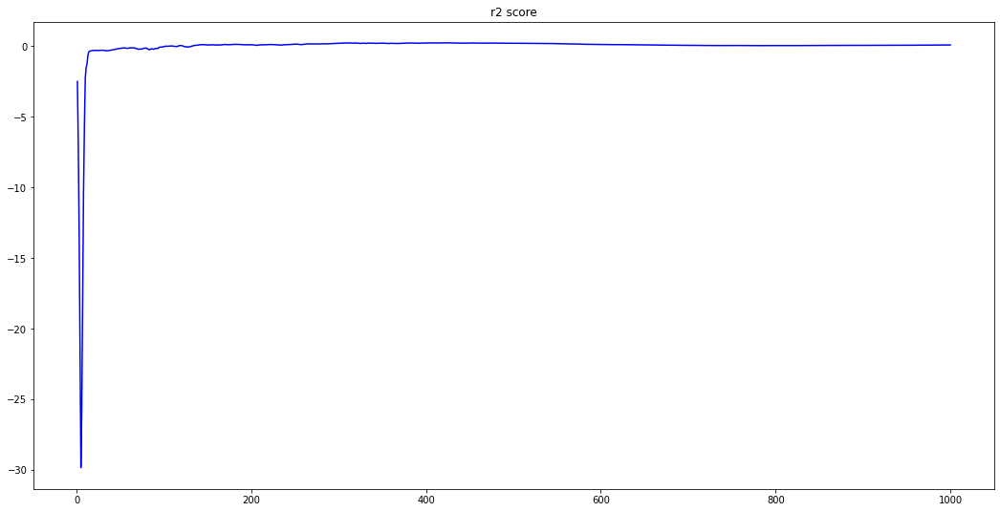

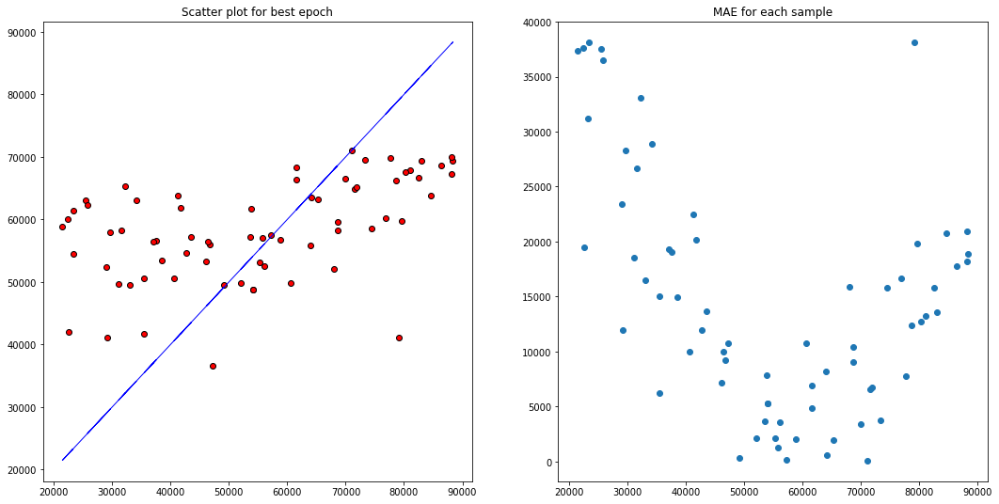

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=20))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=20))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=20))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,100))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(100,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [26,26,26,26,26,26,26,26,26,26,26,12,12,10] # for 280 samples to train.
    k = 20000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st


    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.0000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

1DCNN with different architecture reduced kernel size and constant odd window size.

Not fitting only drop this

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1 with loss 0.3056 is -2.7062
loss in training dataset after epoch 1 is 29634.7712

 the validation loss for the epoch 2 with loss 0.3290 is 27172.4272

 the r2 score for the epoch 2 with loss 0.3290 is -1.7026
loss in training dataset after epoch 2 is 23907.0886

 the validation loss for the epoch 3 with loss 0.3099 is 19137.0163

 the r2 score for the epoch 3 with loss 0.3099 is -0.3048
loss in training dataset after epoch 3 is 16584.5592

 the validation loss for the epoch 4 with loss 0.3408 is 17589.2438

 the r2 score for the epoch 4 with loss 0.3408 is -0.0281
loss in training dataset after epoch 4 is 15748.9512

 the validation loss for the epoch 5 with loss 0.3144 is 17536.6770

 the r2 score for the epoch 5 with loss 0.3144 is -0.0228
loss in training dataset after epoch 5 is 15746.2750

 the validation loss for the epoch 6 with loss 0.3385 is 17597.1194

 the r2 score for the epoch 6 with loss 0.3

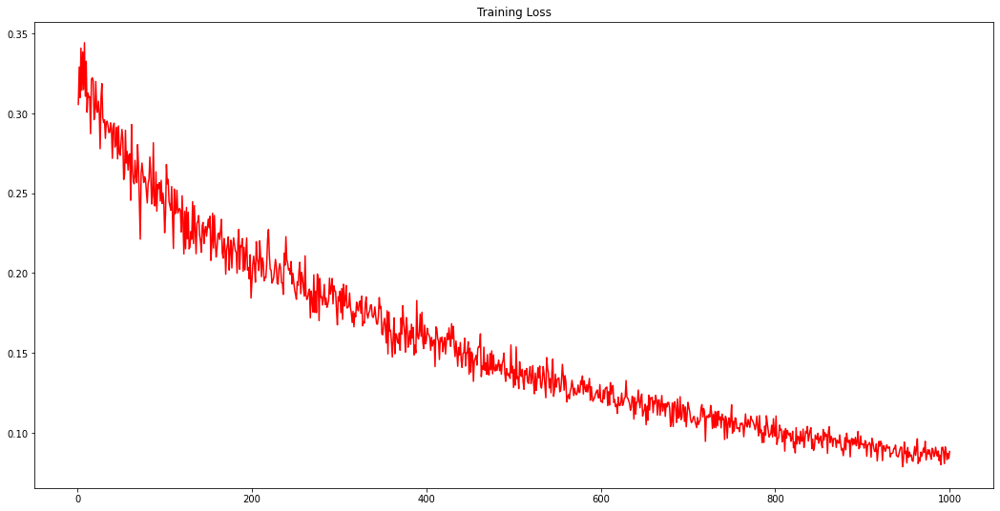

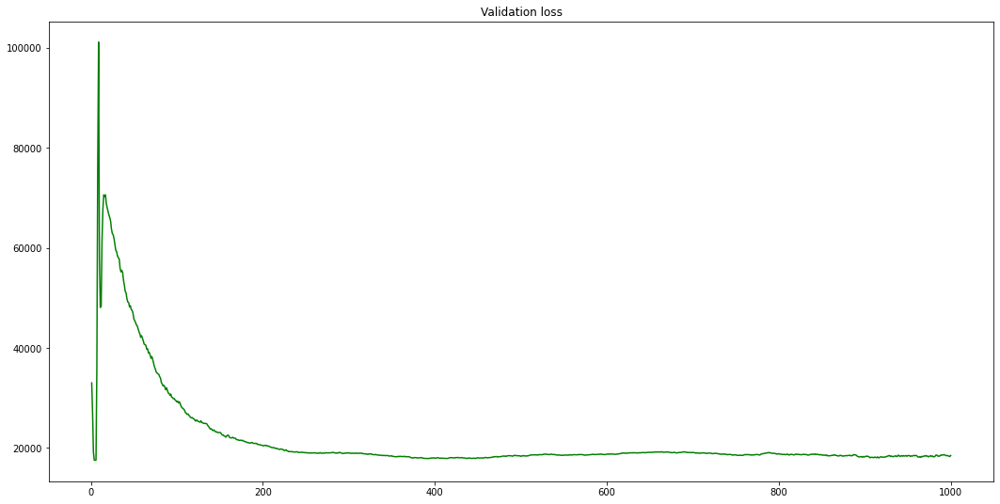

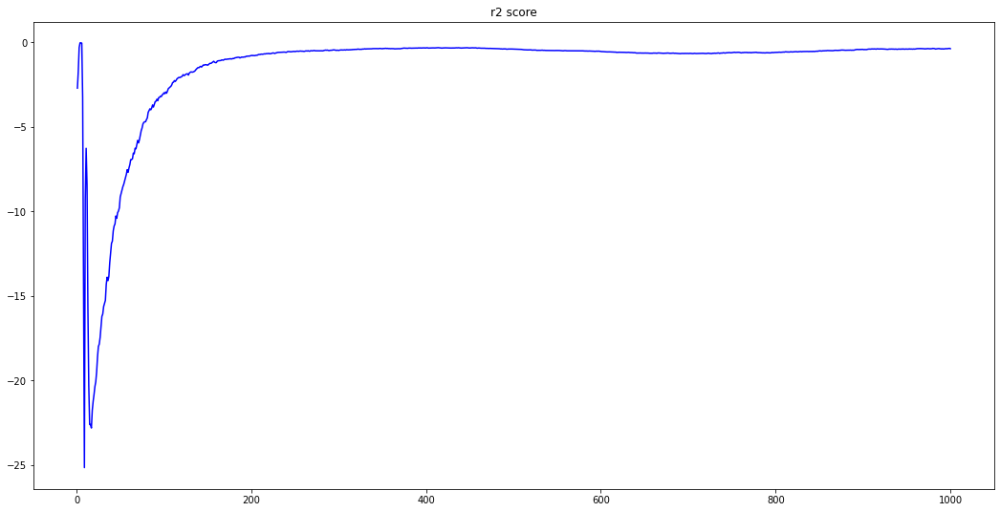

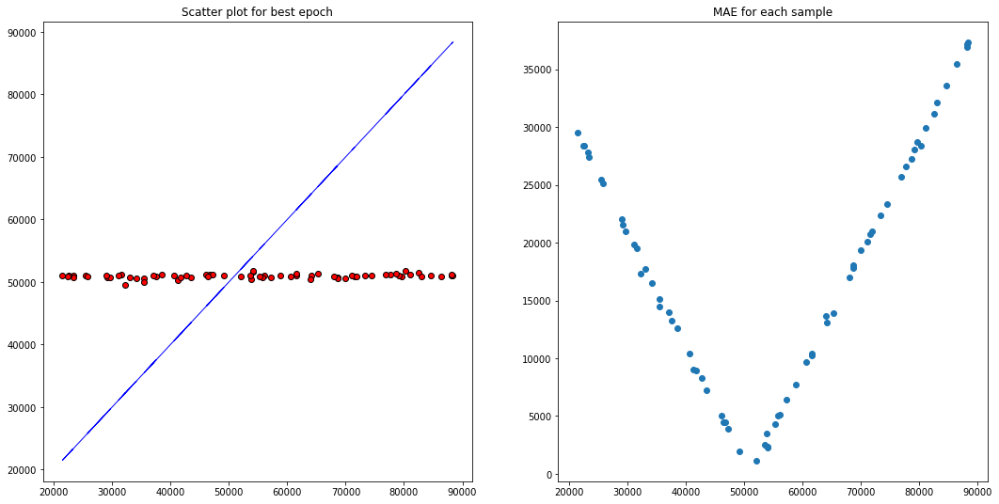

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=11))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=3))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=11))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=11))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=11))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(512,32))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(32,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [26,26,26,26,26,26,26,26,26,26,26,12,12,10] # for 280 samples to train.
    k = 20000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st


    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.0000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

1DCNN with reduced layer size but with increased window size and kernel size.

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1 with loss 0.2937 is -3.2217
loss in training dataset after epoch 1 is 39423.5538

 the validation loss for the epoch 2 with loss 0.3105 is 37965.6511

 the r2 score for the epoch 2 with loss 0.3105 is -3.5798
loss in training dataset after epoch 2 is 41370.1439

 the validation loss for the epoch 3 with loss 0.2994 is 36031.6654

 the r2 score for the epoch 3 with loss 0.2994 is -3.2250
loss in training dataset after epoch 3 is 39423.5434

 the validation loss for the epoch 4 with loss 0.3019 is 32780.5019

 the r2 score for the epoch 4 with loss 0.3019 is -2.6562
loss in training dataset after epoch 4 is 36085.6376

 the validation loss for the epoch 5 with loss 0.3086 is 34862.2850

 the r2 score for the epoch 5 with loss 0.3086 is -3.0202
loss in training dataset after epoch 5 is 38119.0383

 the validation loss for the epoch 6 with loss 0.2857 is 49468.5594

 the r2 score for the epoch 6 with loss 0.2

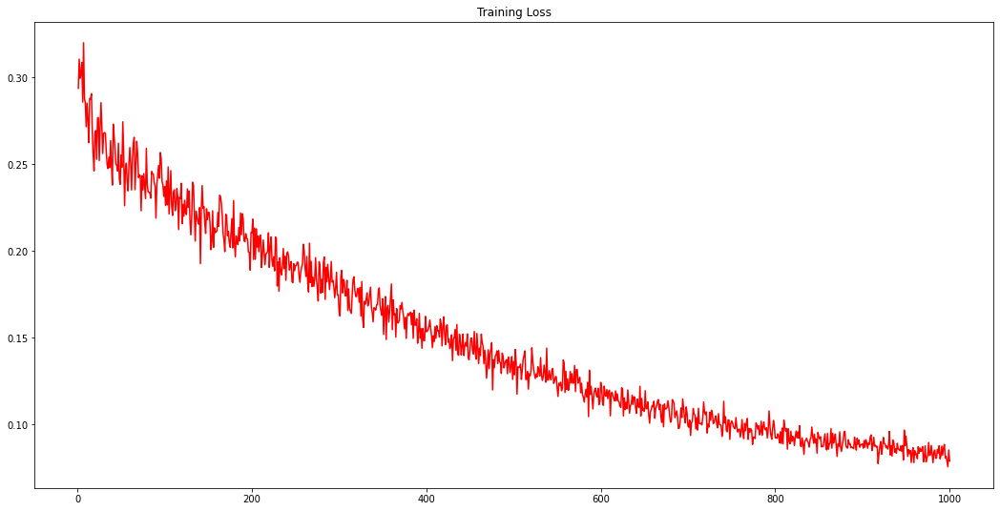

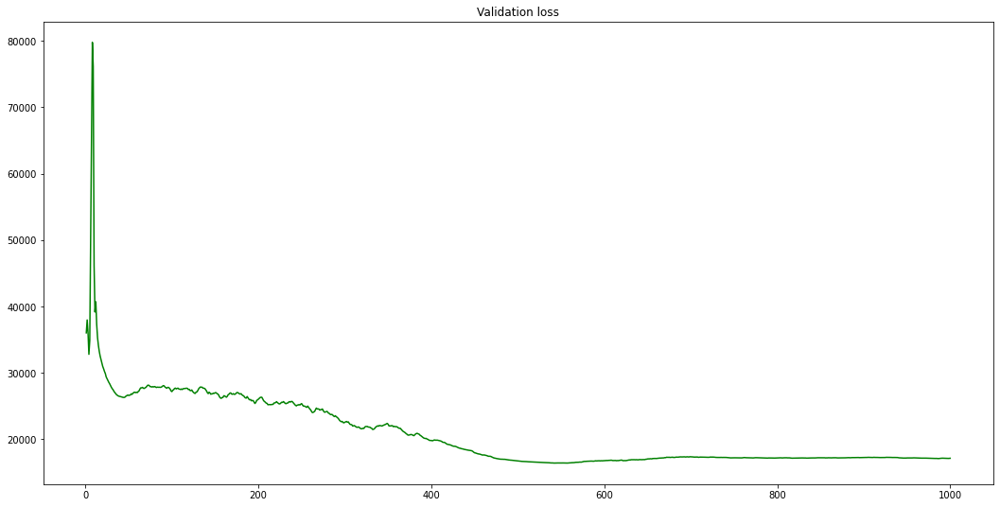

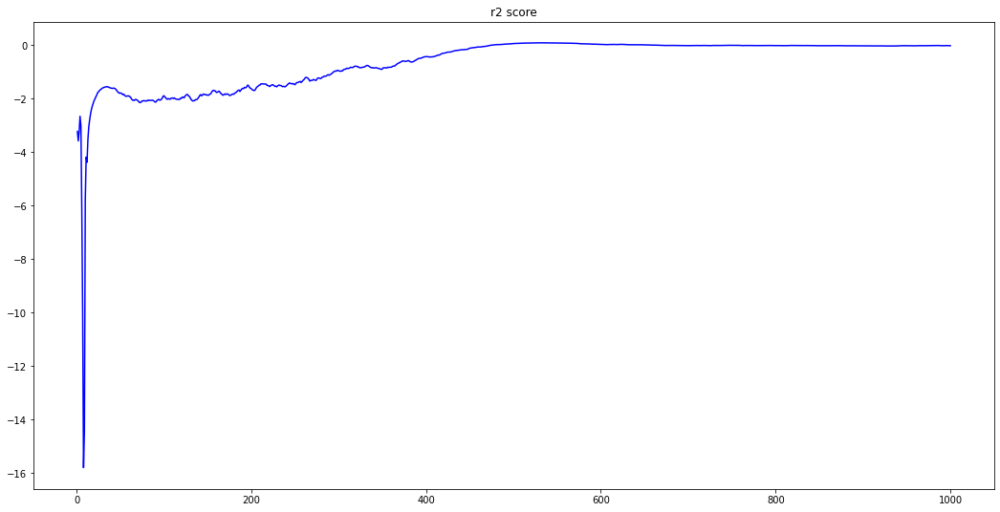

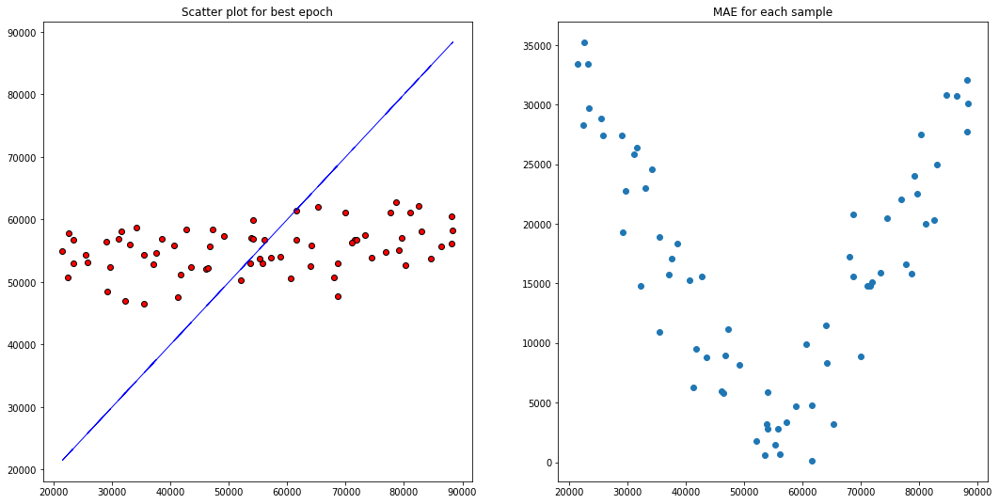

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=19))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=3))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=19))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=19))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=5))

        #self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=20))
        #self.features.add_module('4_relu',nn.ReLU())
        #self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        #self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=4))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,64))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [26,26,26,26,26,26,26,26,26,26,26,12,12,10] # for 280 samples to train.
    k = 20000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st


    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.0000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

With more Deep CNN layers to fit the model for training.

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1 with loss 0.2287 is -0.4839
loss in training dataset after epoch 1 is 21004.4258

 the validation loss for the epoch 2 with loss 0.2347 is 21154.0481

 the r2 score for the epoch 2 with loss 0.2347 is -0.6440
loss in training dataset after epoch 2 is 22327.7288

 the validation loss for the epoch 3 with loss 0.2271 is 30301.9509

 the r2 score for the epoch 3 with loss 0.2271 is -2.2235
loss in training dataset after epoch 3 is 33464.0820

 the validation loss for the epoch 4 with loss 0.2370 is 24956.5786

 the r2 score for the epoch 4 with loss 0.2370 is -1.3018
loss in training dataset after epoch 4 is 27169.1746

 the validation loss for the epoch 5 with loss 0.2205 is 40591.4085

 the r2 score for the epoch 5 with loss 0.2205 is -4.1527
loss in training dataset after epoch 5 is 43592.5285

 the validation loss for the epoch 6 with loss 0.2226 is 34411.0362

 the r2 score for the epoch 6 with loss 0.2

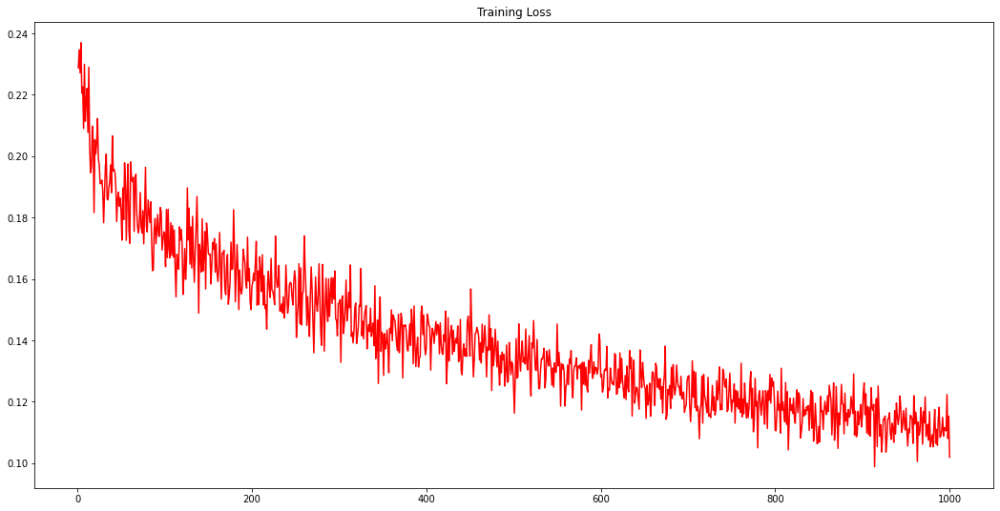

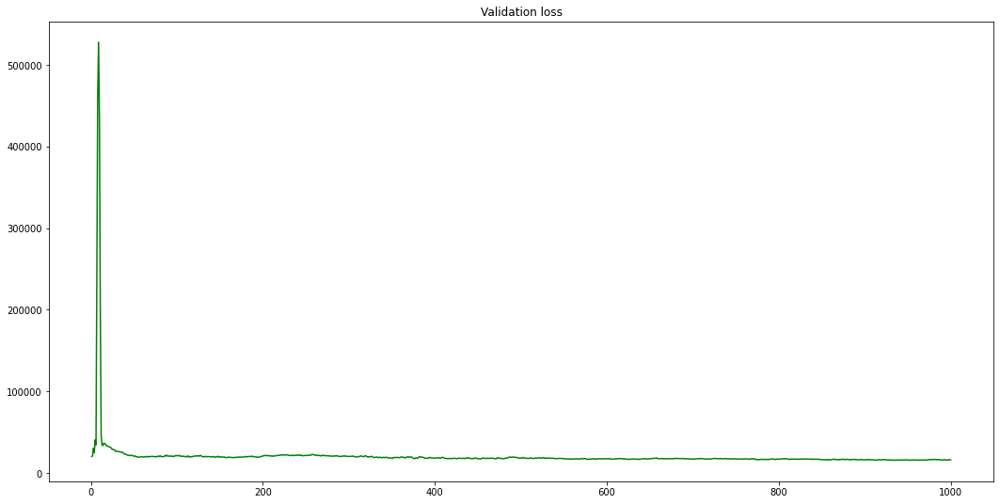

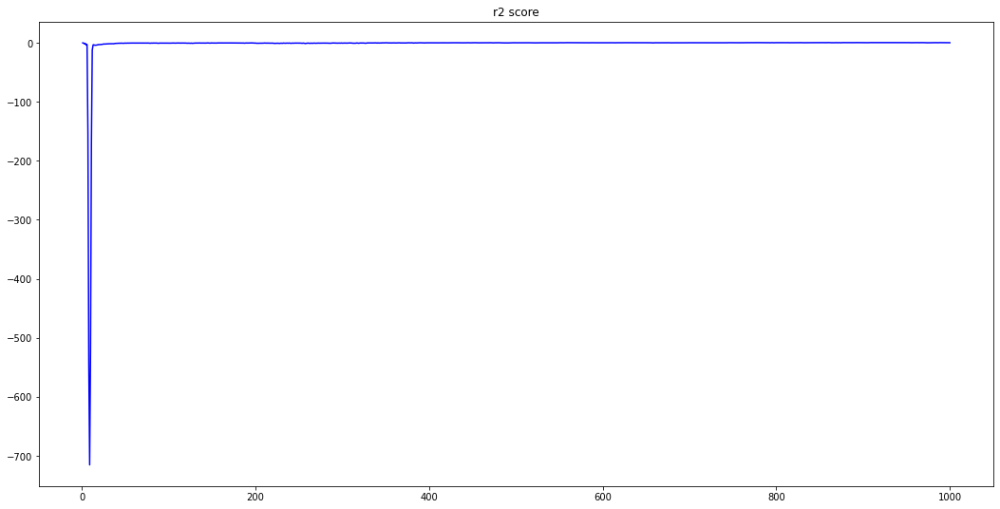

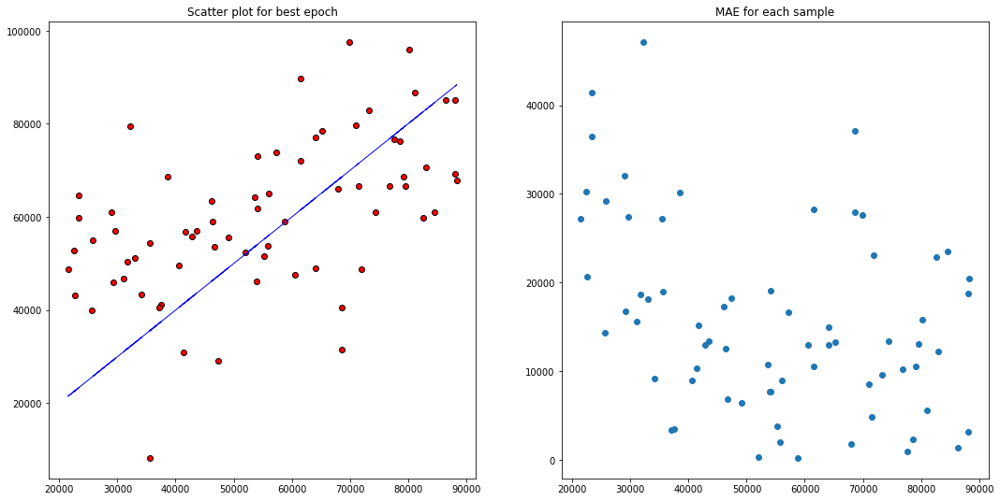

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=19))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=19))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=19))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=2))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=19))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=2))
        
        self.features.add_module('5_conv1d',nn.Conv1d(in_channels=256,out_channels=512,kernel_size=19))
        self.features.add_module('5_relu',nn.ReLU())
        self.features.add_module('5_batchnorm',nn.BatchNorm1d(512))
        self.features.add_module('5_maxpool',nn.MaxPool1d(kernel_size=2))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(512,64))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(64,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [26,26,26,26,26,26,26,26,26,26,26,12,12,10] # for 280 samples to train.
    k = 20000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st

    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.0000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        #print(z_x.shape)
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

using 800 features for modelling instead of 600

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1 with loss 0.2587 is -0.0022
loss in training dataset after epoch 1 is 15884.3976

 the validation loss for the epoch 2 with loss 0.2461 is 17637.0568

 the r2 score for the epoch 2 with loss 0.2461 is -0.0378
loss in training dataset after epoch 2 is 16759.0210

 the validation loss for the epoch 3 with loss 0.2220 is 23923.4779

 the r2 score for the epoch 3 with loss 0.2220 is -1.1165
loss in training dataset after epoch 3 is 26015.8424

 the validation loss for the epoch 4 with loss 0.2222 is 51584.0089

 the r2 score for the epoch 4 with loss 0.2222 is -6.6053
loss in training dataset after epoch 4 is 55009.3191

 the validation loss for the epoch 5 with loss 0.2231 is 82977.3632

 the r2 score for the epoch 5 with loss 0.2231 is -17.1048
loss in training dataset after epoch 5 is 86482.4111

 the validation loss for the epoch 6 with loss 0.2207 is 113469.1984

 the r2 score for the epoch 6 with loss 0

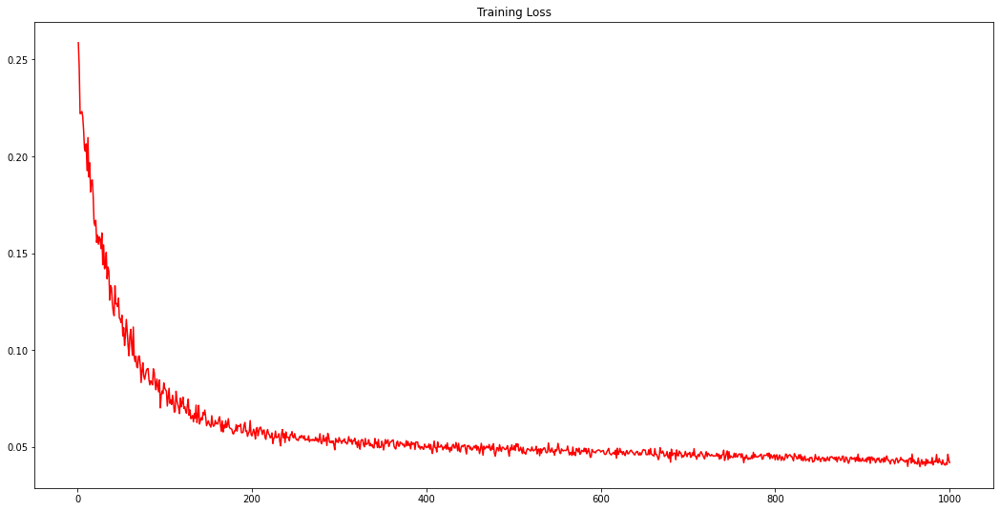

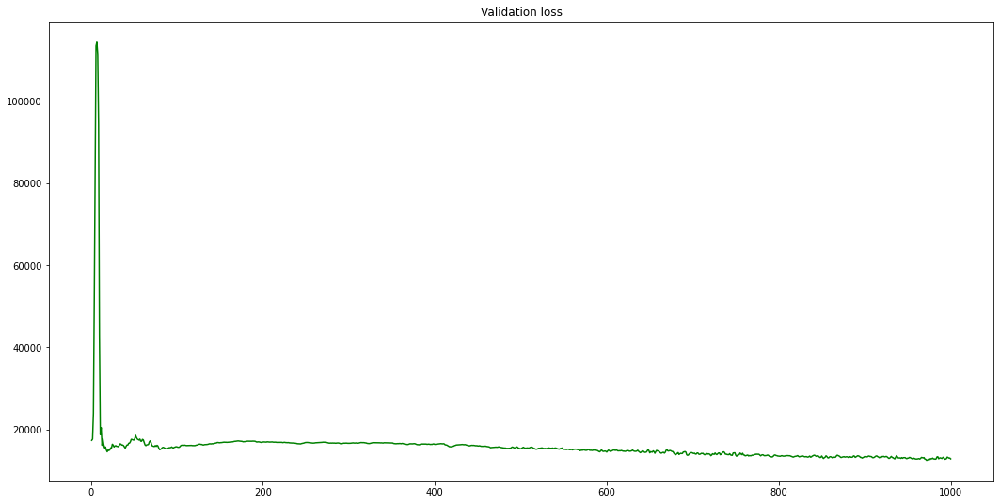

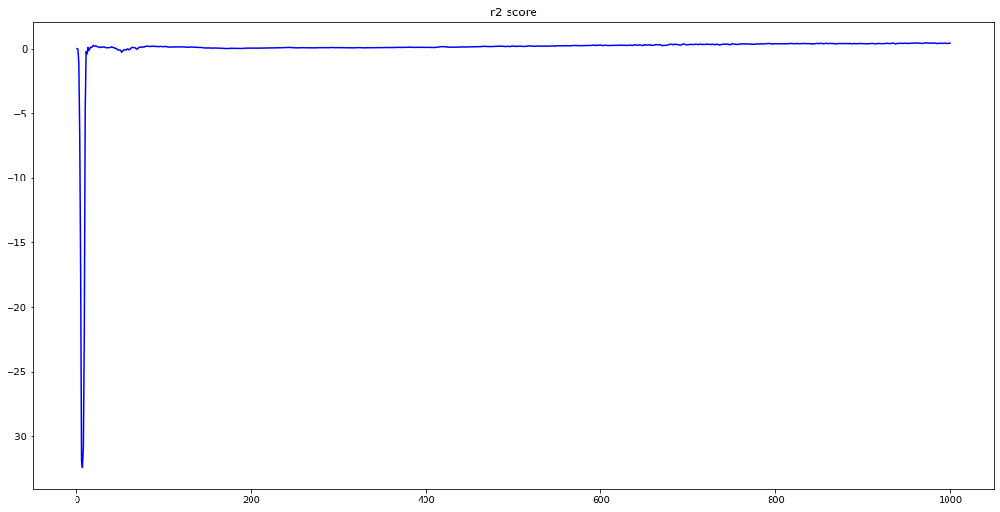

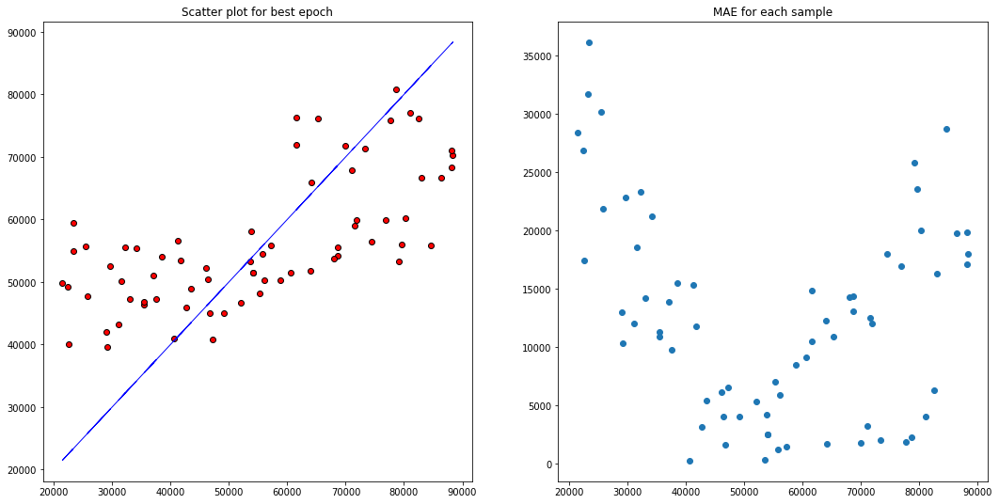

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,128))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(128,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    col = ['Sample ID','Device ID','ASTA','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [26,26,26,26,26,26,26,26,26,26,26,12,12,10] # for 280 samples to train.
    k = 20000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st

    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        #print(z_x.shape)
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

1DCNN on shorter range of capsaicin after 30k

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1 with loss 0.2533 is 0.0001
loss in training dataset after epoch 1 is 13655.8048

 the validation loss for the epoch 2 with loss 0.2445 is 14454.4568

 the r2 score for the epoch 2 with loss 0.2445 is -0.0275
loss in training dataset after epoch 2 is 14073.4429

 the validation loss for the epoch 3 with loss 0.2348 is 18039.2826

 the r2 score for the epoch 3 with loss 0.2348 is -0.7584
loss in training dataset after epoch 3 is 19084.0348

 the validation loss for the epoch 4 with loss 0.2316 is 34418.4698

 the r2 score for the epoch 4 with loss 0.2316 is -4.3050
loss in training dataset after epoch 4 is 36195.6164

 the validation loss for the epoch 5 with loss 0.2277 is 59324.9888

 the r2 score for the epoch 5 with loss 0.2277 is -12.7971
loss in training dataset after epoch 5 is 61160.5702

 the validation loss for the epoch 6 with loss 0.2317 is 87687.3622

 the r2 score for the epoch 6 with loss 0.2

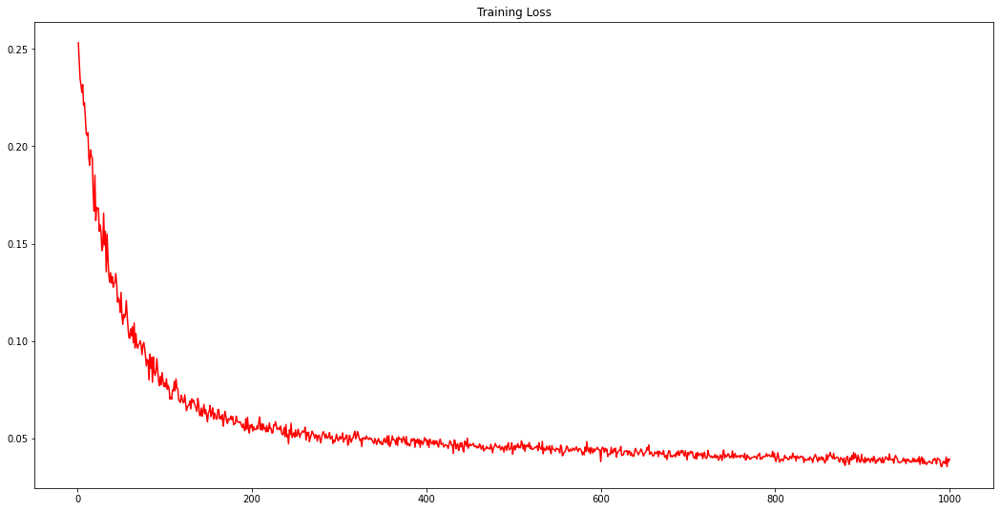

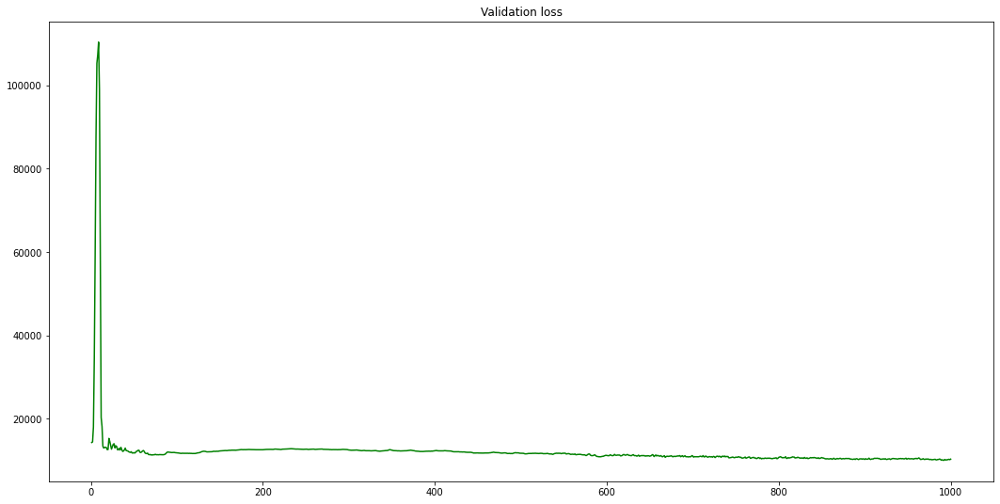

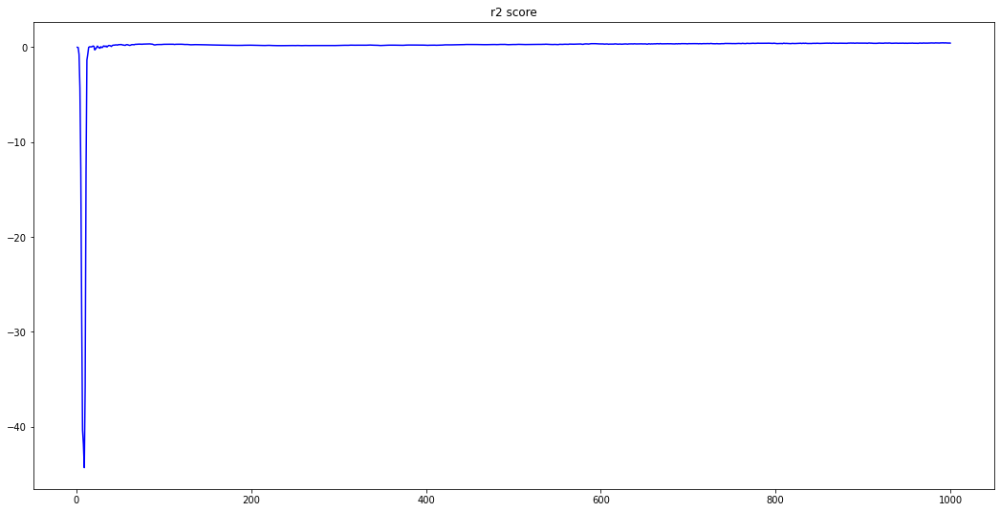

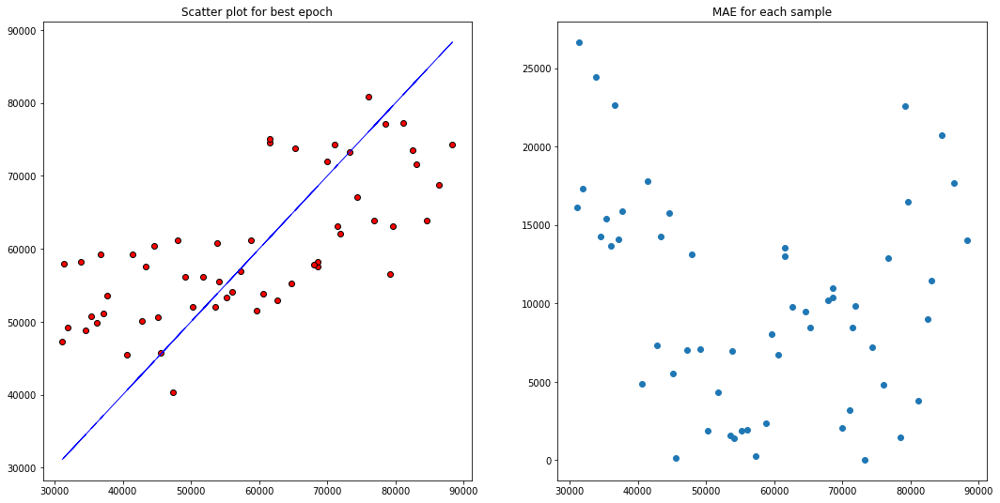

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,128))
        self.regress.add_module('ANN_Relu',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(128,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    col = ['Sample ID','Device ID','ASTA','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [28,28,28,28,28,28,28,26,26,14,14,12] #  samples to train.
    k = 30000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st

    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        #print(z_x.shape)
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

With more ANN Layer for fitting

Streaming output truncated to the last 5000 lines.

 the r2 score for the epoch 1001 with loss 0.0335 is 0.2360
loss in training dataset after epoch 1001 is 16529.5176

 the validation loss for the epoch 1002 with loss 0.0332 is 12333.8836

 the r2 score for the epoch 1002 with loss 0.0332 is 0.1442
loss in training dataset after epoch 1002 is 15917.4187

 the validation loss for the epoch 1003 with loss 0.0357 is 11919.9888

 the r2 score for the epoch 1003 with loss 0.0357 is 0.2116
loss in training dataset after epoch 1003 is 17789.9817

 the validation loss for the epoch 1004 with loss 0.0338 is 11408.7544

 the r2 score for the epoch 1004 with loss 0.0338 is 0.2753
loss in training dataset after epoch 1004 is 16122.5629

 the validation loss for the epoch 1005 with loss 0.0348 is 11077.7429

 the r2 score for the epoch 1005 with loss 0.0348 is 0.3171
loss in training dataset after epoch 1005 is 16965.4612

 the validation loss for the epoch 1006 with loss 0.0338 is 11032.9753

 th

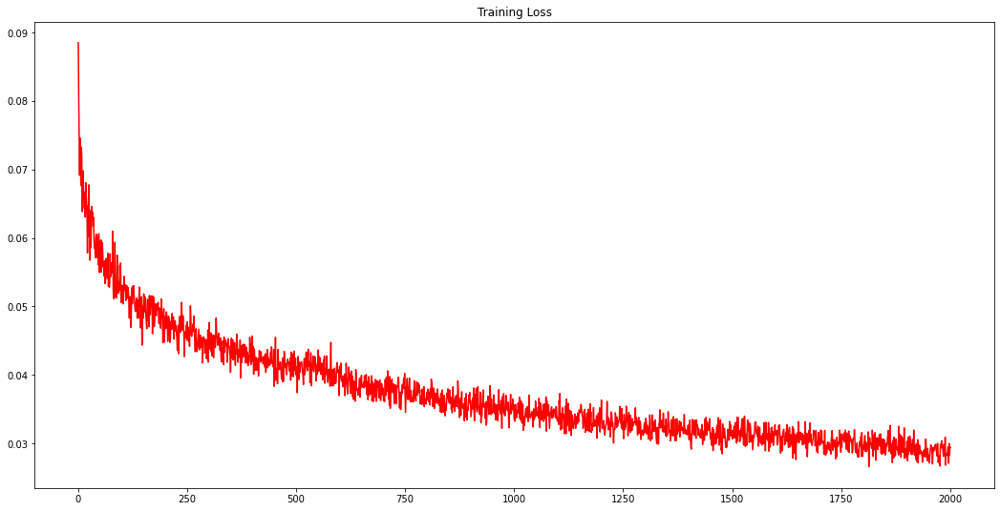

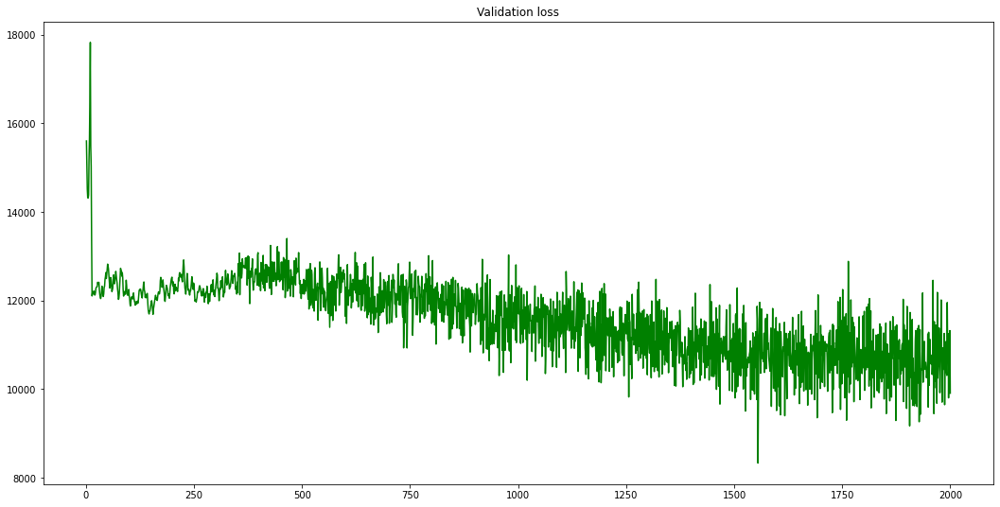

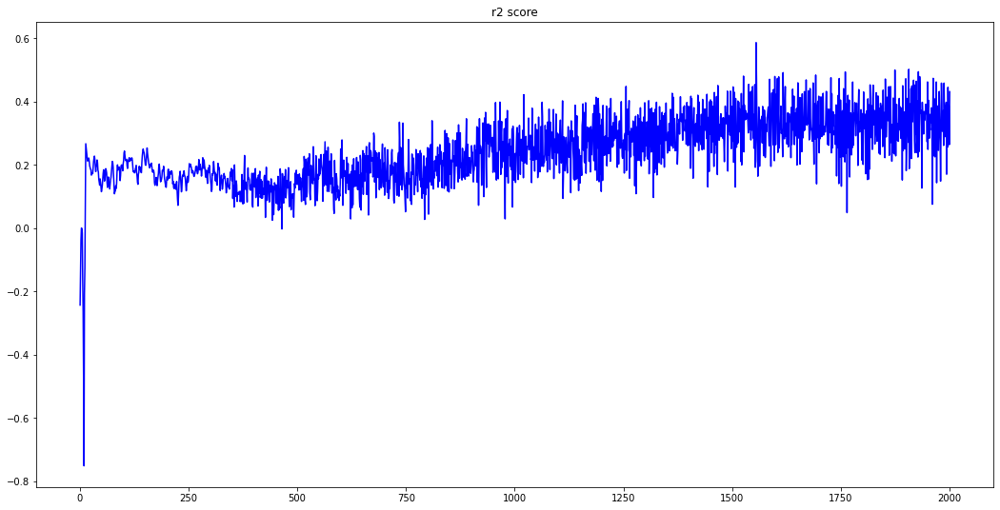

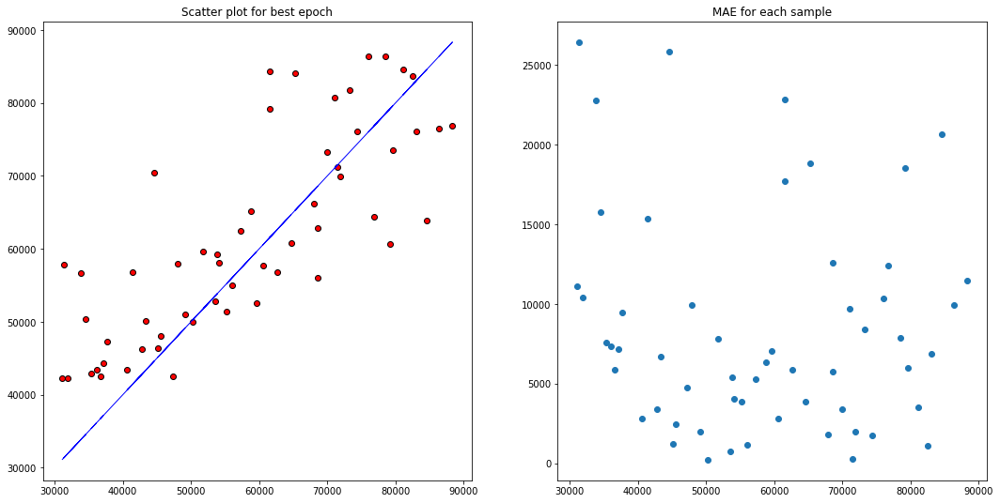

In [ ]:
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""

# the 1DCNN model on Asta for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('ANN_1',nn.Linear(1024,512))
        self.regress.add_module('ANN_Relu_1',nn.ReLU())
        self.regress.add_module('drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_2',nn.Linear(512,512))
        self.regress.add_module('ANN_Relu_2',nn.ReLU())
        self.regress.add_module('drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_3',nn.Linear(512,128))
        self.regress.add_module('ANN_Relu_3',nn.ReLU())
        self.regress.add_module('drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('ANN_4',nn.Linear(128,1))

    def forward(self,x):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        x_out = self.regress(x)
        return x_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Device ID','ASTA']
    col = ['Sample ID','Device ID','ASTA','800']
    d_asta = df.drop(columns=col)
    d_asta = d_asta.dropna(subset=['Cap'])
    X_train = []
    X_val = []
    Y_train = []
    Y_val = []
    l = [28,28,28,28,28,28,28,26,26,14,14,12] #  samples to train.
    k = 30000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*5000)+' & Cap<'+str(k+(i+1)*5000)
        data_asta_3 = d_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = 'Cap')))
        Y_train.append(np.array(data_asta_3_1['Cap']))
        X_val.append(np.array(data_asta_3_2.drop(columns = 'Cap')))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train = np.hstack(Y_train)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train.mean()
    st = Y_train.std() * 16
    Y_train_2 = (Y_train - mn)/st

    return X_train,Y_train,Y_train_2,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 2000
    model = D1CNN().to(device)
    model.to(torch.double)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,Y_train,y_train,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train = shuffle(x_train,y_train,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y = np.empty((l,b_size))
        j=0
        for i in range(0,y_train.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y[j] = y_train[i:i+b_size]
            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        #print(z_x.shape)
        for i in range(t):

            optimizer.zero_grad()
            t_x_dt = Variable(torch.from_numpy(z_x[i]),requires_grad = False).to(device)
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt.to(torch.double)
            t_yhat = model.forward(t_x_dt)
            t_y_org = Variable(torch.from_numpy(z_y[i]),requires_grad=False).to(device)
            t_y_org.to(torch.double)
            t_yhat = torch.squeeze(t_yhat)
            

            err_mae = loss(t_yhat,t_y_org)
            err_mae.backward()
            optimizer.step()
            t_loss += float(err_mae.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_org.detach()
            t_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        
        t_x_dt.detach()
        t_y_org.detach()
        t_yhat.detach()

        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)
            v_x_dt = Variable(torch.from_numpy(x_val),requires_grad = False).to(device)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt.to(torch.double)
            v_y_dt = Variable(torch.from_numpy(y_val),requires_grad = False).to(device)
            v_y_dt.to(torch.double)
            v_yhat = model.forward(v_x_dt)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            #v_yhat = torch.exp(v_yhat)
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = Variable(torch.from_numpy(x_train),requires_grad = False).to(device)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt.to(torch.double)
            v_yt_dt = Variable(torch.from_numpy(Y_train),requires_grad = False).to(device)
            v_yt_dt.to(torch.double)
            vt_yhat = model.forward(v_xt_dt)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()
            print('loss in training dataset after epoch %d is %.4f'%(e+1,vt_loss))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_25_50_L1_adam_11_2{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()

    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    #fig_3 = plt.figure(figsize = (18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = y_val
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili__cap_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

In capsaicin tryin cleaning with mahanlobis distance and then applying the above model for training and testing and more deep ANN model. Removed outliers using Principal Component analysis

## **The best model for Capsaicin**

Streaming output truncated to the last 5000 lines.

 the training loss for epoch  1168 is 0.0296

 the validation loss for the epoch 1168 with loss 0.0296 is 8080.9927

 the r2 score for the epoch 1168 with loss 0.0296 is 0.5854

 the training loss for epoch  1169 is 0.0303

 the validation loss for the epoch 1169 with loss 0.0303 is 7915.1812

 the r2 score for the epoch 1169 with loss 0.0303 is 0.5997

 the training loss for epoch  1170 is 0.0313

 the validation loss for the epoch 1170 with loss 0.0313 is 7236.2197

 the r2 score for the epoch 1170 with loss 0.0313 is 0.6682

 the training loss for epoch  1171 is 0.0287

 the validation loss for the epoch 1171 with loss 0.0287 is 7885.4028

 the r2 score for the epoch 1171 with loss 0.0287 is 0.5926

 the training loss for epoch  1172 is 0.0290

 the validation loss for the epoch 1172 with loss 0.0290 is 7601.7866

 the r2 score for the epoch 1172 with loss 0.0290 is 0.6257

 the training loss for epoch  1173 is 0.0311

 the validat

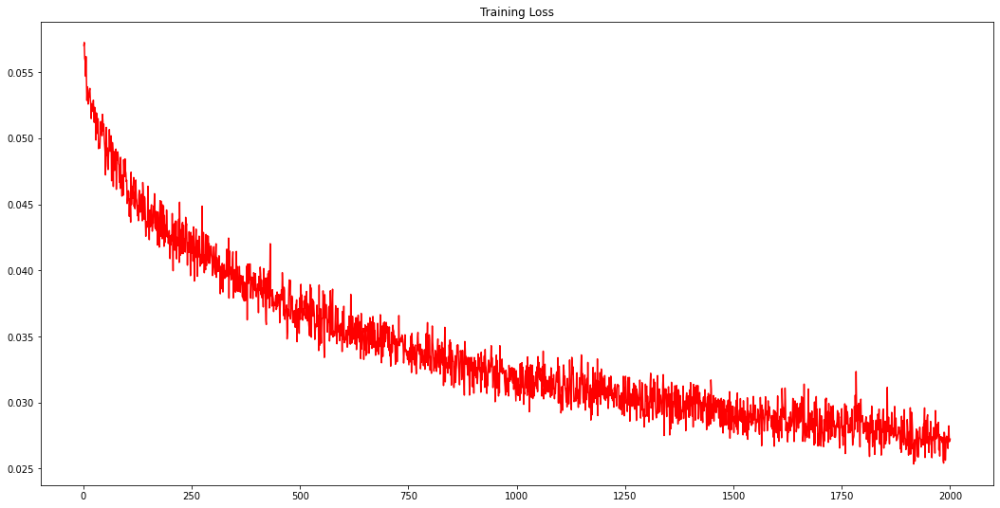

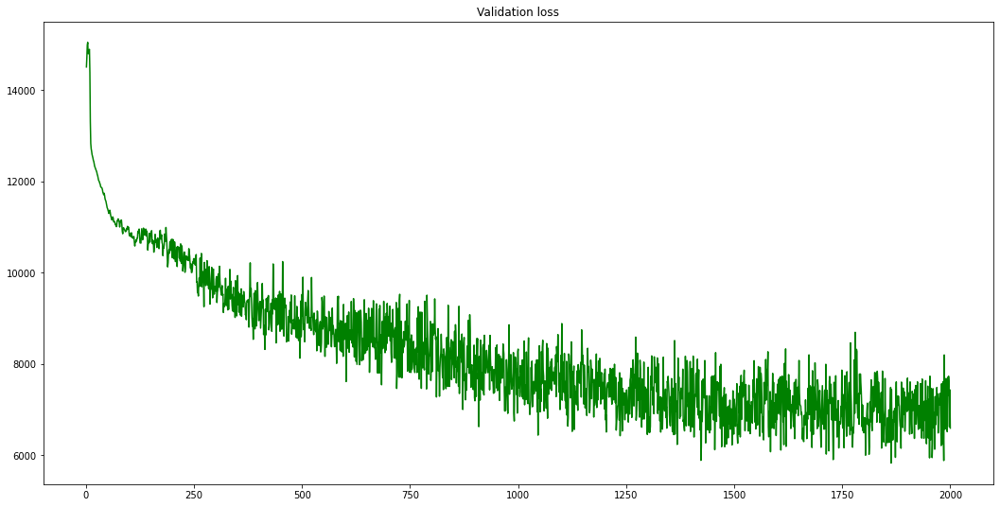

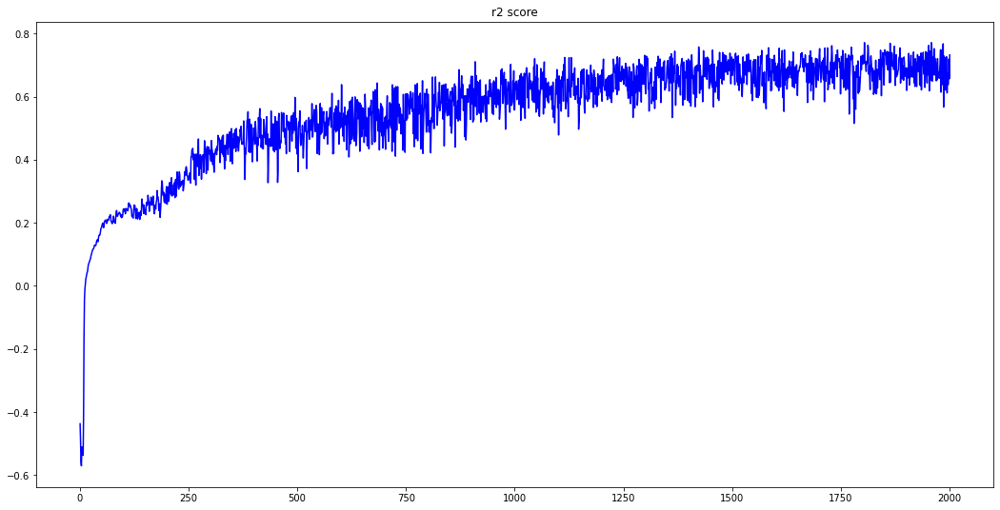

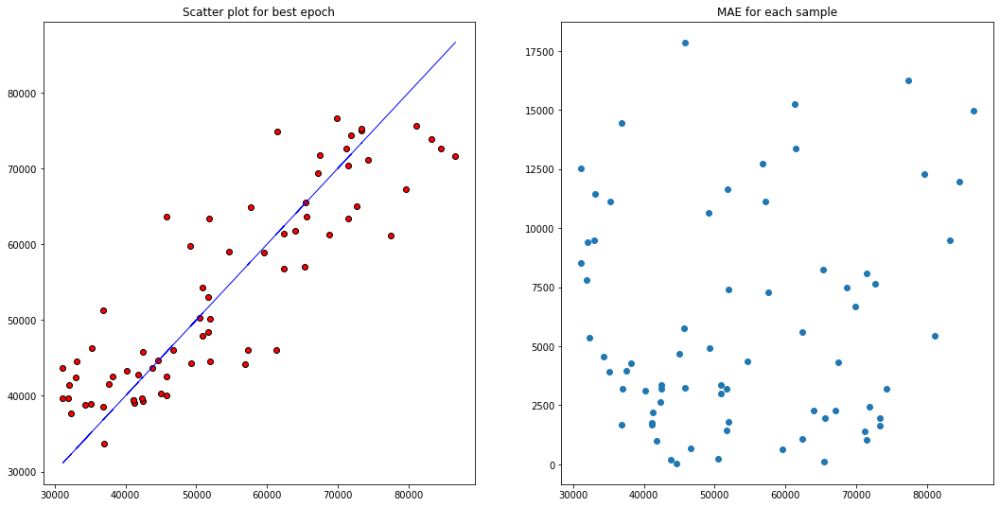

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Cap for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','ASTA','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['Cap'])
    data_asta = data_asta[data_asta['Cap']>=30_000]
    data_asta = data_asta[data_asta['Cap']<87_000]

    x_t = np.array(data_asta.drop(columns = ['Device ID','Cap']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    #data_asta['mahan'] = m
    #data_asta['p'] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance
    
    data_asta['PC1'] = T[:,0]
    data_asta_1 = data_asta.query('PC1>60')
    data_asta = data_asta.drop(data_asta_1.index)

    #data_asta_1 = data_asta.query('p<.001')
    #data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [27,27,27,27,27,27,27,27,24,12,28,16,16,16,16,10,10,10,10]
    k = 30_000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*3_000)+' & Cap<'+str(k+(i+1)*3_000)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['Cap','Device ID','PC1'])))
        Y_train_1.append(np.array(data_asta_3_1['Cap']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['Cap','Device ID','PC1'])))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train_1.mean()
    st = Y_train_1.std() * 16
    Y_train_3 = (Y_train_1 - mn)/st


    return X_train,Y_train_3,Y_train_2,Y_train_1,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 2000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,y_train_3,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        

        print("\n the training loss for epoch % d is %.4f"%(e+1,t_let))
        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_3)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_30k_87k_3k_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Above Model wihtout data aug and lds with no dropout for overfitting

Streaming output truncated to the last 5000 lines.

 the training loss for epoch  1168 is 0.0099

 the validation loss for the epoch 1168 with loss 0.0099 is 6408.6709

 the r2 score for the epoch 1168 with loss 0.0099 is 0.7183

 the training loss for epoch  1169 is 0.0104

 the validation loss for the epoch 1169 with loss 0.0104 is 7279.6465

 the r2 score for the epoch 1169 with loss 0.0104 is 0.6513

 the training loss for epoch  1170 is 0.0098

 the validation loss for the epoch 1170 with loss 0.0098 is 7092.8750

 the r2 score for the epoch 1170 with loss 0.0098 is 0.6665

 the training loss for epoch  1171 is 0.0101

 the validation loss for the epoch 1171 with loss 0.0101 is 6049.0942

 the r2 score for the epoch 1171 with loss 0.0101 is 0.7421

 the training loss for epoch  1172 is 0.0121

 the validation loss for the epoch 1172 with loss 0.0121 is 6104.9658

 the r2 score for the epoch 1172 with loss 0.0121 is 0.7359

 the training loss for epoch  1173 is 0.0106

 the validat

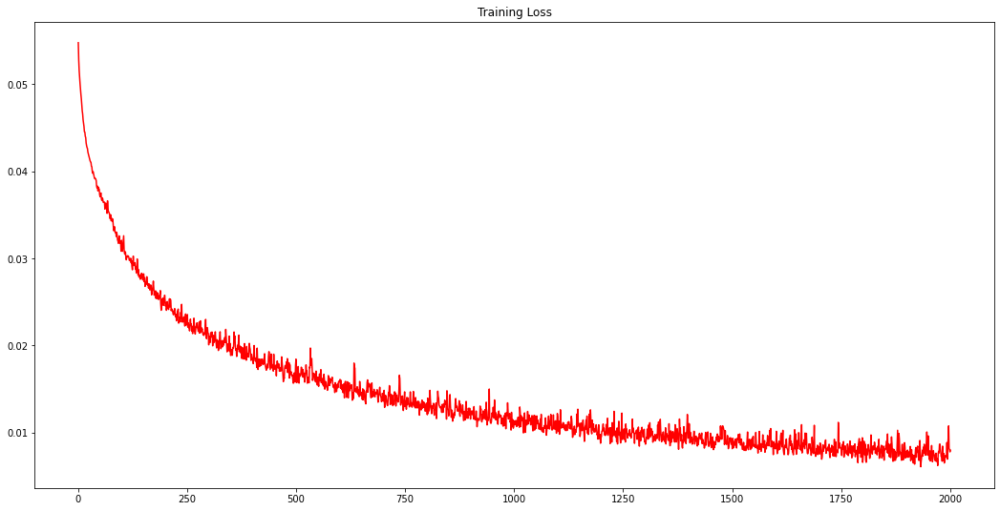

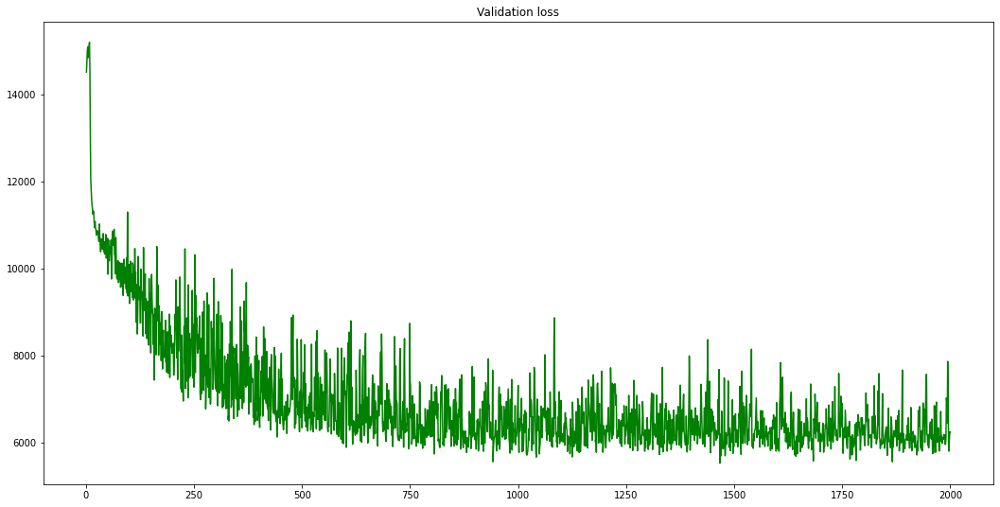

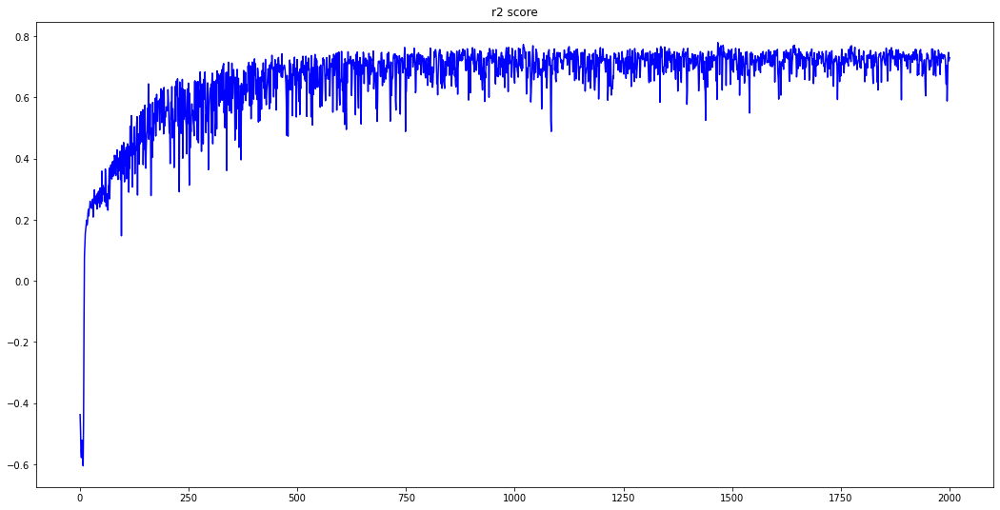

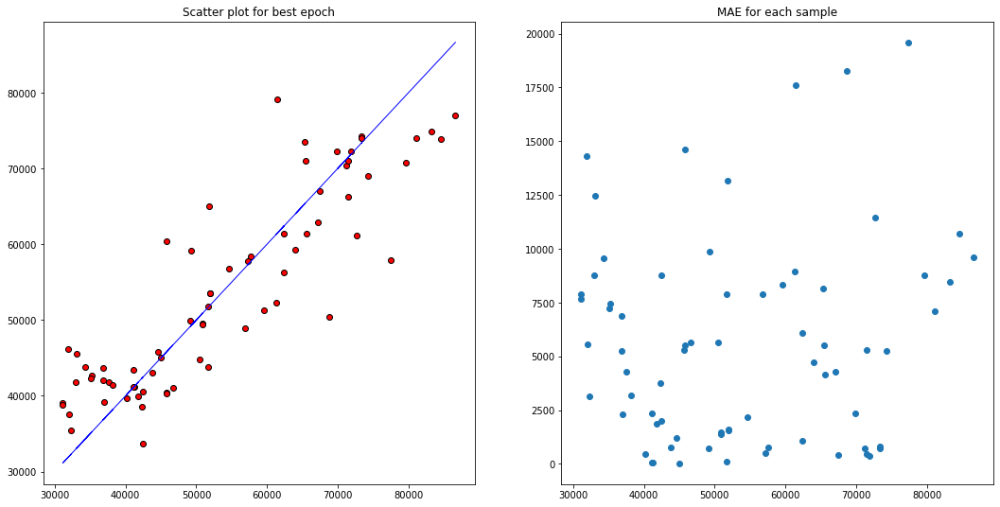

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Cap for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        #self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        #self.regress.add_module('an_drop_1',nn.Dropout(p=0.4))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        #self.regress.add_module('an_drop_2',nn.Dropout(p=0.4))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        #self.regress.add_module('an_drop_3',nn.Dropout(p=0.4))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        #self.regress.add_module('an_drop_4',nn.Dropout(p=0.4))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        #self.regress.add_module('an_drop_5',nn.Dropout(p=0.4))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        #self.rev.add_module('drop_2',nn.Dropout(p=0.4))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','ASTA','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['Cap'])
    data_asta = data_asta[data_asta['Cap']>=30_000]
    data_asta = data_asta[data_asta['Cap']<87_000]

    x_t = np.array(data_asta.drop(columns = ['Device ID','Cap']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    #data_asta['mahan'] = m
    #data_asta['p'] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance
    
    data_asta['PC1'] = T[:,0]
    data_asta_1 = data_asta.query('PC1>60')
    data_asta = data_asta.drop(data_asta_1.index)

    #data_asta_1 = data_asta.query('p<.001')
    #data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [27,27,27,27,27,27,27,27,24,12,28,16,16,16,16,10,10,10,10]
    k = 30_000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*3_000)+' & Cap<'+str(k+(i+1)*3_000)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<5):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=5,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['Cap','Device ID','PC1'])))
        Y_train_1.append(np.array(data_asta_3_1['Cap']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['Cap','Device ID','PC1'])))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train_1.mean()
    st = Y_train_1.std() * 16
    Y_train_3 = (Y_train_1 - mn)/st


    return X_train,Y_train_3,Y_train_2,Y_train_1,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 2000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = nn.L1Loss()
    loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,y_train_3,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        

        print("\n the training loss for epoch % d is %.4f"%(e+1,t_let))
        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_3)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_30k_87k_3k_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

Above code but using LDS on it for compensating on imballanced Regression

Streaming output truncated to the last 5000 lines.

 the training loss for epoch  1168 is 0.0094

 the validation loss for the epoch 1168 with loss 0.0094 is 9313.5908

 the r2 score for the epoch 1168 with loss 0.0094 is 0.5192

 the training loss for epoch  1169 is 0.0094

 the validation loss for the epoch 1169 with loss 0.0094 is 8748.2383

 the r2 score for the epoch 1169 with loss 0.0094 is 0.5689

 the training loss for epoch  1170 is 0.0082

 the validation loss for the epoch 1170 with loss 0.0082 is 8236.8350

 the r2 score for the epoch 1170 with loss 0.0082 is 0.6096

 the training loss for epoch  1171 is 0.0079

 the validation loss for the epoch 1171 with loss 0.0079 is 8060.3599

 the r2 score for the epoch 1171 with loss 0.0079 is 0.6345

 the training loss for epoch  1172 is 0.0093

 the validation loss for the epoch 1172 with loss 0.0093 is 6898.5923

 the r2 score for the epoch 1172 with loss 0.0093 is 0.6938

 the training loss for epoch  1173 is 0.0085

 the validat

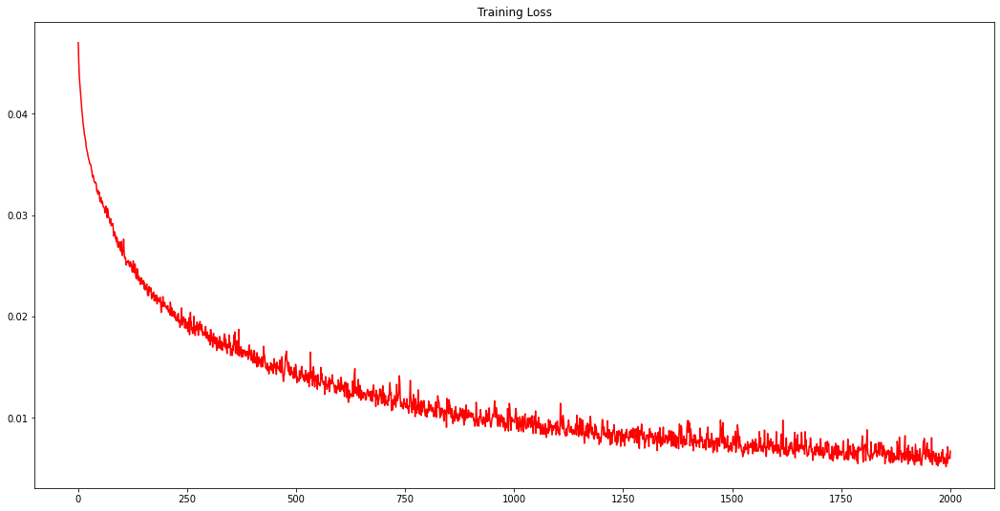

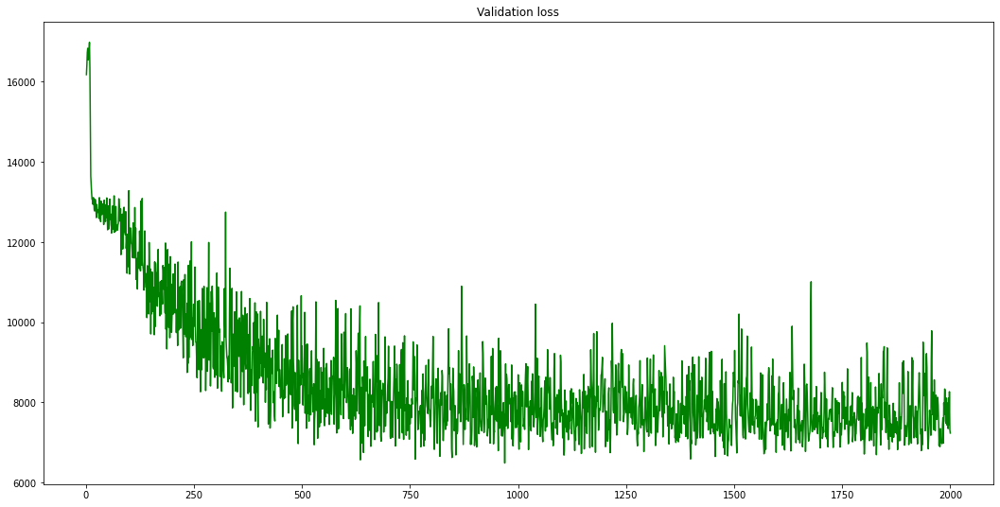

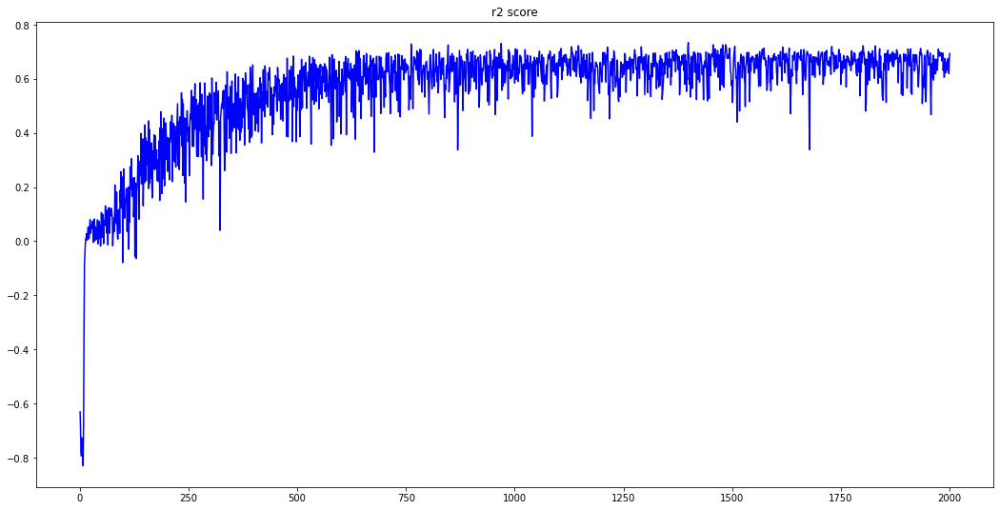

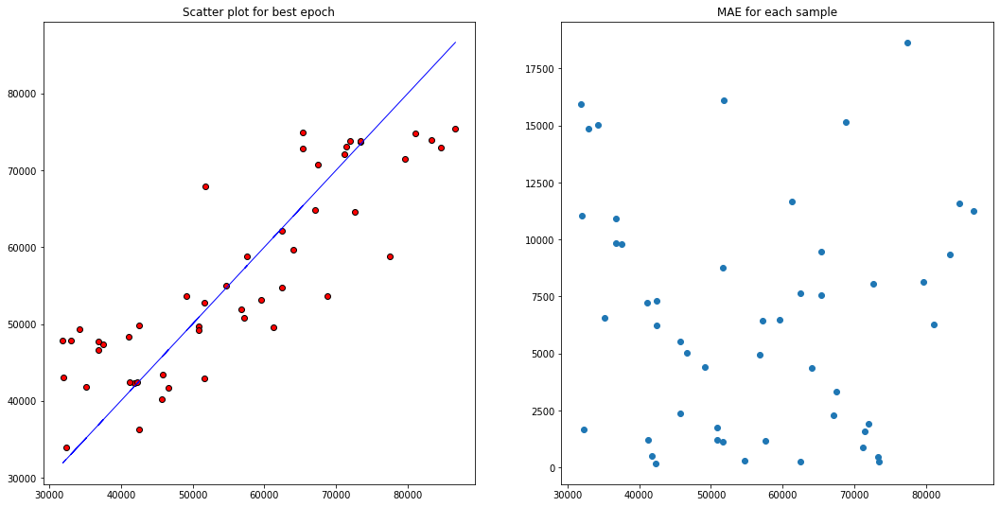

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Cap for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        #self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        #self.regress.add_module('an_drop_1',nn.Dropout(p=0.4))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        #self.regress.add_module('an_drop_2',nn.Dropout(p=0.4))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        #self.regress.add_module('an_drop_3',nn.Dropout(p=0.4))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        #self.regress.add_module('an_drop_4',nn.Dropout(p=0.4))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        #self.regress.add_module('an_drop_5',nn.Dropout(p=0.4))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        #self.rev.add_module('drop_2',nn.Dropout(p=0.4))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian', 3, 1)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    smoothed_value[0] = smoothed_value [1]
    smoothed_value[-1] = smoothed_value[-2]
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights


#to divide data into test train and valid
def data_1D(f):
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','ASTA','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['Cap'])
    data_asta = data_asta[data_asta['Cap']>=30_000]
    data_asta = data_asta[data_asta['Cap']<87_000]

    x_t = np.array(data_asta.drop(columns = ['Device ID','Cap']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    #data_asta['mahan'] = m
    #data_asta['p'] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance
    
    data_asta['PC1'] = T[:,0]
    data_asta_1 = data_asta.query('PC1>60')
    data_asta = data_asta.drop(data_asta_1.index)

    #data_asta_1 = data_asta.query('p<.001')
    #data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []
    l = [27,27,27,27,27,27,27,27,24,12,28,16,16,16,16,10,10,10,10]
    k = 30_000
    for i in range(len(l)):
        qr = 'Cap>='+str(k+i*3_000)+' & Cap<'+str(k+(i+1)*3_000)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_1 = data_asta_3.sample(n=l[i],random_state = sed)
        data_asta_3_2 = data_asta_3.drop(data_asta_3_1.index)

        if (len(data_asta_3_2.index)<3):
            data_asta_3_2 = data_asta_3_2.sample(n=len(data_asta_3_2.index),random_state = sed)
        else:
            data_asta_3_2 = data_asta_3_2.sample(n=3,random_state = sed)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['Cap','Device ID','PC1'])))
        Y_train_1.append(np.array(data_asta_3_1['Cap']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['Cap','Device ID','PC1'])))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train_1.mean()
    st = Y_train_1.std() * 16
    Y_train_3 = (Y_train_1 - mn)/st
    


    return X_train,Y_train_3,Y_train_2,Y_train_1,X_val,Y_val,mn,st,get_weights(l)

def weighted_l1_loss(inputs, targets, weights=None):
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 2000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    #loss.to(device=device)
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,y_train_3,x_val,y_val,mn,st,wt = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)


            weights = torch.tensor([wt[int((x-30_000)//3_000)] for x in z_y_1[i] ]).to(device=device)

            err_reg = loss(t_yhat,t_y_1_org,weights)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        

        print("\n the training loss for epoch % d is %.4f"%(e+1,t_let))
        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_3)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_30k_87k_3k_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

## The best Cap model with data aug and LDS

Streaming output truncated to the last 5000 lines.

 the training loss for epoch  168 is 0.0018

 the validation loss for the epoch 168 with loss 0.0018 is 55297.6328

 the r2 score for the epoch 168 with loss 0.0018 is -13.4907

 the training loss for epoch  169 is 0.0018

 the validation loss for the epoch 169 with loss 0.0018 is 60295.8477

 the r2 score for the epoch 169 with loss 0.0018 is -15.1656

 the training loss for epoch  170 is 0.0018

 the validation loss for the epoch 170 with loss 0.0018 is 37858.9922

 the r2 score for the epoch 170 with loss 0.0018 is -6.0616

 the training loss for epoch  171 is 0.0018

 the validation loss for the epoch 171 with loss 0.0018 is 47715.2266

 the r2 score for the epoch 171 with loss 0.0018 is -10.2633

 the training loss for epoch  172 is 0.0018

 the validation loss for the epoch 172 with loss 0.0018 is 59756.6992

 the r2 score for the epoch 172 with loss 0.0018 is -14.8833

 the training loss for epoch  173 is 0.0018

 the validatio

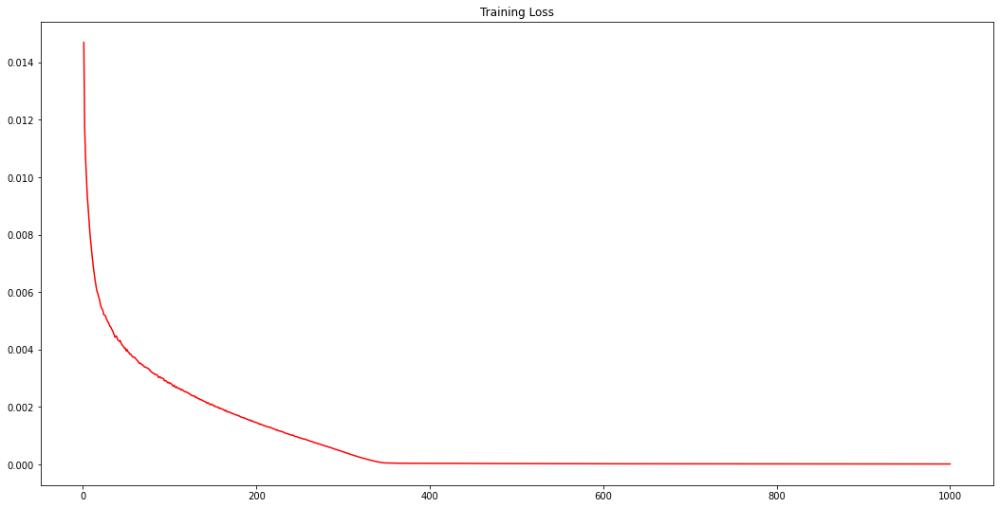

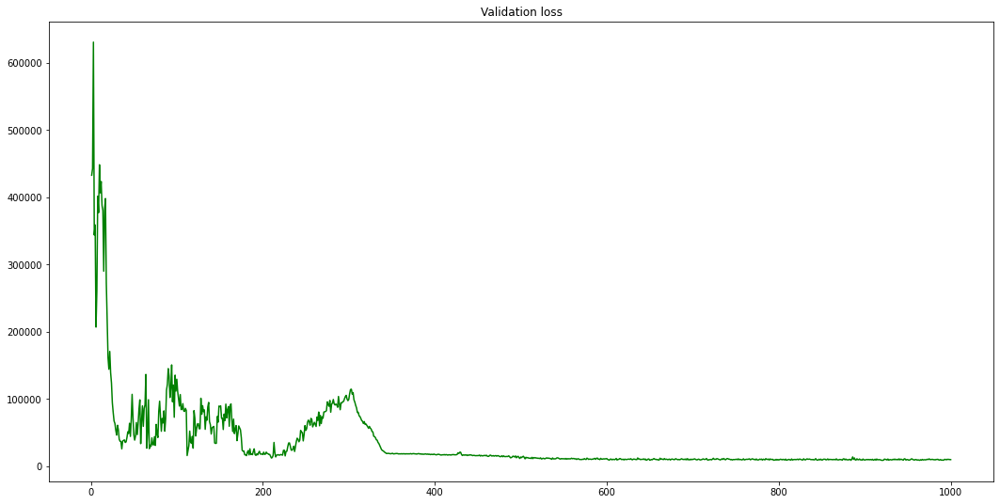

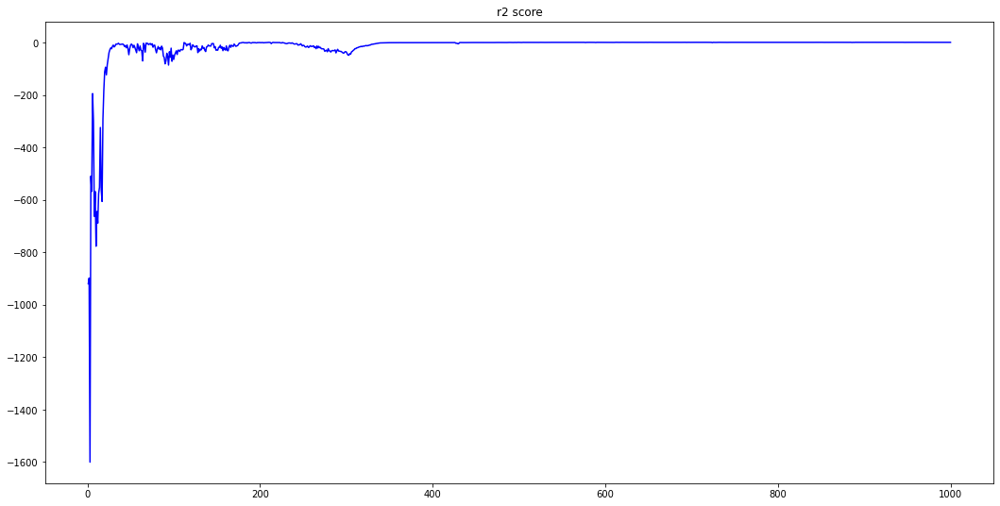

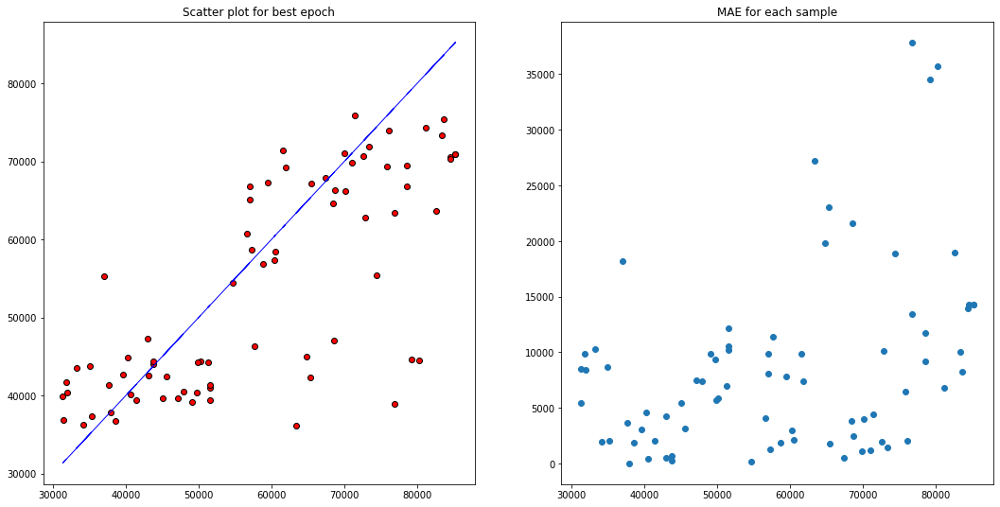

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys
import copy

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Cap for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian',3, 1)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

def weighted_l1_loss(inputs, targets, weights=None):
    '''You need to correct this'''
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss

def dataaugment(x, betashift = 0.05, slopeshift = 0.05,multishift = 0.05):
    #Shift of baseline
    #calculate arrays
    beta = np.random.random(size=(x.shape[0],1))*2*betashift-betashift
    slope = np.random.random(size=(x.shape[0],1))*2*slopeshift-slopeshift + 1
    #Calculate relative position
    axis = np.array(range(x.shape[1]))/float(x.shape[1])
    #Calculate offset to be added
    offset = slope*(axis) + beta - axis - slope/2. + 0.5

    #Multiplicative
    multi = np.random.random(size=(x.shape[0],1))*2*multishift-multishift + 1

    x = multi*x + offset

    return x

#to divide data into test train and valid
def data_1D(f):
    
    r1 = 30_000
    r2 = 87_000
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','ASTA','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['Cap'])
    data_asta = data_asta[data_asta['Cap']>=r1]
    data_asta = data_asta[data_asta['Cap']<r2]

    x_t = np.array(data_asta.drop(columns = ['Device ID','Cap']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    #data_asta['mahan'] = m
    #data_asta['p'] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance
    
    data_asta['PC1'] = T[:,0]
    data_asta_1 = data_asta.query('PC1>60')
    data_asta = data_asta.drop(data_asta_1.index)

    #data_asta_1 = data_asta.query('p<.001')
    #data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []


    y = np.zeros(int((r2-r1)/3_000),dtype=np.int32)
    labels = data_asta['Cap'].values
    for label in labels:
        y[int((label-r1)/3_000)]+=1

    
    for i in range(len(y)):
        qr = 'Cap>='+str(r1+i*3_000)+' & Cap<'+str(r1+(i+1)*3_000)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_2 = data_asta_3.sample(n=4,random_state = sed)
        data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['Cap','Device ID','PC1'])))
        Y_train_1.append(np.array(data_asta_3_1['Cap']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['Cap','Device ID','PC1'])))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train_aug = np.repeat(X_train,repeats = 24, axis = 0)
    shift = .1*np.std(X_train)
    X_train_aug = dataaugment(X_train_aug,betashift = shift,slopeshift = shift/2,multishift = shift)
    X_train = np.concatenate((X_train,X_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train_1,repeats = 24 ,axis = 0)
    Y_train_1 = np.concatenate((Y_train_1,Y_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train_2,repeats = 24 ,axis = 0)
    Y_train_2 = np.concatenate((Y_train_2,Y_train_aug),axis = 0)

    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train_1 = Y_train_1[idx]
    Y_train_2 = Y_train_2[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train_1.mean()
    st = Y_train_1.std() * 16_000
    Y_train_3 = (Y_train_1 - mn)/st


    return X_train,Y_train_3,Y_train_2,Y_train_1,X_val,Y_val,mn,st,get_weights((y-4)*25)


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1_000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,y_train_3,x_val,y_val,mn,st,wts = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            weights = torch.tensor([wts[int((x-30_000)/3_000)] for x in z_y_1[i] ]).to(device=device)

            err_reg = loss(t_yhat,t_y_1_org,weights)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        

        print("\n the training loss for epoch % d is %.4f"%(e+1,t_let))
        model.train(mode=False)

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            v_loss = loss(v_yhat,v_y_dt).item()
            print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))
            R2_L.append(r2_score)

            #to test for train dataset on this epoch
            v_xt_dt = torch.from_numpy(x_train)
            v_xt_dt = torch.unsqueeze(v_xt_dt,dim=1)
            v_xt_dt = Variable(v_xt_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_yt_dt = torch.from_numpy(y_train_3)
            v_yt_dt = Variable(v_yt_dt,requires_grad = False).to(device,dtype = torch.float32)
            vt_yhat,_ = model.forward(v_xt_dt,1)
            vt_yhat = torch.squeeze(vt_yhat)
            vt_yhat = vt_yhat*st + mn
            #v_yhat = torch.exp(v_yhat)
            vt_loss = loss(vt_yhat,v_yt_dt).item()

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_30k_87k_3k_L1_adam_11_2_rev{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1
                b_xhat = vt_yhat.to('cpu')
                b_yt_dt = v_yt_dt.to('cpu')

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()

            v_xt_dt.detach()
            v_yt_dt.detach()
            vt_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

    y_data = pd.DataFrame()
    y_data['actual'] = b_y_t_1
    y_data['predcted'] = b_yhat
    y_data.to_csv('chili_val_actual_pred.csv')

    xx_data = pd.DataFrame()
    xx_data['actual'] = b_yt_dt
    xx_data['predcted'] = b_xhat
    xx_data.to_csv('chili_cap_train_actual_pred.csv')


if __name__ == '__main__':
    run()

### Without LDS but with DATA AUG

In [ ]:
 # the regression with model with data preprocessing on range 40-120 with L1 loss
import numpy as np
import pandas as pd
import random
import torch
import sys
from torch import nn
from torch import optim
from torch.autograd import Variable
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from datetime import datetime
import matplotlib.pyplot as plt
import sklearn.metrics
from google.colab import files
import io
from scipy import signal as sg
from scipy.signal import savgol_filter
from torch.autograd import Function
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance, MinCovDet
from scipy.ndimage import convolve1d
from scipy.signal.windows import triang
from scipy.ndimage import gaussian_filter1d
import torch.nn.functional as F
import sys
import copy

# pynvml import *

b_size = 32 #batch size

"""def reset_weights(m):
    for layer in m.children():
        if hasattr(layer,'reset_parameters'):
            print(f'resent trainable parameters of layer = {layer}')
            layer.reset_parameters()"""


class Rev_grad(Function):
    @staticmethod
    def forward(ctx, x, alpha):
        ctx.alpha = alpha
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):  # pragma: no cover
        
        output = grad_output.neg() * ctx.alpha
        return output, None


# the 1DCNN model on Cap for regression with added ANN layer and 0.00001 learning rate and with SNV preprocessing with Huberloss and adam optimizer with changed window length =11, polyorder = 2
class D1CNN(nn.Module):
    def __init__(self):
        super(D1CNN,self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('1_conv1d',nn.Conv1d(in_channels=1,out_channels=32,kernel_size=21))
        self.features.add_module('1_relu',nn.ReLU())            
        self.features.add_module('1_batchnorm',nn.BatchNorm1d(32))
        self.features.add_module('1_maxpool',nn.MaxPool1d(kernel_size=2))
    
        self.features.add_module('2_conv1d',nn.Conv1d(in_channels=32,out_channels=64,kernel_size=21))
        self.features.add_module('2_relu',nn.ReLU())
        self.features.add_module('2_batchnorm',nn.BatchNorm1d(64))
        self.features.add_module('2_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('3_conv1d',nn.Conv1d(in_channels=64,out_channels=128,kernel_size=21))
        self.features.add_module('3_relu',nn.ReLU())
        self.features.add_module('3_batchnorm',nn.BatchNorm1d(128))
        self.features.add_module('3_maxpool',nn.MaxPool1d(kernel_size=3))

        self.features.add_module('4_conv1d',nn.Conv1d(in_channels=128,out_channels=256,kernel_size=21))
        self.features.add_module('4_relu',nn.ReLU())
        self.features.add_module('4_batchnorm',nn.BatchNorm1d(256))
        self.features.add_module('4_maxpool',nn.MaxPool1d(kernel_size=3))
        
        self.features.add_module('drop_1',nn.Dropout(p=0.4))
    
        self.regress = nn.Sequential()
        self.regress.add_module('an_1',nn.Linear(1024,512))
        self.regress.add_module('an_Relu_1',nn.ReLU())
        self.regress.add_module('an_drop_1',nn.Dropout(p=0.2))
        self.regress.add_module('an_2',nn.Linear(512,512))
        self.regress.add_module('an_Relu_2',nn.ReLU())
        self.regress.add_module('an_drop_2',nn.Dropout(p=0.2))
        self.regress.add_module('an_3',nn.Linear(512,128))
        self.regress.add_module('an_Relu_3',nn.ReLU())
        self.regress.add_module('an_drop_3',nn.Dropout(p=0.2))
        self.regress.add_module('an_4',nn.Linear(128,128))
        self.regress.add_module('an_Relu_4',nn.ReLU())
        self.regress.add_module('an_drop_4',nn.Dropout(p=0.2))
        self.regress.add_module('an_5',nn.Linear(128,64))
        self.regress.add_module('an_Relu_5',nn.ReLU())
        self.regress.add_module('an_drop_5',nn.Dropout(p=0.2))
        self.regress.add_module('an_6',nn.Linear(64,1))

        self.rev = nn.Sequential()
        self.rev.add_module('ann_1',nn.Linear(1024,128))
        self.rev.add_module('ann_relu',nn.ReLU())
        self.rev.add_module('drop_2',nn.Dropout(p=0.2))
        self.rev.add_module('ann_2',nn.Linear(128,2))

    def forward(self,x,alpha):
        x = self.features(x)
        x = torch.flatten(x,start_dim=1)
        rev_fea = Rev_grad.apply(x,alpha)
        x_out = self.regress(x)
        d_out = self.rev(rev_fea)
        return x_out, d_out

# preprocessing functions
def moving_smoothing(input_array, window_length):

    m_rows = len(range(window_length, input_array.shape[1] - window_length))
    m_cols = 2*window_length
    matrix = np.zeros((m_rows,m_cols),dtype=int)
    for j in range(0, len(matrix)):
        k = j+1
        matrix[j] = [x for x in range(k,k+2*window_length)]
    #Smoothing spectra using matrix operations:
    n_cols = m_rows
    newspectra = np.zeros((len(input_array),n_cols))
    for i in range(len(matrix)):
        newspectra[:,i] = np.mean(input_array[: ,matrix[i]],axis=1)
    #Add front and end tails (not smoothed):
    #new_spectra = np.asarray(newspectra)
    fronttail = newspectra[:,:1]
    endtail = newspectra[:,-1:]
    for k in range(1,window_length):
        fronttail=np.append(fronttail,newspectra[:,:1], axis=1)
        endtail = np.append(endtail,newspectra[:,-1:], axis =1)
    data = np.concatenate((fronttail, newspectra, endtail), axis=1)
    return data

def derivate_first(input_array, window_length, polyorder):
    der1 = savgol_filter(input_array, window_length, polyorder,deriv = 1)
    return der1

def MSC(input_array, reference = None):
    ''' Perform Multiplicative scatter correction'''

    #Mean correction
    for i in range(input_array.shape[0]):
        input_array[i,:] -= input_array[i,:].mean()

    # Get the reference spectrum. If not given, estimate from the mean    
    if reference is None:    
        # Calculate mean
        ref = np.mean(input_array, axis=0)
    else:
        ref = reference

    # Define a new data matrix and populate it with the corrected data    
    output_data = np.zeros_like(input_array)
    for i in range(input_array.shape[0]):
        # Run regression
        fit = np.polyfit(ref, input_array[i,:], 1, full=True)
        # Apply correction
        output_data[i,:] = (input_array[i,:] - fit[0][1]) / fit[0][0] 
    #print(fit)
    return output_data

def detrending(input_array):
    X = np.arange(input_array.shape[1])
    base = np.zeros((len(input_array),len(X)))
    for i in range(len(input_array)):
        c = np.polyfit(X, input_array[i], 2)
        base[i] = np.polyval(c, X)
    #Baseline removal
    base_remove = input_array - base
    return base_remove

def savitzky(input_array, window_length, polyorder):
    savgol = savgol_filter(input_array, window_length, polyorder)
    return savgol

def get_lds_kernel_window(kernel, ks, sigma):
    assert kernel in ['gaussian', 'triang', 'laplace']
    half_ks = (ks - 1) // 2
    if kernel == 'gaussian':
        base_kernel = [0.] * half_ks + [1.] + [0.] * half_ks
        kernel_window = gaussian_filter1d(base_kernel, sigma=sigma) / max(gaussian_filter1d(base_kernel, sigma=sigma))
    elif kernel == 'triang':
        kernel_window = triang(ks)
    else:
        laplace = lambda x: np.exp(-abs(x) / sigma) / (2. * sigma)
        kernel_window = list(map(laplace, np.arange(-half_ks, half_ks + 1))) / max(map(laplace, np.arange(-half_ks, half_ks + 1)))

    return kernel_window

def get_weights(l):
    lds_kernel_window = get_lds_kernel_window('gaussian',3, 1)
    smoothed_value = convolve1d(np.asarray(l),weights = lds_kernel_window,mode='constant')
    weights = [np.float32(1 / x) for x in smoothed_value]
    scaling = len(weights) / np.sum(weights)
    weights = [scaling * x for x in weights]
    return weights

def weighted_l1_loss(inputs, targets, weights=None):
    '''You need to correct this'''
    loss = F.l1_loss(inputs, targets, reduction='none')
    if weights is not None:
        loss *= weights.expand_as(loss)
    loss = torch.mean(loss)
    return loss

def dataaugment(x, betashift = 0.05, slopeshift = 0.05,multishift = 0.05):
    #Shift of baseline
    #calculate arrays
    beta = np.random.random(size=(x.shape[0],1))*2*betashift-betashift
    slope = np.random.random(size=(x.shape[0],1))*2*slopeshift-slopeshift + 1
    #Calculate relative position
    axis = np.array(range(x.shape[1]))/float(x.shape[1])
    #Calculate offset to be added
    offset = slope*(axis) + beta - axis - slope/2. + 0.5

    #Multiplicative
    multi = np.random.random(size=(x.shape[0],1))*2*multishift-multishift + 1

    x = multi*x + offset

    return x

#to divide data into test train and valid
def data_1D(f):
    
    r1 = 30_000
    r2 = 87_000
    sed = 100
    df = pd.read_csv(f,encoding='utf-8')
    #col = [str(x) for x in range(0,151)]+[str(x) for x in range(751,801)]+['Sample ID','Cap']
    col = ['Sample ID','ASTA','800']
    data_asta = df.drop(columns=col)
    data_asta = data_asta.dropna(subset=['Cap'])
    data_asta = data_asta[data_asta['Cap']>=r1]
    data_asta = data_asta[data_asta['Cap']<r2]

    x_t = np.array(data_asta.drop(columns = ['Device ID','Cap']))
    x_t = savitzky(x_t,11,2)
    x_t = MSC(x_t)
    x_t = detrending(x_t)
    x_t = derivate_first(x_t,11,2)

    pca = PCA()
 
    # Run PCA on scaled data and obtain the scores array
    T = pca.fit_transform(StandardScaler().fit_transform(x_t))

    robust_cov = MinCovDet().fit(T[:,:5])
 
    # Get the Mahalanobis distance
    m = robust_cov.mahalanobis(T[:,:5])

    #data_asta['mahan'] = m
    #data_asta['p'] = 1 - chi2.cdf(data_asta['mahan'], 4) # 4 because we took 5 principal components for distance
    
    data_asta['PC1'] = T[:,0]
    data_asta_1 = data_asta.query('PC1>60')
    data_asta = data_asta.drop(data_asta_1.index)

    #data_asta_1 = data_asta.query('p<.001')
    #data_asta = data_asta.drop(data_asta_1.index)

    d_id = [*set(data_asta['Device ID'])]
    for j in range(len(d_id)):
        data_asta = data_asta.replace(d_id[j],j)
    
    X_train = []
    X_val = []
    Y_train_1 = []
    Y_train_2 = []
    Y_val = []


    y = np.zeros(int((r2-r1)/3_000),dtype=np.int32)
    labels = data_asta['Cap'].values
    for label in labels:
        y[int((label-r1)/3_000)]+=1

    
    for i in range(len(y)):
        qr = 'Cap>='+str(r1+i*3_000)+' & Cap<'+str(r1+(i+1)*3_000)
        data_asta_3 = data_asta.query(qr)
        data_asta_3_2 = data_asta_3.sample(n=4,random_state = sed)
        data_asta_3_1 = data_asta_3.drop(data_asta_3_2.index)
        
        X_train.append(np.array(data_asta_3_1.drop(columns = ['Cap','Device ID','PC1'])))
        Y_train_1.append(np.array(data_asta_3_1['Cap']))
        Y_train_2.append(np.array(data_asta_3_1['Device ID']))
        X_val.append(np.array(data_asta_3_2.drop(columns = ['Cap','Device ID','PC1'])))
        Y_val.append(np.array(data_asta_3_2['Cap']))
    
    X_train = np.vstack(X_train)
    Y_train_1 = np.hstack(Y_train_1)
    Y_train_2 = np.hstack(Y_train_2)
    X_val = np.vstack(X_val)
    Y_val = np.hstack(Y_val)

    x_train = pd.DataFrame(X_train)
    x_train['Actual Y'] = Y_train_1
    x_train.to_csv('train_chili.csv')

    X_train_aug = np.repeat(X_train,repeats = 24, axis = 0)
    shift = .1*np.std(X_train)
    X_train_aug = dataaugment(X_train_aug,betashift = shift,slopeshift = shift/2,multishift = shift)
    X_train = np.concatenate((X_train,X_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train_1,repeats = 24 ,axis = 0)
    Y_train_1 = np.concatenate((Y_train_1,Y_train_aug),axis = 0)

    Y_train_aug = np.repeat(Y_train_2,repeats = 24 ,axis = 0)
    Y_train_2 = np.concatenate((Y_train_2,Y_train_aug),axis = 0)

    idx = np.random.randint(X_train.shape[0], size = X_train.shape[0]//b_size *b_size)
    X_train = X_train[idx,:]
    Y_train_1 = Y_train_1[idx]
    Y_train_2 = Y_train_2[idx]

    X_train = savitzky(X_train,11,2)
    X_train = MSC(X_train)
    X_train = detrending(X_train)
    X_train = derivate_first(X_train,11,2)

    X_val = savitzky(X_val,11,2)
    X_val = MSC(X_val)
    X_val = detrending(X_val)
    X_val = derivate_first(X_val,11,2)

    mn = Y_train_1.mean()
    st = Y_train_1.std() * 16
    Y_train_3 = (Y_train_1 - mn)/st


    return X_train,Y_train_3,Y_train_2,Y_train_1,X_val,Y_val,mn,st


def run():
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print('using'+device+'device')
    man_seed = 100
    torch.manual_seed(man_seed)
    n_epoch = 1_000
    model = D1CNN().to(device)
    model.to(torch.float32)
    optimizer = optim.Adam(model.parameters(),lr = 0.000001)
    loss = weighted_l1_loss
    rev_loss = nn.CrossEntropyLoss()
    rev_loss.to(device=device)
    file_name = '/content/drive/MyDrive/Chili/chili-001.csv'
    x_train,y_train_1,y_train_2,y_train_3,x_val,y_val,mn,st = data_1D(file_name)
    best_v_loss = 1_000_000.
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

    T_L=[] # to store training loss
    V_L=[]# to store validation loss
    R2_L = [] # to show the R2 score
    model_path =''
    
    for e in range(n_epoch):
    
        t_let = 0.0
        t_loss = 0.0
        optimizer.zero_grad()

        #dataset prep for training
        seed = e+1
        #x_train,x_val,y_train,y_val = train_test_split(x_t,y_t,test_size = 0.111,random_state = seed)
        x_train,y_train_1,y_train_2 = shuffle(x_train,y_train_1,y_train_2,random_state=seed)
        l = x_train.shape[0]//b_size
        w = x_train.shape[1]
        z_x = np.empty((l,b_size,w))
        z_y_1 = np.empty((l,b_size))
        z_y_2 = np.empty((l,b_size))
        j=0
        for i in range(0,y_train_1.shape[0],b_size):
            z_x[j] = x_train[i:i+b_size,:]
            z_y_1[j] = y_train_1[i:i+b_size]
            z_y_2[j] = y_train_2[i:i+b_size]

            j = j+1
        
        model.train(mode=True)

        #training on batch data
        t = z_x.shape[0]
        for i in range(t):

            optimizer.zero_grad()
            
            if(e>t):
                p = 1
            else:
                p = e/t

            alpha= 2./(1.+np.exp(-10*p)) - 1

            t_x_dt = torch.from_numpy(z_x[i])
            t_x_dt = torch.unsqueeze(t_x_dt,1)
            t_x_dt = Variable(t_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            
            t_yhat,d_yhat = model.forward(t_x_dt,alpha)
            t_yhat = torch.squeeze(t_yhat)
            d_yhat = torch.squeeze(d_yhat)

            t_y_1_org = torch.from_numpy(z_y_1[i])
            t_y_1_org = Variable(t_y_1_org,requires_grad=False).to(device,dtype = torch.float32)

            t_y_2_org = torch.from_numpy(z_y_2[i])
            t_y_2_org = Variable(t_y_2_org,requires_grad = False).to(device,dtype = torch.int64)

            #weights = torch.tensor([wts[int((x-30_000)/3_000)] for x in z_y_1[i] ]).to(device=device)

            err_reg = loss(t_yhat,t_y_1_org)
            #err_cross = rev_loss(d_yhat,t_y_2_org)
            err = err_reg #+ 0.1*err_cross
            err.backward()
            optimizer.step()
            t_loss += float(err.item())
            t_let = t_loss/(i+1)

            t_x_dt.detach()
            t_y_1_org.detach()
            t_yhat.detach()
            t_y_2_org.detach()
            d_yhat.detach()

            #print("\nThe training loss for epoch %d for batch %d//%d is %.4f"%((e+1),(i+1),t,t_let))
        

        
        model.train(mode=False)
        model.eval()

        with torch.no_grad():
        
            T_L.append(t_let)

            v_x_dt = torch.from_numpy(x_val)
            v_x_dt = torch.unsqueeze(v_x_dt,dim=1)
            v_x_dt = Variable(v_x_dt,requires_grad=False).to(device,dtype = torch.float32)
            v_y_dt = torch.from_numpy(y_val)
            v_y_dt = Variable(v_y_dt,requires_grad = False).to(device,dtype = torch.float32)
            v_yhat,_ = model.forward(v_x_dt,1)
            v_yhat = torch.squeeze(v_yhat)
            v_yhat = v_yhat * st + mn
            v_loss = loss(v_yhat,v_y_dt).item()
            V_L.append(v_loss)
            v_y_1 = v_y_dt.to('cpu')
            v_yhat_1 = v_yhat.to('cpu')
            r2_score = sklearn.metrics.r2_score(v_y_1,v_yhat_1)
            R2_L.append(r2_score)

            if e%50 == 0:
                print("\n the training loss for epoch % d is %.4f"%(e+1,t_let))
                print('\n the validation loss for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,v_loss))
                print('\n the r2 score for the epoch %d with loss %.4f is %.4f'%(e+1,t_let,r2_score))

            if v_loss<best_v_loss:
                best_v_loss = v_loss
                model_path = 'model_cap_30k_87k_3k_aug{}_{}'.format(timestamp,e+1)
                dir_path = model_path+'.pth'
                best_e = e+1
                best_r2_score = r2_score
                b_yhat = v_yhat_1
                b_y_t_1 = v_y_1

            v_x_dt.detach()
            v_y_dt.detach()
            v_yhat.detach()


    print('the best validation loss is %.4f at epoch %d'%(best_v_loss,best_e))
    print('the best r2 score is %.4f at epoch %d'%(best_r2_score,best_e))
    fig = plt.figure(figsize=(18,9))
    fig_2 = plt.figure(figsize =(18,9))
    fig_3 = plt.figure(figsize =(18,9))
    fig_4 = plt.figure(figsize =(18,9))
    ax1 = fig.add_subplot(1,1,1)
    ax2 = fig_2.add_subplot(1,1,1)
    ax3 = fig_3.add_subplot(1,1,1)
    ax4 = fig_4.add_subplot(1,2,1)
    ax5 = fig_4.add_subplot(1,2,2)
    x_ax = [_ for _ in range(1,n_epoch+1)]
    
    ax1.title.set_text('Training Loss')
    ax2.title.set_text('Validation loss')
    ax3.title.set_text('r2 score')
    ax4.title.set_text('Scatter plot for best epoch')
    ax5.title.set_text('MAE for each sample')
    ax1.plot(x_ax,T_L,color = 'red')
    ax2.plot(x_ax,V_L,color = 'green')
    ax3.plot(x_ax,R2_L,color= 'blue')
    ttt = abs(b_yhat - b_y_t_1)
    ax5.plot(b_y_t_1,ttt,marker ='o',linestyle='')
    ax4.scatter(b_y_t_1,b_yhat,c='red',edgecolors='k')
    ax4.plot(b_y_t_1,b_y_t_1,c='blue',linewidth = 1)
    
    #dir = 'figg_asta_ann_40_120_L1_with_pre_rand'
    #fig.savefig(dir)
    #files.download(dir+'.png')
    #torch.save(model.state_dict(),dir_path)
    #files.download(dir_path)

if __name__ == '__main__':
    run()

usingcpudevice

 the training loss for epoch  1 is 0.0483

 the validation loss for the epoch 1 with loss 0.0483 is 17335.0293

 the r2 score for the epoch 1 with loss 0.0483 is -0.6704

 the training loss for epoch  2 is 0.0470

 the training loss for epoch  3 is 0.0463


KeyboardInterrupt: ignored